# Import libraries

In [ ]:
import pandas as pd
import numpy as np
from numpy.linalg import LinAlgError
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib
matplotlib.rcParams.update({'font.size': 15})
pd.set_option('display.precision', 4)
pd.set_option('display.float_format', '{:,.4f}'.format) 
# pd.options.display.
pd.set_option("display.max_rows", 10)
pd.set_option("display.max_columns", None)
plt.rcParams["figure.figsize"] = [20, 5]
from tqdm import tqdm
from itertools import combinations, permutations
import copy
import re
import math
import scipy.stats as ss
import missingno as msno

from sklearn.base import BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.cluster import KMeans, Birch, AgglomerativeClustering
from sklearn.compose import make_column_selector, ColumnTransformer, TransformedTargetRegressor
from sklearn.feature_selection import SelectFromModel, RFECV
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, BaggingClassifier, HistGradientBoostingClassifier
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer, silhouette_score, silhouette_samples, davies_bouldin_score, calinski_harabasz_score, mean_squared_error, mean_absolute_error, r2_score, roc_auc_score, roc_curve, precision_recall_curve, PrecisionRecallDisplay, average_precision_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, GridSearchCV, train_test_split, StratifiedShuffleSplit
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, QuantileTransformer, PowerTransformer
from sklearn.utils import parallel_backend
from scipy.stats import randint, uniform, loguniform
from lightgbm import LGBMClassifier
# from catboost import CatBoostClassifier

# packages for data_preparation pipeline
from scipy.stats import zscore
from matplotlib.patches import Rectangle
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans
from sklearn.compose import make_column_selector, ColumnTransformer
from sklearn.decomposition import PCA 
from sklearn.ensemble import IsolationForest, RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import silhouette_score, average_precision_score
from sklearn.preprocessing import QuantileTransformer, MinMaxScaler
from sklearn.pipeline import make_pipeline, Pipeline
import sklearn
sklearn.set_config(display='diagram')

# packages for classification algorithm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier, XGBRFClassifier

# packages for model evaluation
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score


import copy
from collections import Counter
import os
import time
from datetime import datetime
from joblib import dump, load
from tempfile import mkdtemp
from shutil import rmtree

import shap

import networkx as nx
from networkx.exception import NetworkXNoPath
from node2vec import Node2Vec
import os
import re
from datetime import datetime
from gensim.models import Word2Vec

# Import functions

## custom_division()

In [ ]:
def custom_division(numerator, denominator, default_value = np.nan): # default value for ZeroDivisionError, SUM should be $0 if there are no transactions
  # = numerator / denominator
  # = 0 if both = 0
  # = default_value if only denominator = 0 (ZeroDivisionError)
  return np.where((numerator == 0) & (denominator == 0), 0, np.where(denominator == 0, default_value, numerator / denominator))

# Import custom estimators

## ExtendedBinary() and FnHClassifier()

In [ ]:
# create customized classifier wrapper
class ExtendedBinary(BaseEstimator, ClassifierMixin):
  def __init__(self, estimator, decomposition_method = 'OrderedPartitions', proba_calculation = None):
    self.estimator = estimator
    self.decomposition_method = decomposition_method
    self.proba_calculation = proba_calculation
  
  def fit(self, X, y = None, sample_weight = None):
    if self.decomposition_method == 'OrderedPartitions':
      # Low vs Medium, High
      set1_filter = np.nonzero(y > -1) # include all 3 classes
      set1_threshold = 0
      # Low, Medium vs High
      set2_filter = np.nonzero(y > -1) # include all 3 classes
      set2_threshold = 1
    elif self.decomposition_method == 'OneVsNext':
      # Low vs Medium
      set1_filter = np.nonzero(y < 2)
      set1_threshold = 0
      # Medium vs High
      set2_filter = np.nonzero(y > 0)
      set2_threshold = 1
    elif self.decomposition_method == 'OneVsFollowers':
      # Low vs Medium, High
      set1_filter = np.nonzero(y > -1)
      set1_threshold = 0
      # Medium vs High
      set2_filter = np.nonzero(y > 0)
      set2_threshold = 1
    elif self.decomposition_method == 'OneVsPrevious':
      # Low, Medium vs High
      set1_filter = np.nonzero(y > -1)
      set1_threshold = 1
      # Low vs Medium
      set2_filter = np.nonzero(y < 2)
      set2_threshold = 0
    
    if type(X) is pd.DataFrame:
      column_names = X.columns
      X = X.to_numpy()
      set1 = pd.DataFrame(X[set1_filter], columns = column_names) 
      set2 = pd.DataFrame(X[set2_filter], columns = column_names) 
    else:
      set1 = X[set1_filter]
      set2 = X[set2_filter]
    y_extend = np.append((y[set1_filter] > set1_threshold).astype(int), (y[set2_filter] > set2_threshold).astype(int))
    if sample_weight is not None:
      sample_weight = np.append(sample_weight[set1_filter], sample_weight[set2_filter])   
    
    X_extend = pd.concat([set1, set2], axis = 0)
    X_extend['set_num'] = np.append(np.zeros(set1.shape[0]), np.ones(set2.shape[0]))
    
    try:
      self.estimator.fit(X_extend, y_extend, sample_weight = sample_weight)
    except TypeError:
      self.estimator.fit(X_extend, y_extend)

    self.classes_ = np.sort(np.unique(y_extend))
    return self
  
  def predict_proba(self, X):
    X_extend = pd.concat([X, X], axis = 0)
    X_extend['set_num'] = np.append(np.zeros(X.shape[0]), np.ones(X.shape[0]))
    proba = self.estimator.predict_proba(X_extend)[:,1].reshape(-1,2, order = 'F')
    if self.proba_calculation is None:
      if self.decomposition_method == 'OrderedPartitions':
        # Low vs Medium, High
        # Low, Medium vs High
        proba_recal = np.c_[[1 - proba[:,0], proba[:,0] - proba[:, 1], proba[:, 1]]].T
      elif self.decomposition_method == 'OneVsNext':
        # Low vs Medium
        # Medium vs High
        proba_recal = np.c_[[1 - proba[:,0], 1 / 2 * (proba[:,0] + 1 - proba[:, 1]), proba[:, 1]]].T # P(Medium) = average of 2 
      elif self.decomposition_method == 'OneVsFollowers':
        # Low vs Medium, High
        # Medium vs High
        proba_recal = np.c_[[1 - proba[:,0], proba[:,0] * (1 - proba[:, 1]), proba[:,0] * proba[:, 1]]].T # 2007 Cardoso conditional probability 
      elif self.decomposition_method == 'OneVsPrevious':
        # Low, Medium vs High
        # Low vs Medium
        proba_recal = np.c_[[(1 - proba[:,0]) * (1 - proba[:, 1]), proba[:,1] * (1 - proba[:, 0]), proba[:, 0]]].T
    else:
      # simple sum
      proba_recal = np.c_[[1 - proba[:,0] + 1 - proba[:,1], proba[:,0] + 1 - proba[:,1], proba[:,0] + proba[:,1]]].T
    return proba_recal

  def predict(self, X):
    proba = self.predict_proba(X)
    return proba.argmax(axis = 1)

# create customized classifier wrapper
class FnHClassifier(BaseEstimator, ClassifierMixin):
  def __init__(self, estimator0, estimator1, decomposition_method = 'OrderedPartitions'):
    self.estimator0 = estimator0
    self.estimator1 = estimator1
    self.decomposition_method = decomposition_method
  
  def fit(self, X, y = None, sample_weight = None):
    if self.decomposition_method == 'OrderedPartitions':
      # Low vs Medium, High
      set1_filter = np.nonzero(y > -1) # include all 3 classes
      set1_threshold = 0
      # Low, Medium vs High
      set2_filter = np.nonzero(y > -1) # include all 3 classes
      set2_threshold = 1
    elif self.decomposition_method == 'OneVsNext':
      # Low vs Medium
      set1_filter = np.nonzero(y < 2)
      set1_threshold = 0
      # Medium vs High
      set2_filter = np.nonzero(y > 0)
      set2_threshold = 1
    elif self.decomposition_method == 'OneVsFollowers':
      # Low vs Medium, High
      set1_filter = np.nonzero(y > -1)
      set1_threshold = 0
      # Medium vs High
      set2_filter = np.nonzero(y > 0)
      set2_threshold = 1
    elif self.decomposition_method == 'OneVsPrevious':
      # Low, Medium vs High
      set1_filter = np.nonzero(y > -1)
      set1_threshold = 1
      # Low vs Medium
      set2_filter = np.nonzero(y < 2)
      set2_threshold = 0
    
    if type(X) is pd.DataFrame:
      column_names = X.columns
      X = X.to_numpy()
      set1 = pd.DataFrame(X[set1_filter], columns = column_names) 
      set2 = pd.DataFrame(X[set2_filter], columns = column_names) 
    else:
      set1 = X[set1_filter]
      set2 = X[set2_filter]
    y_1 = (y[set1_filter] > set1_threshold).astype(int)
    y_2 = (y[set2_filter] > set2_threshold).astype(int)
    
    if sample_weight is not None:
      try:
        # assign sample weights if possible
        self.estimator0.fit(set1, y_1, sample_weight = sample_weight[set1_filter])
        self.estimator1.fit(set2, y_2, sample_weight = sample_weight[set2_filter])
      except:
        self.estimator0.fit(set1, y_1)
        self.estimator1.fit(set2, y_2)
    else:
      try:
        self.estimator0.fit(set1, y_1, sample_weight = None)
        self.estimator1.fit(set2, y_2, sample_weight = None)
      except:
        self.estimator0.fit(set1, y_1)
        self.estimator1.fit(set2, y_2)
    
    # average feature importance if possible
    try:
      self.feature_importances_ = (self.estimator0.feature_importances_ + self.estimator1.feature_importances_)/2
    except AttributeError:
      # average coefficients
      try:
        self.coef_ = (self.estimator0.coef_ + self.estimator1.coef_)/2
      except:
        pass
    
    self.classes_ = np.sort(np.unique(y))
    return self
  
  def predict_proba(self, X):
    proba_0 = self.estimator0.predict_proba(X)
    proba_1 = self.estimator1.predict_proba(X)
    if self.decomposition_method == 'OrderedPartitions':
      # Low vs Medium, High
      # Low, Medium vs High
      proba_recal = np.c_[[1 - proba_0[:,1], proba_0[:,1] - proba_1[:,1], proba_1[:,1]]].T
    elif self.decomposition_method == 'OneVsNext':
      # Low vs Medium
      # Medium vs High
      proba_recal = np.c_[[1 - proba_0[:,1], 1 / 2 * (proba_0[:,1] + 1 - proba_1[:,1]), proba_1[:,1]]].T # P(Medium) = average of 2 
    elif self.decomposition_method == 'OneVsFollowers':
      # Low vs Medium, High
      # Medium vs High
      proba_recal = np.c_[[1 - proba_0[:,1], proba_0[:,1] * (1 - proba_1[:,1]), proba_0[:,1] * proba_1[:,1]]].T # 2007 Cardoso conditional probability 
    elif self.decomposition_method == 'OneVsPrevious':
      # Low, Medium vs High
      # Low vs Medium
      proba_recal = np.c_[[(1 - proba_0[:,1]) * (1 - proba_1[:,1]), proba_1[:,1] * (1 - proba_0[:,1]), proba_0[:,1]]].T
    return proba_recal
  
  def predict(self, X):
    proba = self.predict_proba(X)
    return proba.argmax(axis = 1)

# # create customized classifier wrapper
# class ThermometerClassifier(BaseEstimator, ClassifierMixin):
#   def __init__(self, estimator):
#     self.estimator = estimator
  
#   def fit(self, X, y = None, sample_weight = None):
#     y_extend = ThermometerEncoder().fit_transform(pd.DataFrame({'RISK':y}).astype('category')).to_numpy()
#     if sample_weight is not None:
#       sample_weight = pd.DataFrame(y_extend).sum(axis=1).replace({key: value for key, value in zip(*np.unique(y_extend.sum(axis=1), return_counts = True))})    
#     self.estimator.fit(X, y_extend, sample_weight = sample_weight)
#     return self
  
#   def predict_proba(self, X):
#     return self.estimator.predict_proba(X)
  
#   def predict(self, X):
#     proba = self.estimator.predict_proba(X)
#     # proba_recal = np.c_[[1 - proba[0][:,1], (1 - proba[1][:, 1]) * proba[0][:,1], proba[0][:,1] * proba[1][:, 1]]].T
#     proba_recal = np.c_[[1 - proba[0][:,1], proba[0][:,1] - proba[1][:, 1], proba[1][:, 1]]].T
#     return proba_recal.argmax(axis = 1)
    

# Import custom transformers

## ManualTransformer()

In [ ]:
# FunctionTransformer cannot be used in pipeline since the version in Google Colab does not support passing feature names in
class ManualTransformer(BaseEstimator, TransformerMixin):
  def __init__(self):
    pass
  
  def fit(self, X, y = None):
    return self
  
  def transform(self, X):
    
    output = copy.deepcopy(X)

    # flag variables for missingness (red flag if a person can open an account without providing a name)
    output['MISSING_NAME'] = output.NAME.isna().astype(int).astype('category')
    # let's not have these as we will take a look at missingness
    # output['MISSING_GENDER'] = output.GENDER.isna().astype(int).astype('category')
    # output['MISSING_CUST_ADD_DT'] = output.CUST_ADD_DT.isna().astype(int).astype('category')
    # output['MISSING_occupation_risk'] = output.occupation_risk.isna().astype(int).astype('category')

    output['DIFF_CNTRY'] = (output['RES_CNTRY_CA'] != output['CNTRY_OF_INCOME_CA']).astype(int).astype('category')

    today = pd.Timestamp('2023-01-01')
    # Age = Today - BIRTH_DT (does not take leap years into account)
    output['AGE'] = (today - output.BIRTH_DT).dt.days / 365.25
    # Days since customer joined = Today - CUST_ADD_DT
    output['HIST_JOIN'] = (today - output.CUST_ADD_DT).dt.days / 365.25
    
    # $ Average transaction amt = SUM / CNT for both incoming and outgoing cash flows
    output['WIRES_AVG_IN'] = custom_division(output.WIRES_SUM_IN, 
                                             output.WIRES_CNT_IN, 
                                             default_value=999_999_999)
    output['WIRES_AVG_OUT'] = custom_division(output.WIRES_SUM_OUT, 
                                              output.WIRES_CNT_OUT, 
                                              default_value=999_999_999)
    output['CASH_AVG_IN'] = custom_division(output.CASH_SUM_IN, 
                                            output.CASH_CNT_IN, 
                                            default_value=999_999_999)
    output['CASH_AVG_OUT'] = custom_division(output.CASH_SUM_OUT, 
                                             output.CASH_CNT_OUT, 
                                             default_value=999_999_999)
    
    
    # Remove rows with invalid data entry (CNT == 0 while SUM != 0)
    EntryError_df = output.loc[(output == 999_999_999).any(axis=1), [x for x in output.columns if ('_SUM_' in x) | ('_CNT_' in x) | (x == 'RISK')]]
    # add dummy variable to indicate data entry error
    output['DATA_ENTRY_ERROR'] = 0
    output.loc[output.index.isin(EntryError_df.index), 'DATA_ENTRY_ERROR'] = 1
    output['DATA_ENTRY_ERROR'] = output['DATA_ENTRY_ERROR'].astype(int).astype('category')
    # replace 999_999_999 with 0
    output.replace(999_999_999, 0, inplace=True)

    # helper columns for ease of calculation to be dropped later
    output['TOTAL_SUM'] = (output.WIRES_SUM_IN + output.WIRES_SUM_OUT + output.CASH_SUM_IN + output.CASH_SUM_OUT)
    output['TOTAL_IN_SUM'] = (output.WIRES_SUM_IN + output.CASH_SUM_IN)
    output['TOTAL_OUT_SUM'] = (output.WIRES_SUM_OUT + output.CASH_SUM_OUT)
    output['TOTAL_WIRES_SUM'] = (output.WIRES_SUM_IN + output.WIRES_SUM_OUT)
    output['TOTAL_CASH_SUM'] = (output.CASH_SUM_IN + output.CASH_SUM_OUT)

    output['TOTAL_CNT'] = (output.WIRES_CNT_IN + output.WIRES_CNT_OUT + output.CASH_CNT_IN + output.CASH_CNT_OUT)
    output['TOTAL_IN_CNT'] = (output.WIRES_CNT_IN + output.CASH_CNT_IN)
    output['TOTAL_OUT_CNT'] = (output.WIRES_CNT_OUT + output.CASH_CNT_OUT)
    output['TOTAL_WIRES_CNT'] = (output.WIRES_CNT_IN + output.WIRES_CNT_OUT)
    output['TOTAL_CASH_CNT'] = (output.CASH_CNT_IN + output.CASH_CNT_OUT)

    output['TOTAL_AVG'] = custom_division(output.TOTAL_SUM, output.TOTAL_CNT, 0)
    output['TOTAL_IN_AVG'] = custom_division(output.TOTAL_IN_SUM, output.TOTAL_IN_CNT, 0)
    output['TOTAL_OUT_AVG'] = custom_division(output.TOTAL_OUT_SUM, output.TOTAL_OUT_CNT, 0)
    output['TOTAL_WIRES_AVG'] = custom_division(output.TOTAL_WIRES_SUM, output.TOTAL_WIRES_CNT, 0)
    output['TOTAL_CASH_AVG'] = custom_division(output.TOTAL_CASH_SUM, output.TOTAL_CASH_CNT, 0)
    

    # WIRES_AVG >> CASH_AVG
    output['WIRES_VS_CASH_AVG'] = custom_division(output.TOTAL_WIRES_AVG, output.TOTAL_CASH_AVG, 0) #output.TOTAL_AVG)
    # ratio of IN_AVG vs OUT_AVG for WIRES and CASH
    output['IN_VS_OUT_WIRES_AVG'] = custom_division(output.WIRES_AVG_IN, output.WIRES_AVG_OUT, 0) #output.TOTAL_WIRES_AVG)
    output['IN_VS_OUT_CASH_AVG'] = custom_division(output.CASH_AVG_IN, output.CASH_AVG_OUT, 0) #output.TOTAL_CASH_AVG)

    # don't compare WIRES_AVG with CASH_AVG as WIRES_AVG >> CASH_AVG
    # output['WIRES_IN_pct_AVG'] = custom_division(output.WIRES_AVG_IN, output.TOTAL_AVG)
    # output['WIRES_OUT_pct_AVG'] = custom_division(output.WIRES_AVG_OUT, output.TOTAL_AVG) 
    # output['CASH_IN_pct_AVG'] = custom_division(output.CASH_AVG_IN, output.TOTAL_AVG)
    # output['WIRES_pct_IN_AVG'] = custom_division(output.WIRES_AVG_IN, output.TOTAL_IN_AVG)
    # output['WIRES_pct_OUT_AVG'] = custom_division(output.WIRES_AVG_OUT, output.TOTAL_OUT_AVG)
      

    # WIRES_CNT contribute for a majority % of TOTAL_CNT
    output['WIRES_pct_CNT'] = custom_division(output.TOTAL_WIRES_CNT, output.TOTAL_CNT)
    # % of TOTAL_WIRES_CNT and TOTAL_CASH_CNT
    output['IN_pct_WIRES_CNT'] = custom_division(output.WIRES_CNT_IN, output.TOTAL_WIRES_CNT)
    output['IN_pct_CASH_CNT'] = custom_division(output.CASH_CNT_IN, output.TOTAL_CASH_CNT)

    # don't compare WIRES_CNT with CASH_CNT as WIRES_CNT >> CASH_CNT
    # output['WIRES_IN_pct_CNT'] = custom_division(output.WIRES_CNT_IN, output.TOTAL_CNT)
    # output['WIRES_OUT_pct_CNT'] = custom_division(output.WIRES_CNT_OUT, output.TOTAL_CNT)
    # output['CASH_IN_pct_CNT'] = custom_division(output.CASH_CNT_IN, output.TOTAL_CNT)
    # output['WIRES_pct_IN_CNT'] = custom_division(output.WIRES_CNT_IN, output.TOTAL_IN_CNT)
    # output['WIRES_pct_OUT_CNT'] = custom_division(output.WIRES_CNT_OUT, output.TOTAL_OUT_CNT) # similar to WIRES_pct_CNT
    


    # ratio of CNT VS AVG
    output['WIRES_IN_CNT_VS_AVG'] = custom_division(output.WIRES_CNT_IN, output.WIRES_AVG_IN)
    output['WIRES_OUT_CNT_VS_AVG'] = custom_division(output.WIRES_CNT_OUT, output.WIRES_AVG_OUT)
    output['CASH_IN_CNT_VS_AVG'] = custom_division(output.CASH_CNT_IN, output.CASH_AVG_IN)
    output['CASH_OUT_CNT_VS_AVG'] = custom_division(output.CASH_CNT_OUT, output.CASH_AVG_OUT)

    # change in balance within last 12 months due to cash and wires transactions
    output["CASH_BALANCE"] = output["CASH_SUM_IN"] - output["CASH_SUM_OUT"]
    output["WIRES_BALANCE"] = output["WIRES_SUM_IN"] - output["WIRES_SUM_OUT"]

    
    output.drop(columns = [
        # drop BIRTH_DT, CUST_ADD_DT
        'NAME', 'BIRTH_DT', 'CUST_ADD_DT',
        # drop helper TOTAL columns (only created for ease of calculation)
        # keep TOTAL_SUM for sample_weights
        'TOTAL_IN_SUM', 'TOTAL_OUT_SUM', 'TOTAL_WIRES_SUM', 'TOTAL_CASH_SUM',
        'TOTAL_CNT', 'TOTAL_IN_CNT', 'TOTAL_OUT_CNT', 'TOTAL_WIRES_CNT', 'TOTAL_CASH_CNT',
        # drop SUM 
        'WIRES_SUM_IN', 'WIRES_SUM_OUT', 'CASH_SUM_IN', 'CASH_SUM_OUT',
        # drop AVG: similar to WIRES_AVG_IN, WIRES_AVG_OUT, CASH_AVG_IN, CASH_AVG_OUT
        'TOTAL_AVG', 'TOTAL_WIRES_AVG', 'TOTAL_CASH_AVG', 'TOTAL_IN_AVG', 'TOTAL_OUT_AVG'
        ], inplace = True)

    
    self.output_names = output.columns
    return output
  
  def get_feature_names_out(self, names = None):
    return self.output_names

## OutlierRemoval()

In [ ]:
# FunctionTransformer cannot be used in pipeline since the version in Google Colab does not support passing feature names in
class OutlierRemoval(BaseEstimator, TransformerMixin):
  def __init__(self):
    pass
  
  def fit(self, X, y = None):
    return self
  
  def transform(self, X):
    
    output = copy.deepcopy(X)
    output = output.loc[~(output.AGE >= 118)] # remove customers with AGE >= 118 years old
    self.output_names = output.columns
    return output
  
  def get_feature_names_out(self, names = None):
    return self.output_names

## MyMinMaxScaler(), MyQuantileTransformer(), ThermometerEncoder(), MyOneHotEncoder(), RandomImputer(), MySimpleImputer()

In [ ]:
# create customer transformer to pass as df instead of array
class MyMinMaxScaler(BaseEstimator, TransformerMixin):
  def __init__(self, feature_range = (0,1)):
    self.feature_range = feature_range
  
  def fit(self, X, y = None):
    self.MinMaxScaler_ = MinMaxScaler(feature_range = self.feature_range).fit(X)
    return self
  
  def transform(self, X):
    output = copy.deepcopy(X)
    output = pd.DataFrame(self.MinMaxScaler_.transform(output),
                          columns = output.columns)
    self.output_names = output.columns
    return output
  
  def get_feature_names_out(self, names = None):
    return self.output_names

# create customer transformer to pass as df instead of array
class MyPowerTransformer(BaseEstimator, TransformerMixin):
  def __init__(self, random_state=42):
    self.random_state=42
  
  def fit(self, X, y = None):
    self.PowerTransformer_ = PowerTransformer().fit(X)
    return self
  
  def transform(self, X):
    output = copy.deepcopy(X)
    output = pd.DataFrame(self.PowerTransformer_.transform(output),
                          columns = output.columns)
    self.output_names = output.columns
    return output
  
  def get_feature_names_out(self, names = None):
    return self.output_names

# create customer transformer to suppress n_quantile <= n_samples warning
class MyQuantileTransformer(BaseEstimator, TransformerMixin):
  def __init__(self, output_distribution, random_state):
    self.output_distribution = output_distribution
    self.random_state = random_state
  
  def fit(self, X, y = None):
    self.QuantileTransformer = QuantileTransformer(n_quantiles=min(1000, X.shape[0]), # set this to suppress warning due to small dataset
                                                   output_distribution = self.output_distribution,
                                                   random_state = self.random_state).fit(X)
    return self
  
  def transform(self, X):
    output = copy.deepcopy(X)
    try:
      self.output_names = X.columns
    except AttributeError: 
      pass
    output = self.QuantileTransformer.transform(output)
    return output
  
  def get_feature_names_out(self, names = None):
    try: 
      return self.output_names
    except AttributeError:
      pass

# FunctionTransformer cannot be used in pipeline since the version in Google Colab does not support passing feature names in
class ThermometerEncoder(BaseEstimator, TransformerMixin):
  def __init__(self):
    pass
  
  def fit(self, X, y = None):
    return self
  
  def transform(self, X):
    
    output = copy.deepcopy(X)

    output_final = pd.DataFrame()

    for col in output.columns:
      
      temp = []
      for code in sorted(output[col].cat.codes.unique())[:-1]:
        temp.append((output[col].cat.codes > code).astype(int))
      temp = pd.DataFrame(np.array(temp).T)
      # temp = output[col].cat.codes.apply(lambda x: ','.join(np.ones(x+1).astype(int).astype(str))).str.split(',', expand=True).astype(float).fillna(0).astype(int)
      temp.columns = [col + '_' + str(x) for x in output[col].cat.categories.unique()[1:]]
      output_final = pd.concat([output_final, temp], axis = 1)

    self.output_names = output_final.columns
    return output_final
  
  def get_feature_names_out(self, names = None):
    return self.output_names

class MyOneHotEncoder(BaseEstimator, TransformerMixin):
  def __init__(self, drop = None, sparse = True):
    self.drop = drop
    self.sparse = sparse
  
  def fit(self, X, y = None):
    self.OneHotEncoder_ = OneHotEncoder(drop = self.drop, sparse = self.sparse).fit(X)
    return self
  
  def transform(self, X):
    output = copy.deepcopy(X)
    output = pd.DataFrame(self.OneHotEncoder_.transform(output),
                          columns = self.OneHotEncoder_.get_feature_names_out())
    self.output_names = output.columns
    return output
  
  def get_feature_names_out(self, names = None):
    return self.output_names

# FunctionTransformer cannot be used in pipeline since the version in Google Colab does not support passing feature names in
class RandomImputer(BaseEstimator, TransformerMixin):
  def __init__(self):
    pass
  
  def fit(self, X, y = None):
    return self
  
  def transform(self, X):
    
    output = copy.deepcopy(X)

    for na_col in ['GENDER', 'HIST_JOIN', 'occupation_risk']:
      if na_col in output.columns:
        if na_col == 'GENDER':
          try:
            # sample GENDER within MISSING_NAME == 1
            output.loc[output[na_col].isna(), na_col] = output.loc[(output[na_col].notnull()) & (output.MISSING_NAME == 1), na_col].sample(output[na_col].isna().sum(), random_state = 42, replace = True).to_numpy()
          except ValueError:
            # pass if there is no missing
            pass
        else:
          try:
            # sample HIST_JOIN and occupation_risk randomly
            output.loc[output[na_col].isna(), na_col] = output.loc[output[na_col].notnull(), na_col].sample(output[na_col].isna().sum(), random_state = 42, replace = True).to_numpy()
          except ValueError:
            # pass if there is no missing
            pass

    self.output_names = output.columns
    return output
  
  def get_feature_names_out(self, names = None):
    return self.output_names

# create customer transformer to pass as df instead of array
class MySimpleImputer(BaseEstimator, TransformerMixin):
  def __init__(self, strategy = 'mean', random_state=42):
    self.random_state=42
    self.strategy = strategy
  
  def fit(self, X, y = None):
    self.SimpleImputer_ = SimpleImputer(strategy=self.strategy).fit(X)
    return self
  
  def transform(self, X):
    output = copy.deepcopy(X)
    if self.strategy == 'most_frequent':
      output = pd.DataFrame(self.SimpleImputer_.transform(output),
                            columns = output.columns).astype('category')
    else:
      output = pd.DataFrame(self.SimpleImputer_.transform(output),
                            columns = output.columns)
    self.output_names = output.columns
    return output
  
  def get_feature_names_out(self, names = None):
    return self.output_names

# Import custom scorers

## macro_avg_MAE(), multipartite_AUC()

### asymmetric cost structure reflected in multipartite_AUC()

In [ ]:
def macro_avg_MAE(y_true, y_pred):
  MAEs = [mean_absolute_error(y_true[y_true == true_val], y_pred[y_true == true_val]) for true_val in np.unique(y_true)]
  print([f"{MAE:0.2f}" for MAE in MAEs])
  return np.mean(MAEs)

macro_avg_MAE_scorer = make_scorer(macro_avg_MAE)

def multipartite_AUC(y_true, y_score, average = 'macro'):
  # (2009, Furnkranz, Hullermeier, Vanderlooy) Binary Decomposition Methods for Multipartite Ranking (https://link.springer.com/content/pdf/10.1007/978-3-642-04180-8_41.pdf)
  # sklearn _average_multiclass_ovo_score https://github.com/scikit-learn/scikit-learn/blob/main/sklearn/metrics/_base.py
  y_true_unique = np.sort(np.unique(y_true))
  n_classes = y_true_unique.shape[0]
  n_pairs = n_classes * (n_classes - 1) // 2
  pair_scores = np.empty(n_pairs)

  is_weighted = average == "weighted"
  prevalence = np.empty(n_pairs) if is_weighted else None

  # Compute scores treating a as positive class and b as negative class,
  # then b as positive class and a as negative class
  for ix, (a, b) in enumerate(combinations(y_true_unique, 2)):
      a_mask = y_true == a
      b_mask = y_true == b
      ab_mask = np.logical_or(a_mask, b_mask)

      a_true = a_mask[ab_mask]
      b_true = b_mask[ab_mask]

      if is_weighted:
        prevalence[ix] = np.average(ab_mask)
      
      a_true_score = roc_auc_score(a_true, y_score[ab_mask, a])
      b_true_score = roc_auc_score(b_true, y_score[ab_mask, b]) * 2 # reflect the asymmetric misclassification cost of classifiying a higher risk rating as lower risk rating > that of classifying a lower risk rating as a higher risk rating
      print(f"{a_true_score:0.2f}, {b_true_score:0.2f}")
      pair_scores[ix] = (a_true_score + b_true_score) / 3
      # add a line to print the scores 
      
  print([f"Classes {a}, {b}: {pair_score:0.2f}" for (a, b), pair_score in zip(combinations(y_true_unique, 2), pair_scores)])
  return np.average(pair_scores, weights=prevalence)

multipartite_AUC_scorer = make_scorer(multipartite_AUC, needs_proba=True)

# Import files

## UofT_nodes (customer features)

- BIRTH_DT (Date): date of birth
- CUST_ADD_DT (Date): date of joining the bank
- OCPTN_NM (int): occupation code -> occupation risk
- RES_CNTRY_CA (Bool): whether customer lives in Canada
- CNTRY_OF_INCOME_CA (Bool): whether customer receives income in Canada
- PEP_FL (Bool): whether person is PEP
- CASH_SUM_IN (float): sum of cash in LTM
- CASH_CNT_IN (int): count of cash in LTM
- CASH_SUM_OUT (float): sum of cash out LTM
- CASH_CNT_OUT (int): count of cash out LTM
- WIRES_SUM_IN (float): sum of wire in LTM
- WIRES_CNT_IN (int): count of wire in LTM
- WIRES_SUM_OUT (float): sum of wire out LTM
- WIRES_CNT_OUT (int): count of wire out LTM
- COUNTRY_RISK_INCOME (int): country of income risk rating
- COUNTRY_RISK_RESIDENCY (int): country of residency risk rating
- RISK (str, categorical): customer risk rating <font color='red'> (target) </font>
- NAME (str): name of customer
- Gender (bool): gender of customer
- CUSTOMER_ID (int): customer_id <font color='red'> (unique identifier) </font>

In [ ]:
nodes_df = pd.read_csv('../UofT_nodes.csv')
nodes_df

,BIRTH_DT,CUST_ADD_DT,OCPTN_NM,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,CASH_SUM_IN,CASH_CNT_IN,CASH_SUM_OUT,CASH_CNT_OUT,WIRES_SUM_IN,WIRES_CNT_IN,WIRES_SUM_OUT,WIRES_CNT_OUT,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,RISK,NAME,GENDER,CUSTOMER_ID
0,1981-09-01,2007-07-05,89.0000,1,1,0.0000,"2,577.7850",2.0000,"2,851.6630",7.0000,"70,774.0000",62.0000,"24,244.0000",35.0000,Low,Low,low,"Young, Marie Mildren Coleman",Female,"935,382.0000"
1,1994-02-21,2019-05-19,89.0000,1,1,0.0000,"3,035.5020",2.0000,"4,805.9970",15.0000,"282,929.0000",76.0000,"196,439.0000",152.0000,Low,Low,low,Mark Stupar Lecy,Male,"2,305.0000"
2,1962-11-16,2011-08-02,89.0000,1,1,0.0000,"1,617.5710",1.0000,"3,482.8090",11.0000,"7,632.0000",6.0000,"33,598.0000",20.0000,Low,Low,low,Dean Glasper Wendel Reeves,Male,"472,403.0000"
3,1998-06-20,2001-08-15,89.0000,1,1,0.0000,"3,587.0420",5.0000,"1,940.9430",8.0000,"149,253.0000",71.0000,"105,896.0000",238.0000,Low,Low,low,"Hulsey, Linda Rauth",Female,"227,994.0000"
4,1942-01-24,2012-10-28,89.0000,1,1,0.0000,"1,725.5240",2.0000,"13,197.1690",43.0000,"92,318.0000",96.0000,"187,403.0000",180.0000,Low,Low,low,Carolyn Washington Roberts,Female,"418,265.0000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,1939-01-16,1994-03-19,467.0000,0,1,0.0000,"18,945.1080",10.0000,"32,210.0000",21.0000,"1,186,467.0000",25.0000,"2,550,098.0000",174.0000,Low,High,high,Bret* Dove Gainey,Male,"420,884.0000"
999996,1970-12-13,1995-12-22,467.0000,0,1,0.0000,"5,775.6010",7.0000,"5,015.7410",15.0000,"244,504.0000",53.0000,"417,992.0000",337.0000,Low,Low,low,Anthony Ray Montano Gomez,Male,"429,418.0000"
999997,1958-09-09,2010-11-03,65.0000,0,1,0.0000,"2,351.2550",2.0000,"15,997.0000",19.0000,"3,024,271.0000",68.0000,"948,981.0000",124.0000,Low,High,high,Bernadette Schofield Pace Mile,Female,"731,360.0000"
999998,1983-09-15,2013-01-30,231.0000,0,1,0.0000,"27,312.6130",8.0000,"3,399.0000",5.0000,"943,477.0000",9.0000,"376,429.0000",12.0000,Low,High,high,"Wasson, Russell Terrell",Male,"837,988.0000"


In [ ]:
nodes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 20 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   BIRTH_DT                1000000 non-null  object 
 1   CUST_ADD_DT             995822 non-null   object 
 2   OCPTN_NM                993616 non-null   float64
 3   RES_CNTRY_CA            1000000 non-null  int64  
 4   CNTRY_OF_INCOME_CA      1000000 non-null  int64  
 5   PEP_FL                  1000000 non-null  float64
 6   CASH_SUM_IN             1000000 non-null  float64
 7   CASH_CNT_IN             1000000 non-null  float64
 8   CASH_SUM_OUT            1000000 non-null  float64
 9   CASH_CNT_OUT            1000000 non-null  float64
 10  WIRES_SUM_IN            1000000 non-null  float64
 11  WIRES_CNT_IN            1000000 non-null  float64
 12  WIRES_SUM_OUT           1000000 non-null  float64
 13  WIRES_CNT_OUT           1000000 non-null  float64
 14  COU

In [ ]:
# CUSTOMER_ID = unique identifier 
assert nodes_df.CUSTOMER_ID.nunique() == nodes_df.shape[0]

### fix datatypes
- datetime
  - BIRTH_DT 
  - CUST_ADD_DT
- int -> str
  - CUSTOMER_ID
- unordered category
  - OCPTN_NM (contains NA so wait until train test split)
  - PEP_FL
  - RES_CNTRY_CA
  - CNTRY_OF_INCOME_CA
  - GENDER
- ordered category
  - COUNTRY_RISK_INCOME
  - COUNTRY_RISK_RESIDENCY
  - RISK

In [ ]:
# datetime
nodes_df.BIRTH_DT = pd.to_datetime(nodes_df.BIRTH_DT)
nodes_df.CUST_ADD_DT = pd.to_datetime(nodes_df.CUST_ADD_DT)

# string identifier
nodes_df.CUSTOMER_ID = nodes_df.CUSTOMER_ID.astype(int).astype(str)

# unordered category
nodes_df.PEP_FL = nodes_df.PEP_FL.astype(int).astype('category')
nodes_df.RES_CNTRY_CA = nodes_df.RES_CNTRY_CA.astype(int).astype('category')
nodes_df.CNTRY_OF_INCOME_CA = nodes_df.CNTRY_OF_INCOME_CA.astype(int).astype('category')
nodes_df.GENDER = nodes_df.GENDER.astype('category')

# dtype as ordered category
from pandas.api.types import CategoricalDtype
nodes_df.COUNTRY_RISK_INCOME = nodes_df.COUNTRY_RISK_INCOME.astype(CategoricalDtype(['Low', 'Moderate', 'High'], ordered=True))
nodes_df.COUNTRY_RISK_RESIDENCY = nodes_df.COUNTRY_RISK_RESIDENCY.astype(CategoricalDtype(['Low', 'Moderate', 'High'], ordered=True))
nodes_df.RISK = nodes_df.RISK.astype(CategoricalDtype(['low', 'medium', 'high'], ordered=True))

In [ ]:
nodes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 20 columns):
 #   Column                  Non-Null Count    Dtype         
---  ------                  --------------    -----         
 0   BIRTH_DT                1000000 non-null  datetime64[ns]
 1   CUST_ADD_DT             995822 non-null   datetime64[ns]
 2   OCPTN_NM                993616 non-null   float64       
 3   RES_CNTRY_CA            1000000 non-null  category      
 4   CNTRY_OF_INCOME_CA      1000000 non-null  category      
 5   PEP_FL                  1000000 non-null  category      
 6   CASH_SUM_IN             1000000 non-null  float64       
 7   CASH_CNT_IN             1000000 non-null  float64       
 8   CASH_SUM_OUT            1000000 non-null  float64       
 9   CASH_CNT_OUT            1000000 non-null  float64       
 10  WIRES_SUM_IN            1000000 non-null  float64       
 11  WIRES_CNT_IN            1000000 non-null  float64       
 12  WIRES_SUM_OUT  

### class imbalance -> stratified shuffle split

- stratified + shuffle for train test split and CV

In [ ]:
# class imbalance
nodes_df.RISK.value_counts(normalize=True)

low      0.6000
medium   0.3500
high     0.0500
Name: RISK, dtype: float64

## UofT_occupation_risk
- code (int)
- risk (str, categorical)

In [ ]:
occupation_risk_df = pd.read_csv('../UofT_occupation_risk.csv')
occupation_risk_df

,code,occupation_risk
0,0,Low
1,1,High
2,2,Low
3,3,Low
4,4,Low
...,...,...
836,836,Low
837,837,Low
838,838,Low
839,839,High


In [ ]:
occupation_risk_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 841 entries, 0 to 840
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   code             841 non-null    int64 
 1   occupation_risk  841 non-null    object
dtypes: int64(1), object(1)
memory usage: 13.3+ KB


In [ ]:
# code = unique identifier 
assert occupation_risk_df.code.nunique() == occupation_risk_df.shape[0]

In [ ]:
occupation_risk_df.occupation_risk.unique()

array(['Low', 'High', 'Moderate'], dtype=object)

In [ ]:
# ordered category
occupation_risk_df.occupation_risk = occupation_risk_df.occupation_risk.astype(CategoricalDtype(['Low', 'Moderate', 'High'], ordered=True))

## Graph embeddings

In [ ]:
time_list = []
time_diff = []
# specify regex pattern to load latest model
match_pattern = 'node2vec_100_([0-9]{8}_[0-9]{6})$'

for current_time in [re.search(match_pattern, x).group(1) for x in os.listdir('../3_Node2Vec/') if re.search(match_pattern, x) is not None]:
  time_diff.append(datetime.now() - datetime.strptime(current_time, "%Y%m%d_%H%M%S"))
  time_list.append(current_time)

latest = time_list[np.argmin(time_diff)]
# print(latest)
for file in [x for x in os.listdir('../3_Node2Vec/') if (re.search(match_pattern, x) is not None) and latest in x]:
  # print(file)
  model = Word2Vec.load('../3_Node2Vec/' + file)
  print(file, "loaded")

edges = pd.read_csv('../UofT_edges.csv')
# Ensure the sum of weights for all outgoing links from a node is 1
edges_weighted = edges.copy(deep = True)
edges_weighted['source'] = edges_weighted['source'].astype(int).astype(str)
edges_weighted['target'] = edges_weighted['target'].astype(int).astype(str)
edges_weighted['weight'] = edges_weighted['emt'] / edges_weighted.groupby('source')['emt'].transform('sum')
 # created a edgelist and loaded
# https://networkx.org/documentation/stable//reference/generated/networkx.convert_matrix.from_pandas_edgelist.html#networkx.convert_matrix.from_pandas_edgelist
G = nx.from_pandas_edgelist(
    edges_weighted, 
    "source", "target", 
    create_using=nx.DiGraph(), # directed graph with self loops
    edge_attr="weight") # edge weights

node_embeddings = pd.concat([
    pd.DataFrame(list(G.nodes), columns=['CUSTOMER_ID']),
    pd.DataFrame(np.vstack([model.wv[node] for node in G.nodes]), columns=[f'embedding_{i}' for i in range(model.wv.vector_size)])],
    axis=1)
node_embeddings

node2vec_100_20230311_204706 loaded


,CUSTOMER_ID,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99
0,983859,-0.2548,0.0299,-0.1247,0.1265,-0.0418,-0.1602,0.1487,-0.1288,-0.1815,0.3061,0.0482,0.1882,0.1937,-0.1045,0.1880,-0.0511,0.5189,0.2070,-0.0348,0.0558,0.1917,-0.0528,-0.1820,0.2625,0.1087,0.1410,0.5910,-0.4174,-0.0394,0.0179,0.2842,0.0197,0.0683,0.2974,-0.1510,-0.1078,-0.0968,-0.0172,-0.3548,-0.3372,-0.3191,-0.1181,-0.2539,0.1231,0.1662,-0.0726,-0.3142,0.1279,-0.2282,-0.1688,-0.0912,-0.0715,0.0716,0.0729,-0.1817,-0.2309,0.0646,0.0166,-0.0853,0.0930,0.1968,0.2660,-0.5254,-0.7024,-0.1174,-0.2932,0.2783,-0.1131,0.2067,0.1448,0.1802,-0.2749,0.1368,-0.0447,0.4577,-0.0647,0.1182,0.1162,0.1403,-0.1701,-0.1489,-0.1607,-0.1185,-0.1322,-0.2596,0.0725,0.0471,-0.1213,-0.2027,-0.0155,0.1337,-0.0578,-0.3893,-0.5164,-0.3186,-0.0848,-0.0503,-0.2495,0.0339,0.0810
1,544485,-0.3962,0.0558,-0.1858,0.2287,-0.0500,-0.2443,0.2554,-0.2152,-0.3111,0.4685,0.0548,0.3075,0.3313,-0.1773,0.3696,-0.0967,0.8567,0.3082,-0.0906,0.0916,0.3301,-0.1252,-0.3350,0.4384,0.1721,0.2641,0.9964,-0.7007,-0.0969,0.0583,0.4932,0.0826,0.1355,0.4759,-0.2622,-0.1787,-0.1395,-0.0040,-0.5847,-0.5634,-0.5494,-0.1978,-0.4262,0.2062,0.2442,-0.1526,-0.5285,0.2350,-0.3550,-0.3003,-0.1844,-0.1417,0.1053,0.1271,-0.3034,-0.3763,0.0993,0.0147,-0.1445,0.1293,0.3192,0.4363,-0.8787,-1.1522,-0.1977,-0.4760,0.4999,-0.1755,0.3511,0.2474,0.3124,-0.4560,0.2209,-0.0947,0.7791,-0.1178,0.1700,0.1909,0.2226,-0.3053,-0.2619,-0.2856,-0.1860,-0.2408,-0.4028,0.1061,0.0749,-0.1938,-0.2947,-0.0434,0.1996,-0.0974,-0.6524,-0.8359,-0.5757,-0.1359,-0.0735,-0.4234,0.0442,0.1119
2,605618,-0.2844,0.0324,-0.1327,0.1303,-0.0462,-0.1659,0.1557,-0.1546,-0.1946,0.3145,0.0506,0.2013,0.2226,-0.1190,0.1792,-0.0309,0.5501,0.1942,-0.0379,0.0756,0.1690,-0.0445,-0.1850,0.3117,0.0874,0.1442,0.6355,-0.4291,-0.0657,0.0218,0.3078,0.0269,0.0592,0.3077,-0.1620,-0.1132,-0.0716,-0.0131,-0.4070,-0.3622,-0.3121,-0.1198,-0.2680,0.1428,0.1688,-0.0478,-0.3581,0.1429,-0.2333,-0.1486,-0.0994,-0.0699,0.0743,0.0788,-0.1971,-0.2455,0.0564,0.0350,-0.0950,0.1078,0.2049,0.2756,-0.5639,-0.7427,-0.1241,-0.3372,0.3004,-0.1132,0.2367,0.1651,0.1914,-0.2543,0.1546,-0.0365,0.4748,-0.0686,0.1241,0.1128,0.1590,-0.1646,-0.1531,-0.1754,-0.1508,-0.1382,-0.2911,0.0871,0.0609,-0.1378,-0.2144,-0.0219,0.1317,-0.0651,-0.4247,-0.5310,-0.3324,-0.0868,-0.0581,-0.2624,0.0337,0.0647
3,362627,-0.7027,0.1444,-0.3125,0.5864,-0.1120,-0.5178,0.5631,-0.3838,-0.6490,0.9937,0.1080,0.6708,0.7315,-0.2546,0.9354,-0.2711,1.7190,0.7195,-0.3206,0.1043,0.7159,-0.3084,-0.8400,0.8033,0.4366,0.6255,2.0879,-1.5371,-0.2098,0.1986,1.0082,0.1811,0.2996,1.0130,-0.6591,-0.3777,-0.3575,0.0589,-1.1003,-1.1492,-1.3158,-0.4331,-0.9309,0.3083,0.4449,-0.5282,-0.9849,0.4418,-0.7001,-0.7433,-0.4385,-0.3463,0.163

## Merge into nodes_full
- drop NAME, CUSTOMER_ID (unique identifier)
- drop OCPTN_NM, code after merging with occupation_risk_df

In [ ]:
nodes_full = nodes_df.merge(node_embeddings, how = 'left', on = 'CUSTOMER_ID')

# impute graph embeddings with random sample in each risk rating class
for na_col in node_embeddings.drop(columns=['CUSTOMER_ID']).columns:
  for risk_class in nodes_full.RISK.unique():
    nodes_full.loc[(nodes_full[na_col].isna()) & (nodes_full.RISK == risk_class), na_col] = nodes_full.loc[(nodes_full[na_col].notnull()) & (nodes_full.RISK == risk_class), na_col].sample(nodes_full.loc[nodes_full.RISK == risk_class, na_col].isna().sum(), random_state = 42, replace = True).to_numpy()

In [ ]:
# left join to keep NA on OCPTN_NM, code and occupation_risk
nodes_full = nodes_full.\
merge(occupation_risk_df, left_on = 'OCPTN_NM', right_on = 'code', how = 'left') 

# drop OCPTN_NM, code after merging with occupation_risk_df
nodes_full = nodes_full.drop(columns = ['CUSTOMER_ID', 'OCPTN_NM', 'code'])
# recorder columns
nodes_full = nodes_full[[
    # personal information
    'NAME', 'GENDER', 'occupation_risk', 'BIRTH_DT', 'CUST_ADD_DT', 'RES_CNTRY_CA', 'CNTRY_OF_INCOME_CA', 'PEP_FL', 'COUNTRY_RISK_INCOME', 'COUNTRY_RISK_RESIDENCY', 
    # financial transactions
    'CASH_SUM_IN', 'CASH_CNT_IN', 'CASH_SUM_OUT', 'CASH_CNT_OUT',
    'WIRES_SUM_IN', 'WIRES_CNT_IN', 'WIRES_SUM_OUT', 'WIRES_CNT_OUT'] + \
    node_embeddings.drop(columns = ['CUSTOMER_ID']).columns.values.tolist() +\
    # target label
    ['RISK']]
  
nodes_full

,NAME,GENDER,occupation_risk,BIRTH_DT,CUST_ADD_DT,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_SUM_IN,CASH_CNT_IN,CASH_SUM_OUT,CASH_CNT_OUT,WIRES_SUM_IN,WIRES_CNT_IN,WIRES_SUM_OUT,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,RISK
0,"Young, Marie Mildren Coleman",Female,High,1981-09-01,2007-07-05,1,1,0,Low,Low,"2,577.7850",2.0000,"2,851.6630",7.0000,"70,774.0000",62.0000,"24,244.0000",35.0000,-0.0337,-0.0066,0.0322,0.0164,0.0360,0.0030,0.0037,0.0260,-0.0463,0.0283,-0.0099,0.0199,0.0203,-0.0196,0.0740,-0.0458,0.0552,0.0235,-0.0516,-0.0012,0.0288,-0.0316,-0.0627,-0.0021,0.0025,0.0533,0.1170,-0.0678,-0.0448,0.0301,0.0674,0.0415,0.0730,0.0154,-0.0311,-0.0165,-0.0027,0.0332,0.0163,-0.0330,-0.0905,-0.0617,-0.0375,-0.0212,0.0103,-0.0813,-0.0706,0.0166,0.0072,-0.0534,-0.0319,-0.0247,0.0122,-0.0040,-0.0273,-0.0015,-0.0315,-0.0177,-0.0411,-0.0178,0.0433,0.0634,-0.0890,-0.0711,-0.0158,-0.0526,0.0939,-0.0163,0.0029,0.0238,0.0782,-0.0774,0.0198,-0.0289,0.0880,0.0160,-0.0088,-0.0179,-0.0092,-0.0329,-0.0351,-0.0520,0.0085,-0.0072,0.0173,-0.0118,-0.0014,0.0090,0.0252,-0.0076,0.0164,-0.0130,-0.0538,-0.0608,-0.0987,0.0327,-0.0092,-0.0081,0.0148,-0.0135,low
1,Mark Stupar Lecy,Male,High,1994-02-21,2019-05-19,1,1,0,Low,Low,"3,035.5020",2.0000,"4,805.9970",15.0000,"282,929.0000",76.0000,"196,439.0000",152.0000,0.0000,-0.0031,-0.0031,-0.0007,-0.0028,-0.0019,-0.0002,0.0019,-0.0042,0.0016,-0.0037,0.0007,0.0024,0.0021,-0.0029,0.0047,0.0021,-0.0009,-0.0015,0.0004,-0.0012,0.0030,-0.0013,0.0045,-0.0050,0.0017,0.0049,-0.0041,-0.0022,0.0030,-0.0014,-0.0030,-0.0020,-0.0027,-0.0040,0.0044,0.0040,-0.0009,0.0033,-0.0003,-0.0000,-0.0007,0.0019,-0.0047,0.0032,-0.0002,0.0043,-0.0020,0.0010,-0.0016,-0.0017,-0.0028,-0.0004,-0.0046,-0.0029,0.0020,0.0045,0.0046,-0.0045,-0.0003,-0.0045,0.0004,-0.0003,-0.0036,0.0041,-0.0005,-0.0046,-0.0028,-0.0025,-0.0018,-0.0029,-0.0028,0.0012,-0.0039,0.0039,0.0042,0.0001,-0.0028,-0.0040,0.0025,-0.0013,-0.0003,-0.0019,-0.0015,-0.0035,0.0013,0.0038,0.0003,-0.0034,0.0028,-0.0000,0.0031,-0.0015,-0.0044,-0.0022,-0.0027,0.0046,-0.0039,0.0035,-0.0045,low
2,Dean Glasper Wendel Reeves,Male,High,1962-11-16,2011-08-02,1,1,0,Low,Low,"1,617.5710",1.0000,"3,482.8090",11.0000,"7,632.0000",6.0000,"33,598.0000",20.0000,-0.0813,-0.0041,0.1084,0.0042,0.0983,0.0102,0.0031,0.0825,-0.1308,0.0747,-0.0278,0.0083,0.0816,-0.0723,0.2157,-0.1226,0.1032,0.0560,-0.1157,-0.0167,0.0519,-0.1336,-0.1883,0.0295,0.0305,0.1558,0.3567,-0.1659,-0.1611,0.0649,0.2315,0.1199,0.1262,0.0562,-0.0727,-0.0310,-0.0252,0.1005,0.0271,-0.0891,-0.2241,-0.1979,-0.0891,-0.0700,-0.0055,-0.2168,-0.1913,-0.0113,-0.0048,-0.1497,-0.0859,-0.0396,0.0232,0.0509,-0.1121,-0.0241,-0.1009,-0.0625,-0.0815,-0.0776,0.1293,0.197

In [ ]:
nodes_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 0 to 999999
Columns: 119 entries, NAME to RISK
dtypes: category(8), datetime64[ns](2), float32(100), float64(8), object(1)
memory usage: 480.7+ MB


# Train test split (Stratified Shuffle Split)

In [ ]:
train_set, test_set = train_test_split(nodes_full, test_size = 0.2, random_state = 42, shuffle = True, stratify = nodes_full.RISK)

In [ ]:
print(f"size of full dataset: {nodes_full.shape}")
print(f"size of train dataset: {train_set.shape}")
print(f"size of test dataset: {test_set.shape}")
print(f"train-test ratio: {train_set.shape[0] / nodes_full.shape[0]:0.2} / {test_set.shape[0] / nodes_full.shape[0]:0.2}")

size of full dataset: (1000000, 119)
size of train dataset: (800000, 119)
size of test dataset: (200000, 119)
train-test ratio: 0.8 / 0.2


<AxesSubplot:ylabel='RISK'>

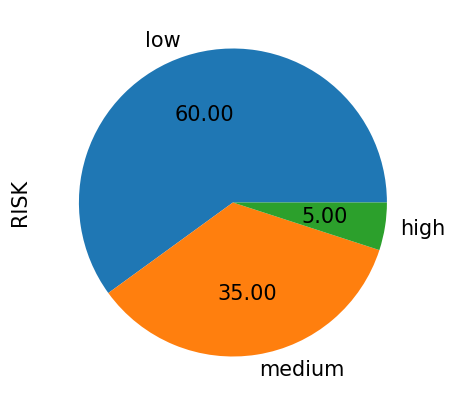

In [ ]:
# maintain same class % in train set
train_set.RISK.value_counts(normalize=True).plot(kind = 'pie', autopct='%.2f')

In [ ]:
# output
train_set.reset_index(drop=True).to_pickle('Task_3A_train.pkl')
test_set.reset_index(drop=True).to_pickle('Task_3A_test.pkl')

## Read train set

In [ ]:
train_set = pd.read_pickle("Task_3A_train.pkl")
train_set

,NAME,GENDER,occupation_risk,BIRTH_DT,CUST_ADD_DT,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_SUM_IN,CASH_CNT_IN,CASH_SUM_OUT,CASH_CNT_OUT,WIRES_SUM_IN,WIRES_CNT_IN,WIRES_SUM_OUT,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,RISK
0,Mary McenaXney Woods,Female,Low,1986-10-28,2011-03-03,1,1,0,Low,Low,"3,854.9780",6.0000,"6,795.6240",18.0000,"303,060.0000",115.0000,"261,828.0000",209.0000,-0.0003,-0.0008,0.0046,0.0018,0.0020,0.0036,-0.0009,-0.0036,-0.0034,-0.0038,0.0047,-0.0046,0.0028,-0.0034,0.0025,0.0023,0.0043,-0.0001,-0.0023,0.0013,0.0000,-0.0001,0.0039,-0.0025,-0.0020,-0.0007,0.0046,0.0042,-0.0038,0.0002,-0.0025,-0.0017,-0.0021,-0.0047,-0.0036,-0.0029,0.0029,0.0004,-0.0040,0.0016,-0.0038,-0.0038,-0.0037,-0.0049,-0.0017,-0.0015,-0.0026,0.0049,0.0034,0.0046,-0.0008,0.0029,-0.0022,0.0026,-0.0022,0.0028,-0.0030,0.0022,-0.0038,-0.0030,-0.0003,0.0004,-0.0034,0.0000,0.0020,0.0044,-0.0025,0.0036,0.0011,-0.0049,-0.0015,-0.0033,-0.0037,-0.0007,0.0035,0.0041,0.0041,0.0044,0.0037,-0.0036,0.0036,0.0025,-0.0019,0.0019,-0.0044,0.0042,0.0039,-0.0046,0.0003,0.0004,-0.0044,-0.0026,0.0015,0.0004,0.0029,0.0038,-0.0023,0.0008,0.0026,0.0050,low
1,Jason Hagen Liles Jackson,Male,Low,1950-10-12,2008-05-28,1,1,0,Low,Low,"60,350.0000",25.0000,"30,701.0000",18.0000,"6,207,312.0000",14.0000,"4,834,893.0000",90.0000,-0.0519,0.0072,0.0574,0.0437,0.0275,-0.0375,0.0375,0.0901,-0.1444,0.0825,-0.0571,0.0936,0.1133,-0.1364,0.2117,-0.1231,0.2267,0.0252,-0.0965,0.0385,0.0471,-0.1717,-0.2076,0.0113,-0.1039,0.1846,0.3228,-0.1164,-0.1764,0.0530,0.1808,0.1339,0.1247,-0.0440,-0.0759,-0.0172,0.0402,0.0905,0.0394,-0.0686,-0.2773,-0.2264,-0.0462,-0.1753,-0.0156,-0.2478,-0.0707,0.0497,-0.0189,-0.1724,-0.0455,-0.0421,0.0877,-0.0522,-0.1235,-0.0681,-0.1448,-0.0962,-0.0914,-0.1287,0.1821,0.1910,-0.1806,-0.3045,-0.0762,-0.1502,0.2329,-0.0319,-0.0395,0.1109,0.2864,-0.2161,0.1203,-0.0335,0.2316,0.0690,-0.0261,-0.0951,-0.0825,-0.0722,-0.0516,-0.0780,0.0617,-0.0285,-0.0125,-0.0939,0.0075,0.1119,0.0571,0.0104,-0.0355,-0.0779,-0.1785,-0.2155,-0.2469,0.0659,-0.0994,-0.0993,0.0893,-0.1370,medium
2,chris Pritt Robinson Daniels,Male,Low,1996-12-24,2017-01-12,1,1,0,Low,Low,165.6070,0.0000,"5,834.1380",18.0000,"35,042.0000",21.0000,"6,698.0000",10.0000,-0.0603,0.0071,0.1019,-0.0042,0.0606,0.0040,-0.0345,0.0903,-0.0775,0.0266,-0.0272,0.0367,0.0422,-0.0685,0.1782,-0.1041,0.0572,0.0589,-0.1306,0.0232,0.0188,-0.1143,-0.2157,-0.0372,0.0537,0.1918,0.3417,-0.1612,-0.1058,0.0015,0.1243,0.1000,0.0936,0.0480,-0.0535,-0.0210,-0.0154,0.0551,-0.0030,-0.0229,-0.2054,-0.2275,-0.1073,-0.0432,-0.0106,-0.2318,-0.1468,-0.0162,0.0245,-0.1409,-0.0629,-0.0632,0.0671,0.0076,-0.0589,-0.0368,-0.0865,-0.0641,-0.0975,-0.0583,0.0990,0.220

In [ ]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800000 entries, 0 to 799999
Columns: 119 entries, NAME to RISK
dtypes: category(8), datetime64[ns](2), float32(100), float64(8), object(1)
memory usage: 378.4+ MB


# Dataset preparation

## Manual transformers on df
- manual transformers on entire train_set, not X_train
- involve row remvoal

### Inconsistency: Detect Entry Error


Add
- Average transaction amt ($) = SUM / CNT for both incoming and outgoing cash flows (size of transaction, as a large sum can be due to a large count)
  - CASH_AVG_IN = CASH_SUM_IN / CASH_CNT_IN
  - CASH_AVG_OUT = CASH_SUM_OUT / CASH_CNT_OUT
  - WIRES_AVG_IN = WIRES_SUM_IN / WIRES_CNT_IN
  - WIRES_AVG_OUT = WIRES_SUM_OUT / WIRES_CNT_OUT

Entry error
  - if any AVG = 999_999_999 (default value when CNT = 0 but SUM != 0), the record is invalid due to data entry error

In [ ]:
train_clean = copy.deepcopy(train_set)
# $ Average transaction amt = SUM / CNT for both incoming and outgoing cash flows
train_clean['WIRES_AVG_IN'] = custom_division(train_clean.WIRES_SUM_IN, train_clean.WIRES_CNT_IN, default_value=999_999_999)
train_clean['WIRES_AVG_OUT'] = custom_division(train_clean.WIRES_SUM_OUT, train_clean.WIRES_CNT_OUT, default_value=999_999_999)
train_clean['CASH_AVG_IN'] = custom_division(train_clean.CASH_SUM_IN, train_clean.CASH_CNT_IN, default_value=999_999_999)
train_clean['CASH_AVG_OUT'] = custom_division(train_clean.CASH_SUM_OUT, train_clean.CASH_CNT_OUT, default_value=999_999_999)
train_clean

,NAME,GENDER,occupation_risk,BIRTH_DT,CUST_ADD_DT,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_SUM_IN,CASH_CNT_IN,CASH_SUM_OUT,CASH_CNT_OUT,WIRES_SUM_IN,WIRES_CNT_IN,WIRES_SUM_OUT,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,RISK,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT
0,Mary McenaXney Woods,Female,Low,1986-10-28,2011-03-03,1,1,0,Low,Low,"3,854.9780",6.0000,"6,795.6240",18.0000,"303,060.0000",115.0000,"261,828.0000",209.0000,0.0264,-0.0423,0.0293,0.0248,-0.0071,0.0137,-0.0239,-0.0340,0.0197,0.0388,low,"2,635.3043","1,252.7656",642.4963,377.5347
1,Jason Hagen Liles Jackson,Male,Low,1950-10-12,2008-05-28,1,1,0,Low,Low,"60,350.0000",25.0000,"30,701.0000",18.0000,"6,207,312.0000",14.0000,"4,834,893.0000",90.0000,-0.0420,-0.0424,-0.0616,0.0060,-0.0288,-0.0287,-0.0420,-0.0120,-0.0264,-0.0385,medium,"443,379.4286","53,721.0333","2,414.0000","1,705.6111"
2,chris Pritt Robinson Daniels,Male,Low,1996-12-24,2017-01-12,1,1,0,Low,Low,165.6070,0.0000,"5,834.1380",18.0000,"35,042.0000",21.0000,"6,698.0000",10.0000,0.0750,0.0860,0.0859,0.0569,0.0457,0.0208,-0.0240,0.0068,-0.0361,0.0591,low,"1,668.6667",669.8000,"999,999,999.0000",324.1188
3,"Schultz, erc Henand",Male,High,1965-05-04,2013-09-12,1,1,0,Low,Low,"26,259.0000",13.0000,"35,922.0000",15.0000,"3,517,833.0000",68.0000,"2,429,213.0000",116.0000,-0.0397,-0.0497,-0.0025,-0.0145,-0.0153,0.0415,-0.0402,-0.0213,0.0093,0.0499,medium,"51,732.8382","20,941.4914","2,019.9231","2,394.8000"
4,"Tesoriero, Olen Burns",Male,Low,1926-07-13,1985-09-26,1,1,1,Low,Low,"15,688.0000",7.0000,"2,433.0000",3.0000,"951,087.0000",15.0000,"1,479,541.0000",20.0000,-0.0136,-0.0052,-0.0073,0.0432,0.0462,0.0087,-0.0303,-0.0378,0.0105,-0.0238,medium,"63,405.8000","73,977.0500","2,241.1429",811.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799995,"Shepard, Betty Mercado Boesen",Female,Moderate,2005-01-07,2008-04-10,1,1,0,Low,Low,799.7210,2.0000,"7,823.5630",17.0000,"169,347.0000",73.0000,"128,734.0000",92.0000,0.0426,0.0104,0.0473,-0.0261,0.0493,0.0362,-0.0400,-0.0489,-0.0235,0.0349,low,"2,319.8219","1,399.2826",399.8605,460.2096
799996,"Huffman, Terry White Mellis",Male,Low,1953-12-15,1983-01-23,1,1,1,Low,Low,"23,739.7710",13.0000,"41,542.0000",50.0000,"3,541,579.0000",181.0000,"648,732.0000",110.0000,-0.0132,-0.0108,0.0033,0.0200,-0.0053,0.0335,0.0229,-0.0402,0.0088,-0.0277,high,"19,566.7348","5,897.5636","1,826.1362",830.8400
799997,"Jerome, Gene Ferraro White",Male,Low,1951-07-16,1987-04-28,1,1,0,Low,Low,"9,859.1690",9.0000,"3,361.7150",9.0000,"157,329.0000",56.0000,"97,755.0000",69.0000,0.0404,-0.0098,-0.0109,0.0392,-0.0204,0.0178,-0.0263,0.0245,-0.0007,0.0447,low,"2,809.4464","1,416.7391","1,095.4632",373.5239
799998,Lois Brand Lemon,Female,Low,2000-01-11,2007-01-31,1,1,0,Low,Low,397.1000,2.0000,"1,043.1940",4.0000,"90,755.0000",75.0000,"72,317.0000",118.0000,0.0051,-0.0309,-0.0190,-0.0350,0.0226,-0.0187,-0.0049,0.0099,-0.0081,-0.0094,low,"1,210.0667",612.8559,198.5500,260.7985


### Add dummy to indicate 999,999,999
- Add dummy variable to indicate 999_999_999 due to data entry error (CNT == 0 while SUM != 0)

In [ ]:
# rows with invalid data entry (CNT == 0 while SUM != 0)
EntryError_df = train_clean.loc[(train_clean == 999_999_999).any(axis=1), [x for x in train_clean.columns if ('_SUM_' in x) | ('_CNT_' in x) | (x == 'RISK')]]
EntryError_df

,CASH_SUM_IN,CASH_CNT_IN,CASH_SUM_OUT,CASH_CNT_OUT,WIRES_SUM_IN,WIRES_CNT_IN,WIRES_SUM_OUT,WIRES_CNT_OUT,RISK
2,165.6070,0.0000,"5,834.1380",18.0000,"35,042.0000",21.0000,"6,698.0000",10.0000,low
27,"1,191.7050",0.0000,"2,989.4020",9.0000,"149,033.0000",72.0000,"26,017.0000",65.0000,low
35,446.1770,1.0000,78.1460,0.0000,"21,369.0000",9.0000,"1,814.0000",3.0000,low
38,"4,349.4720",4.0000,90.3800,0.0000,"96,388.0000",22.0000,"78,030.0000",116.0000,low
52,644.4940,1.0000,160.5650,0.0000,"17,892.0000",1.0000,"1,783.0000",0.0000,low
...,...,...,...,...,...,...,...,...,...
799921,"1,784.4490",1.0000,10.7950,0.0000,"5,239.0000",22.0000,"40,393.0000",28.0000,low
799923,103.4910,0.0000,181.4510,1.0000,"146,424.0000",33.0000,"164,748.0000",141.0000,low
799968,828.0440,0.0000,"2,727.0570",8.0000,"60,823.0000",38.0000,"110,670.0000",83.0000,low
799970,97.0000,0.0000,"50,582.0000",55.0000,"9,168,951.0000",189.0000,"1,689,542.0000",89.0000,medium


In [ ]:
EntryError_df.RISK.value_counts(normalize=True)

low      0.7794
medium   0.1927
high     0.0279
Name: RISK, dtype: float64

In [ ]:
# CNT is not recorded as 0 due to threshold in SUM but due to data entry error
for CNT_col, SUM_col in [('CASH_CNT_IN', 'CASH_SUM_IN'), ('CASH_CNT_OUT', 'CASH_SUM_OUT'), ('WIRES_CNT_IN', 'WIRES_SUM_IN'), ('WIRES_CNT_OUT', 'WIRES_SUM_OUT')]:
  print(f'when {CNT_col} == 0, max({SUM_col}) = {EntryError_df[EntryError_df[CNT_col] == 0][SUM_col].max():,.2f}')
  print(f'when {CNT_col} != 0, min({SUM_col}) = {train_clean[train_clean[CNT_col] != 0][SUM_col].min():,.2f}')

when CASH_CNT_IN == 0, max(CASH_SUM_IN) = 12,030.00
when CASH_CNT_IN != 0, min(CASH_SUM_IN) = 40.43
when CASH_CNT_OUT == 0, max(CASH_SUM_OUT) = 12,557.00
when CASH_CNT_OUT != 0, min(CASH_SUM_OUT) = 9.00
when WIRES_CNT_IN == 0, max(WIRES_SUM_IN) = 14,805,018.00
when WIRES_CNT_IN != 0, min(WIRES_SUM_IN) = 2.00
when WIRES_CNT_OUT == 0, max(WIRES_SUM_OUT) = 4,464,132.00
when WIRES_CNT_OUT != 0, min(WIRES_SUM_OUT) = 10.00


In [ ]:
# add dummy variable to indicate data entry error
train_clean['DATA_ENTRY_ERROR'] = 0
train_clean.loc[train_clean.index.isin(EntryError_df.index), 'DATA_ENTRY_ERROR'] = 1
# replace 999_999_999 with 0
train_clean.replace(999_999_999, 0, inplace=True)
train_clean

,NAME,GENDER,occupation_risk,BIRTH_DT,CUST_ADD_DT,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_SUM_IN,CASH_CNT_IN,CASH_SUM_OUT,CASH_CNT_OUT,WIRES_SUM_IN,WIRES_CNT_IN,WIRES_SUM_OUT,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,RISK,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,DATA_ENTRY_ERROR
0,Mary McenaXney Woods,Female,Low,1986-10-28,2011-03-03,1,1,0,Low,Low,"3,854.9780",6.0000,"6,795.6240",18.0000,"303,060.0000",115.0000,"261,828.0000",209.0000,0.0264,-0.0423,0.0293,0.0248,-0.0071,0.0137,-0.0239,-0.0340,0.0197,0.0388,low,"2,635.3043","1,252.7656",642.4963,377.5347,0
1,Jason Hagen Liles Jackson,Male,Low,1950-10-12,2008-05-28,1,1,0,Low,Low,"60,350.0000",25.0000,"30,701.0000",18.0000,"6,207,312.0000",14.0000,"4,834,893.0000",90.0000,-0.0420,-0.0424,-0.0616,0.0060,-0.0288,-0.0287,-0.0420,-0.0120,-0.0264,-0.0385,medium,"443,379.4286","53,721.0333","2,414.0000","1,705.6111",0
2,chris Pritt Robinson Daniels,Male,Low,1996-12-24,2017-01-12,1,1,0,Low,Low,165.6070,0.0000,"5,834.1380",18.0000,"35,042.0000",21.0000,"6,698.0000",10.0000,0.0750,0.0860,0.0859,0.0569,0.0457,0.0208,-0.0240,0.0068,-0.0361,0.0591,low,"1,668.6667",669.8000,0.0000,324.1188,1
3,"Schultz, erc Henand",Male,High,1965-05-04,2013-09-12,1,1,0,Low,Low,"26,259.0000",13.0000,"35,922.0000",15.0000,"3,517,833.0000",68.0000,"2,429,213.0000",116.0000,-0.0397,-0.0497,-0.0025,-0.0145,-0.0153,0.0415,-0.0402,-0.0213,0.0093,0.0499,medium,"51,732.8382","20,941.4914","2,019.9231","2,394.8000",0
4,"Tesoriero, Olen Burns",Male,Low,1926-07-13,1985-09-26,1,1,1,Low,Low,"15,688.0000",7.0000,"2,433.0000",3.0000,"951,087.0000",15.0000,"1,479,541.0000",20.0000,-0.0136,-0.0052,-0.0073,0.0432,0.0462,0.0087,-0.0303,-0.0378,0.0105,-0.0238,medium,"63,405.8000","73,977.0500","2,241.1429",811.0000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799995,"Shepard, Betty Mercado Boesen",Female,Moderate,2005-01-07,2008-04-10,1,1,0,Low,Low,799.7210,2.0000,"7,823.5630",17.0000,"169,347.0000",73.0000,"128,734.0000",92.0000,0.0426,0.0104,0.0473,-0.0261,0.0493,0.0362,-0.0400,-0.0489,-0.0235,0.0349,low,"2,319.8219","1,399.2826",399.8605,460.2096,0
799996,"Huffman, Terry White Mellis",Male,Low,1953-12-15,1983-01-23,1,1,1,Low,Low,"23,739.7710",13.0000,"41,542.0000",50.0000,"3,541,579.0000",181.0000,"648,732.0000",110.0000,-0.0132,-0.0108,0.0033,0.0200,-0.0053,0.0335,0.0229,-0.0402,0.0088,-0.0277,high,"19,566.7348","5,897.5636","1,826.1362",830.8400,0
799997,"Jerome, Gene Ferraro White",Male,Low,1951-07-16,1987-04-28,1,1,0,Low,Low,"9,859.1690",9.0000,"3,361.7150",9.0000,"157,329.0000",56.0000,"97,755.0000",69.0000,0.0404,-0.0098,-0.0109,0.0392,-0.0204,0.0178,-0.0263,0.0245,-0.0007,0.0447,low,"2,809.4464","1,416.7391","1,095.4632",373.5239,0
799998,Lois Brand Lemon,Female,Low,2000-01-11,2007-01-31,1,1,0,Low,Low,397.1000,2.0000,"1,043.1940",4.0000,"90,755.0000",75.0000,"72,317.0000",118.0000,0.0051,-0.0309,-0.0190,-0.0350,0.0226,-0.0187,-0.0049,0.0099,-0.0081,-0.0094,low,"1,210.0667",612.8559,198.5500,260.7985,0


### Feature Engineering

*Placement: sum / count of cash flow*

• Example: customer deposits a total of $20,000 in cash using multiple transactions to
avoid reporting and detection of large cash deposits

*Layering*

• Customer receives an incoming wire from Country A for
$20,000, then sends an outgoing wire in the same
amount to Country B, or

• Customer makes a deposit to their account, then
transfers the funds to another of their accounts with
another financial institution

*Integration*

• Use illicit proceeds to purchase luxury assets such as real
estate, high end artwork, jewelry or vehicles

• A client opens an offshore bank account with a debit or credit
card to access the account. They wire illicit proceeds to this
offshore account, which are used for withdrawals or purchases

In [ ]:
def plot_percentiles(df, col_select = '', col_drop = None):
  fig, axes = plt.subplots(1,3, sharex = True, sharey = False, figsize = (20,5))

  # col_select = 'AVG'
  if col_select != '':
    if col_drop is None:
      norm_clean = pd.concat([
          df.select_dtypes(np.number)[[x for x in df.columns if col_select in x]].apply(lambda x: (x - x.mean()) / x.std()),
          df.RISK], axis = 1)
    else:
      norm_clean = pd.concat([
          df.select_dtypes(np.number)[[x for x in df.drop(columns = col_drop).columns if col_select in x]].apply(lambda x: (x - x.mean()) / x.std()),
          df.RISK], axis = 1)
  else:
    norm_clean = pd.concat([
        df.select_dtypes(np.number).apply(lambda x: (x - x.mean()) / x.std()),
        df.RISK], axis = 1)

  for ax, risk in zip(axes.flatten(), norm_clean.RISK.unique()):
    # norm_clean[norm_clean.RISK == risk].describe(percentiles = [.05, .25, .5, .75, .95], exclude=['category', 'object'], datetime_is_numeric=True).loc['25%':'75%',:].T.plot(kind = 'barh', ax = ax, legend = False)
    norm_clean[norm_clean.RISK == risk].select_dtypes(np.number).plot(kind='box', vert=False, showfliers=False, ax = ax)
    ax.set_title(f"Risk = {risk}")
    # ax.set_yticks(ticks = np.arange(1,6,1), labels = [])
    ax.axvline(0, ls = '--')
    ax.axvline(1, ls = '--')
    ax.axvline(-1, ls = '--')
    ax.set_xlim(-1.5, 1.5)

  plt.subplots_adjust(hspace = 0.2)
  plt.suptitle('25th percentile, median, 75th percentile and 1.5 x IQR', fontsize = 20)
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

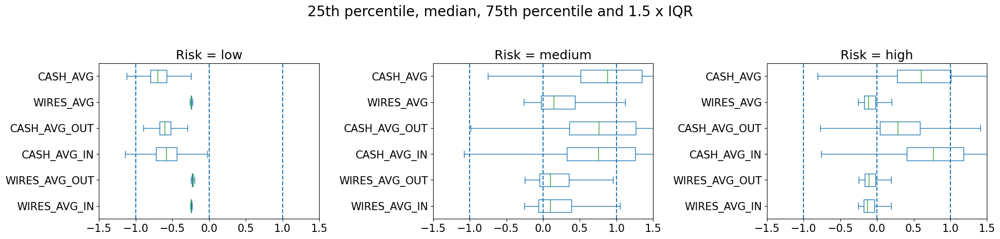

In [ ]:
train_clean2 = copy.deepcopy(train_clean)

train_clean2['TOTAL_AVG'] = custom_division((train_clean2.WIRES_SUM_IN + train_clean2.WIRES_SUM_OUT + train_clean2.CASH_SUM_IN + train_clean2.CASH_SUM_OUT),
                                            (train_clean2.WIRES_CNT_IN + train_clean2.WIRES_CNT_OUT + train_clean2.CASH_CNT_IN + train_clean2.CASH_CNT_OUT))
train_clean2['WIRES_AVG'] = custom_division((train_clean2.WIRES_SUM_IN + train_clean2.WIRES_SUM_OUT),
                                            (train_clean2.WIRES_CNT_IN + train_clean2.WIRES_CNT_OUT))
train_clean2['CASH_AVG'] = custom_division((train_clean2.CASH_SUM_IN + train_clean2.CASH_SUM_OUT),
                                            (train_clean2.CASH_CNT_IN + train_clean2.CASH_CNT_OUT))
train_clean2['IN_AVG'] = custom_division((train_clean2.WIRES_SUM_IN + train_clean2.CASH_SUM_IN),
                                            (train_clean2.WIRES_CNT_IN + train_clean2.CASH_CNT_IN))
train_clean2['OUT_AVG'] = custom_division((train_clean2.WIRES_SUM_OUT + train_clean2.CASH_SUM_OUT),
                                            (train_clean2.WIRES_CNT_OUT + train_clean2.CASH_CNT_OUT))
train_clean2.drop(columns = [
    # need to split between WIRES and CASH (magnitude)
    'TOTAL_AVG', 'IN_AVG', 'OUT_AVG',
], inplace = True)

plot_percentiles(train_clean2, 'AVG')

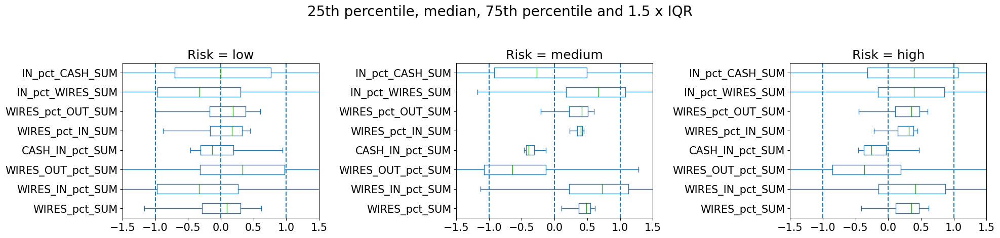

In [ ]:
train_clean2 = copy.deepcopy(train_clean)

train_clean2['TOTAL_SUM'] = (train_clean2.WIRES_SUM_IN + train_clean2.WIRES_SUM_OUT + train_clean2.CASH_SUM_IN + train_clean2.CASH_SUM_OUT)
train_clean2['TOTAL_IN_SUM'] = (train_clean2.WIRES_SUM_IN + train_clean2.CASH_SUM_IN)
train_clean2['TOTAL_OUT_SUM'] = (train_clean2.WIRES_SUM_OUT + train_clean2.CASH_SUM_OUT)
train_clean2['TOTAL_WIRES_SUM'] = (train_clean2.WIRES_SUM_IN + train_clean2.WIRES_SUM_OUT)
train_clean2['TOTAL_CASH_SUM'] = (train_clean2.CASH_SUM_IN + train_clean2.CASH_SUM_OUT)

train_clean2['WIRES_pct_SUM'] = custom_division(train_clean2.TOTAL_WIRES_SUM, train_clean2.TOTAL_SUM)

train_clean2['WIRES_IN_pct_SUM'] = custom_division(train_clean2.WIRES_SUM_IN, train_clean2.TOTAL_SUM)
train_clean2['WIRES_OUT_pct_SUM'] = custom_division(train_clean2.WIRES_SUM_OUT, train_clean2.TOTAL_SUM)
train_clean2['CASH_IN_pct_SUM'] = custom_division(train_clean2.CASH_SUM_IN, train_clean2.TOTAL_SUM)

train_clean2['WIRES_pct_IN_SUM'] = custom_division(train_clean2.WIRES_SUM_IN, train_clean2.TOTAL_IN_SUM)
train_clean2['WIRES_pct_OUT_SUM'] = custom_division(train_clean2.WIRES_SUM_OUT, train_clean2.TOTAL_OUT_SUM)

train_clean2['IN_pct_WIRES_SUM'] = custom_division(train_clean2.WIRES_SUM_IN, train_clean2.TOTAL_WIRES_SUM)
train_clean2['IN_pct_CASH_SUM'] = custom_division(train_clean2.CASH_SUM_IN, train_clean2.TOTAL_CASH_SUM)


train_clean2.drop(columns = [
    # drop TOTAL (only created for ease of calculation)
    'TOTAL_SUM', 'TOTAL_IN_SUM', 'TOTAL_OUT_SUM', 'TOTAL_WIRES_SUM', 'TOTAL_CASH_SUM',
    # drop SUM 
    'WIRES_SUM_IN', 'WIRES_SUM_OUT', 'CASH_SUM_IN', 'CASH_SUM_OUT'

], inplace = True)

plot_percentiles(train_clean2, 'SUM')

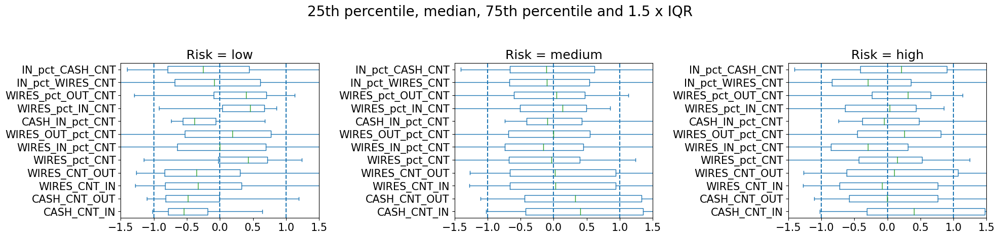

In [ ]:
train_clean2 = copy.deepcopy(train_clean)

train_clean2['TOTAL_CNT'] = (train_clean2.WIRES_CNT_IN + train_clean2.WIRES_CNT_OUT + train_clean2.CASH_CNT_IN + train_clean2.CASH_CNT_OUT)
train_clean2['TOTAL_IN_CNT'] = (train_clean2.WIRES_CNT_IN + train_clean2.CASH_CNT_IN)
train_clean2['TOTAL_OUT_CNT'] = (train_clean2.WIRES_CNT_OUT + train_clean2.CASH_CNT_OUT)
train_clean2['TOTAL_WIRES_CNT'] = (train_clean2.WIRES_CNT_IN + train_clean2.WIRES_CNT_OUT)
train_clean2['TOTAL_CASH_CNT'] = (train_clean2.CASH_CNT_IN + train_clean2.CASH_CNT_OUT)

train_clean2['WIRES_pct_CNT'] = custom_division(train_clean2.TOTAL_WIRES_CNT, train_clean2.TOTAL_CNT)

train_clean2['WIRES_IN_pct_CNT'] = custom_division(train_clean2.WIRES_CNT_IN, train_clean2.TOTAL_CNT)
train_clean2['WIRES_OUT_pct_CNT'] = custom_division(train_clean2.WIRES_CNT_OUT, train_clean2.TOTAL_CNT)
train_clean2['CASH_IN_pct_CNT'] = custom_division(train_clean2.CASH_CNT_IN, train_clean2.TOTAL_CNT)

train_clean2['WIRES_pct_IN_CNT'] = custom_division(train_clean2.WIRES_CNT_IN, train_clean2.TOTAL_IN_CNT)
train_clean2['WIRES_pct_OUT_CNT'] = custom_division(train_clean2.WIRES_CNT_OUT, train_clean2.TOTAL_OUT_CNT)

train_clean2['IN_pct_WIRES_CNT'] = custom_division(train_clean2.WIRES_CNT_IN, train_clean2.TOTAL_WIRES_CNT)
train_clean2['IN_pct_CASH_CNT'] = custom_division(train_clean2.CASH_CNT_IN, train_clean2.TOTAL_CASH_CNT)


train_clean2.drop(columns = [
    # 
    'TOTAL_CNT', 'TOTAL_IN_CNT', 'TOTAL_OUT_CNT', 'TOTAL_WIRES_CNT', 'TOTAL_CASH_CNT'
], inplace = True)

plot_percentiles(train_clean2, 'CNT', ['RES_CNTRY_CA', 'CNTRY_OF_INCOME_CA'])

### ManualTransformer

Normal cost-efficient but slow transactions
- use EMT for small amount
- use wires transfer for large amount
- use as few transactions as possible to save transaction fee
- maximize EMT limit before using wires transfer

Abnormal cost-inefficient but fast transactions
- use as many transactions as possible
- use wires transfer to avoid caps in EMT

Transfer limit
- EMT trasnfer: minimum = CAD0.01, maximum = CAD25k per transaction
- Wire transfer limit: minimum = CAD100
- https://help.scotiabank.com/article/how-much-can-i-send-with-scotia-international-money-transfer?origin=help-center


Money Laundering indicators involving transactions (https://fintrac-canafe.canada.ca/guidance-directives/transaction-operation/indicators-indicateurs/fin_mltf-eng)
- Client frequents multiple locations utilizing cash, prepaid credit cards or money orders/cheques/drafts to send wire transfers overseas.
  - high count of transactions
- Funds are deposited or received into several accounts and then consolidated into one before transferring the funds outside the country.
  - multiple IN_CNT
  - there are no limits in accepting e-transfer https://help.scotiabank.com/article/are-there-interac-e-transfer-limits?origin=scotia-connect
- Immediately after transferred funds have cleared, the client moves funds, to another account or to another person or entity.
  - IN_SUM similar to OUT_SUM
- Client sending to, or receiving wire transfers from, multiple clients.
  - high IN_CNT, high OUT_CNT

Feature creation
- missingness in NAME
  - inability to properly identify the client or there are questions surrounding the client's identity
- AGE (float) = (Today (2023 Jan 01) - BIRTH_DT) / 365.25
- HIST_JOIN (float) = Age when customer joined = (CUST_ADD_DT - BIRTH_DT) / 365.25
- AVG
  - WIRES_AVG_IN
  - WIRES_AVG_OUT
  - CASH_AVG_IN
  - CASH_AVG_OUT
  - drop data entry errors

- ratio of AVG
  - WIRES vs CASH
    - WIRES_VS_CASH_AVG
  - WIRES_IN vs WIRES_OUT
    - IN_VS_OUT_WIRES_AVG
  - CASH_IN vs CASH_OUT
    - IN_VS_OUT_CASH_AVG
- % of CNT
  - % of TOTAL_CNT
    - WIRES_pct_CNT
  - % of TOTAL_WIRES_CNT
    - IN_pct_WIRES_CNT
  - % of TOTAL_CASH_CNT
    - IN_pct_CASH_CNT
- ratio of CNT vs AVG
  - WIRES_IN_CNT_VS_AVG
  - WIRES_OUT_CNT_VS_AVG
  - CASH_IN_CNT_VS_AVG
  - CASH_OUT_CNT_VS_AVG

Drop
  - NAME, BIRTH_DT, CUST_ADD_DT
  - SUM: CASH_SUM_IN, CASH_SUM_OUT, WIRES_SUM_IN, WIRES_SUM_OUT
  - helper columns for SUM, CNT and AVG



In [ ]:
dataset_preparation = make_pipeline(
    ManualTransformer()
)

In [ ]:
train_clean = dataset_preparation.fit_transform(train_set)
train_clean

,GENDER,occupation_risk,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,RISK,MISSING_NAME,DIFF_CNTRY,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,DATA_ENTRY_ERROR,TOTAL_SUM,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE
0,Female,Low,1,1,0,Low,Low,6.0000,18.0000,115.0000,209.0000,-0.0003,-0.0008,0.0046,0.0018,0.0020,0.0036,-0.0009,-0.0036,-0.0034,-0.0038,0.0047,-0.0046,0.0028,-0.0034,0.0025,0.0023,0.0043,-0.0001,-0.0023,0.0013,0.0000,-0.0001,0.0039,-0.0025,-0.0020,-0.0007,0.0046,0.0042,-0.0038,0.0002,-0.0025,-0.0017,-0.0021,-0.0047,-0.0036,-0.0029,0.0029,0.0004,-0.0040,0.0016,-0.0038,-0.0038,-0.0037,-0.0049,-0.0017,-0.0015,-0.0026,0.0049,0.0034,0.0046,-0.0008,0.0029,-0.0022,0.0026,-0.0022,0.0028,-0.0030,0.0022,-0.0038,-0.0030,-0.0003,0.0004,-0.0034,0.0000,0.0020,0.0044,-0.0025,0.0036,0.0011,-0.0049,-0.0015,-0.0033,-0.0037,-0.0007,0.0035,0.0041,0.0041,0.0044,0.0037,-0.0036,0.0036,0.0025,-0.0019,0.0019,-0.0044,0.0042,0.0039,-0.0046,0.0003,0.0004,-0.0044,-0.0026,0.0015,0.0004,0.0029,0.0038,-0.0023,0.0008,0.0026,0.0050,low,0,0,36.1780,11.8330,"2,635.3043","1,252.7656",642.4963,377.5347,0,"575,538.6020",3.9288,2.1036,1.7018,0.9310,0.3549,0.2500,0.0436,0.1668,0.0093,0.0477,"-2,940.6460","41,232.0000"
1,Male,Low,1,1,0,Low,Low,25.0000,18.0000,14.0000,90.0000,-0.0519,0.0072,0.0574,0.0437,0.0275,-0.0375,0.0375,0.0901,-0.1444,0.0825,-0.0571,0.0936,0.1133,-0.1364,0.2117,-0.1231,0.2267,0.0252,-0.0965,0.0385,0.0471,-0.1717,-0.2076,0.0113,-0.1039,0.1846,0.3228,-0.1164,-0.1764,0.0530,0.1808,0.1339,0.1247,-0.0440,-0.0759,-0.0172,0.0402,0.0905,0.0394,-0.0686,-0.2773,-0.2264,-0.0462,-0.1753,-0.0156,-0.2478,-0.0707,0.0497,-0.0189,-0.1724,-0.0455,-0.0421,0.0877,-0.0522,-0.1235,-0.0681,-0.1448,-0.0962,-0.0914,-0.1287,0.1821,0.1910,-0.1806,-0.3045,-0.0762,-0.1502,0.2329,-0.0319,-0.0395,0.1109,0.2864,-0.2161,0.1203,-0.0335,0.2316,0.0690,-0.0261,-0.0951,-0.0825,-0.0722,-0.0516,-0.0780,0.0617,-0.0285,-0.0125,-0.0939,0.0075,0.1119,0.0571,0.0104,-0.0355,-0.0779,-0.1785,-0.2155,-0.2469,0.0659,-0.0994,-0.0993,0.0893,-0.1370,medium,0,0,72.2218,14.5955,"443,379.4286","53,721.0333","2,414.0000","1,705.6111",0,"11,133,256.0000",50.1425,8.2534,1.4153,0.7075,0.1346,0.5814,0.0000,0.0017,0.0104,0.0106,"29,649.0000","1,372,419.0000"
2,Male,Low,1,1,0,Low,Low,0.0000,18.0000,21.0000,10.0000,-0.0603,0.0071,0.1019,-0.0042,0.0606,0.0040,-0.0345,0.0903,-0.0775,0.0266,-0.0272,0.0367,0.0422,-0.0685,0.1782,-0.1041,0.0572,0.0589,-0.1306,0.0232,0.

## Outliers removal
- Check min, max or IQR
  - Alternative: isolation forest (less interpretable)
- Outliers
  - min and max AGE seems wrong (3 and 142 years old)
    - [Scotiabank: No limit in minimum age](https://www.scotiabank.com/ca/en/personal/bank-accounts/students/getting-there-savings-program-youth.html#:~:text=Children%20under%2012%20must%20be,able%20to%20provide%20adequate%20ID.) as children under 12 can open an account while being accompanied by a parent or legal guardian 
    - Oldest person living = [(Guineness Record) 118 years old](https://www.guinnessworldrecords.com/world-records/84549-oldest-person-living)
  - min WIRES_AVG_IN and WIRES_AVG_OUT should be at least CAD100? https://help.scotiabank.com/article/how-much-can-i-send-with-scotia-international-money-transfer?origin=help-center 
- Binning data with QuantileTransformer
- Risk of removing the most important subset (e.g. high risk class that is rare?)

In [ ]:
train_clean.describe()

,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,TOTAL_SUM,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE
count,"800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","796,725.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000","800,000.0000"
mean,8.5951,23.1592,85.3944,152.4242,-0.0265,-0.0086,0.0370,0.0043,0.0361,0.0040,0.0046,0.0237,-0.0459,0.0183,-0.0163,0.0071,0.0195,-0.0252,0.0838,-0.0483,0.0472,0.0221,-0.0476,-0.0004,0.0223,-0.0440,-0.0649,0.0070,0.0055,0.0518,0.1255,-0.0623,-0.0523,0.0189,0.0873,0.0530,0.0550,0.0137,-0.0343,-0.0060,0.0027,0.0275,0.0136,-0.0344,-0.0963,-0.0704,-0.0347,-0.0250,-0.0035,-0.0881,-0.0624,0.0064,0.0026,-0.0491,-0.0310,-0.0306,0.0174,0.0076,-0.0370,-0.0057,-0.0361,-0.0225,-0.0454,-0.0275,0.0382,0.0735,-0.0901,-0.0901,-

In [ ]:
outlier_df = train_set.loc[train_clean[train_clean.AGE >= 118].index, ['NAME', 'BIRTH_DT', 'RISK']].sort_values('BIRTH_DT')
outlier_df

,NAME,BIRTH_DT,RISK
681659,"Kessler, Sherry Dusel Vanmeter",1880-09-10,low
434473,Rebecca Mayne Newman Paik,1884-08-18,low
562348,Angel Minor paocs Marsh,1887-03-31,low
485288,Shane Robertson Gauted Denison,1887-07-14,low
78617,Sharon Eunabks Jobe,1891-07-16,low
...,...,...,...
749908,"Dunaway, Joseph Mangon Shea",1904-11-06,low
164113,"Colucci, Lora Yingling",1904-11-16,low
73398,"Reese, Robert Tran",1904-11-23,low
387780,Jacqueline Manning Howard,1904-11-27,low


In [ ]:
outlier_df.RISK.value_counts()

low       124
medium      0
high        0
Name: RISK, dtype: int64

In [ ]:
dataset_preparation.steps.append(('outlierremoval', OutlierRemoval()))

In [ ]:
dataset_preparation

Pipeline(steps=[('manualtransformer', ManualTransformer()),
                ('outlierremoval', OutlierRemoval())])

In [ ]:
dataset_preparation.fit(train_set)
train_clean = dataset_preparation.transform(train_set)
train_clean

,GENDER,occupation_risk,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,RISK,MISSING_NAME,DIFF_CNTRY,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,DATA_ENTRY_ERROR,TOTAL_SUM,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE
0,Female,Low,1,1,0,Low,Low,6.0000,18.0000,115.0000,209.0000,-0.0003,-0.0008,0.0046,0.0018,0.0020,0.0036,-0.0009,-0.0036,-0.0034,-0.0038,0.0047,-0.0046,0.0028,-0.0034,0.0025,0.0023,0.0043,-0.0001,-0.0023,0.0013,0.0000,-0.0001,0.0039,-0.0025,-0.0020,-0.0007,0.0046,0.0042,-0.0038,0.0002,-0.0025,-0.0017,-0.0021,-0.0047,-0.0036,-0.0029,0.0029,0.0004,-0.0040,0.0016,-0.0038,-0.0038,-0.0037,-0.0049,-0.0017,-0.0015,-0.0026,0.0049,0.0034,0.0046,-0.0008,0.0029,-0.0022,0.0026,-0.0022,0.0028,-0.0030,0.0022,-0.0038,-0.0030,-0.0003,0.0004,-0.0034,0.0000,0.0020,0.0044,-0.0025,0.0036,0.0011,-0.0049,-0.0015,-0.0033,-0.0037,-0.0007,0.0035,0.0041,0.0041,0.0044,0.0037,-0.0036,0.0036,0.0025,-0.0019,0.0019,-0.0044,0.0042,0.0039,-0.0046,0.0003,0.0004,-0.0044,-0.0026,0.0015,0.0004,0.0029,0.0038,-0.0023,0.0008,0.0026,0.0050,low,0,0,36.1780,11.8330,"2,635.3043","1,252.7656",642.4963,377.5347,0,"575,538.6020",3.9288,2.1036,1.7018,0.9310,0.3549,0.2500,0.0436,0.1668,0.0093,0.0477,"-2,940.6460","41,232.0000"
1,Male,Low,1,1,0,Low,Low,25.0000,18.0000,14.0000,90.0000,-0.0519,0.0072,0.0574,0.0437,0.0275,-0.0375,0.0375,0.0901,-0.1444,0.0825,-0.0571,0.0936,0.1133,-0.1364,0.2117,-0.1231,0.2267,0.0252,-0.0965,0.0385,0.0471,-0.1717,-0.2076,0.0113,-0.1039,0.1846,0.3228,-0.1164,-0.1764,0.0530,0.1808,0.1339,0.1247,-0.0440,-0.0759,-0.0172,0.0402,0.0905,0.0394,-0.0686,-0.2773,-0.2264,-0.0462,-0.1753,-0.0156,-0.2478,-0.0707,0.0497,-0.0189,-0.1724,-0.0455,-0.0421,0.0877,-0.0522,-0.1235,-0.0681,-0.1448,-0.0962,-0.0914,-0.1287,0.1821,0.1910,-0.1806,-0.3045,-0.0762,-0.1502,0.2329,-0.0319,-0.0395,0.1109,0.2864,-0.2161,0.1203,-0.0335,0.2316,0.0690,-0.0261,-0.0951,-0.0825,-0.0722,-0.0516,-0.0780,0.0617,-0.0285,-0.0125,-0.0939,0.0075,0.1119,0.0571,0.0104,-0.0355,-0.0779,-0.1785,-0.2155,-0.2469,0.0659,-0.0994,-0.0993,0.0893,-0.1370,medium,0,0,72.2218,14.5955,"443,379.4286","53,721.0333","2,414.0000","1,705.6111",0,"11,133,256.0000",50.1425,8.2534,1.4153,0.7075,0.1346,0.5814,0.0000,0.0017,0.0104,0.0106,"29,649.0000","1,372,419.0000"
2,Male,Low,1,1,0,Low,Low,0.0000,18.0000,21.0000,10.0000,-0.0603,0.0071,0.1019,-0.0042,0.0606,0.0040,-0.0345,0.0903,-0.0775,0.0266,-0.0272,0.0367,0.0422,-0.0685,0.1782,-0.1041,0.0572,0.0589,-0.1306,0.0232,0.

## dump as dataset_preparation.joblib

In [ ]:
dump(dataset_preparation, f'dataset_preparation.joblib') 

['dataset_preparation.joblib']

## load dataset_preparation()

In [ ]:
dataset_preparation = load('dataset_preparation.joblib')
dataset_preparation

Pipeline(steps=[('manualtransformer', ManualTransformer()),
                ('outlierremoval', OutlierRemoval())])

# X, y, sample weights split()

In [ ]:
# make a copy and split X and y
X_train = train_clean.drop(columns = ["RISK", "TOTAL_SUM"]).reset_index(drop = True).copy(deep = True)
y_train = train_clean["RISK"].reset_index(drop = True)
sample_weights_train = train_clean["TOTAL_SUM"].reset_index(drop = True)

# Exploratory data analysis (EDA)
- Check if all the information needed (to solve the data mining goals) is actually available
- what additional information would be helpful?
- Analyze basic statistics and relate the results to their meaning in business terms

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 799876 entries, 0 to 799875
Data columns (total 42 columns):
 #   Column                  Non-Null Count   Dtype   
---  ------                  --------------   -----   
 0   GENDER                  799350 non-null  category
 1   occupation_risk         794764 non-null  category
 2   RES_CNTRY_CA            799876 non-null  category
 3   CNTRY_OF_INCOME_CA      799876 non-null  category
 4   PEP_FL                  799876 non-null  category
 5   COUNTRY_RISK_INCOME     799876 non-null  category
 6   COUNTRY_RISK_RESIDENCY  799876 non-null  category
 7   CASH_CNT_IN             799876 non-null  float64 
 8   CASH_CNT_OUT            799876 non-null  float64 
 9   WIRES_CNT_IN            799876 non-null  float64 
 10  WIRES_CNT_OUT           799876 non-null  float64 
 11  embedding_0             799876 non-null  float32 
 12  embedding_1             799876 non-null  float32 
 13  embedding_2             799876 non-null  float32 
 14  embe

## nominal, ordinal, ratio scale
- nominal
  - order doesn't matter
- ordinal
  - order matters but difference is not in fixed interval
- interval
  - order matters + fixed interval 
- ratio
  - order matters + fixed interval + only positive

## Univariate analysis
- compute basic statistics (e.g., compute distribution, average, max, min, standard deviation, variance, mode, skewness, etc.)
- histogram

### Numerical
- WIRES_AVG >> CASH_AVG
- WIRES_CNT >> CASH_CNT
- Outliers
  - min and max AGE seems wrong (3 and 142 years old)
  - min WIRES_AVG_IN and WIRES_AVG_OUT should be at least CAD100?

In [ ]:
# numeric columns
X_train.describe(exclude='category')

,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE
count,"799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","796,602.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000"
mean,8.5958,23.1592,85.3958,152.4303,0.0005,0.0000,0.0007,0.0007,0.0009,-0.0016,0.0001,-0.0011,0.0003,0.0009,50.8193,18.3878,"63,423.9817","13,739.8088","1,422.4778",855.7444,16.9554,3.8299,2.1515,0.8554,0.3780,0.3048,0.0266,0.0851,0.0067,0.0403,"-8,323.8690","2,028,216.5298"
std,8.4222,20.8908,66.7855,120.1870,0.0446,0.0433,0.0444,0.0439,0.0450,0.0426,0.0437,0.0437,0.0456,0.0435,18.2205,9.9330,"246,940.3777","54,887.4396","1,097.5609",860.6779,51.2609,5.4785,1.5801,0.1166,0.1790,0.2165,0.0503,0.1174,0.0054,0.0356,"27,052.5238","4,030,764.3958"
min,0.0000,0.0000,0.0000,0.0000,-1.6560,-2.0298,-1.6732,-1.5322,-1.7691,-1.8562,-2.1529,-1.8988,-1.9394,-1.2823,3.2580,0.4353,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"-261,308.0000","-8,245,232.0000"
25%,3.0000,8.0000,33.0000,59.0000,-0.0272,-0.0275,-0.0271,-0.0270,-0.0270,-0.0287,-0.0274,-0.0282,-0.0274,-0.0269,38.1300,10.8118,"2,108.0962","1,099.0915",721.7201,315.4328,3.1035,1.6727,1.3239,0.8211,0.2547,0.1429,0.0014,0.0098,0.0025,0.0130,"-8,909.0287","-16,769.7500"
50%,6.0000,17.0000,71.0000,126.0000,0.0003,0.0001,0.0005,0.0006,0.0005,-0.0013,0.0002,-0.0007,0.0002,0.0006,50.7734,17.6564,"4,240.9693","1,854.5982",982.1253,437.0924,5.3213,2.5274,1.9691,0.8869,0.3597,0.2593,0.0083,0.0400,0.0055,0.0307,"-1,814.9595","82,371.0000"
75%,11.0000,32.0000,122.0000,218.0000,0.0279,0.0277,0.0281,0.0282,0.0281,0.0263,0.0276,0.0269,0.0278,0.0282,63.2799,25.0048,"58,549.2500","13,295.9467","2,045.5000","1,286.2131",17.5213,4.3862,2.7006,0.9292,0.4807,0.4194,0.0371,0.1256,0.0098,0.0577,"2,002.6255","2,319,931.0000"
max,79.0000,198.0000,605.0000,"1,083.0000",2.0136,1.2894,2.2125,2.4175,2.6381,1.5588,2.1877,1.8347,2.3784,1.9474,117.9904,73.8891,"26,065,364.0000","6,227,514.0000","21,692.0000","28,133.0000","9,785.2173","1,001.0068",427.0222,1.0000,1.0000,1.0000,10.9700,22.7611,0.0506,0.3934,"149,791.4900","36,581,952.0000"


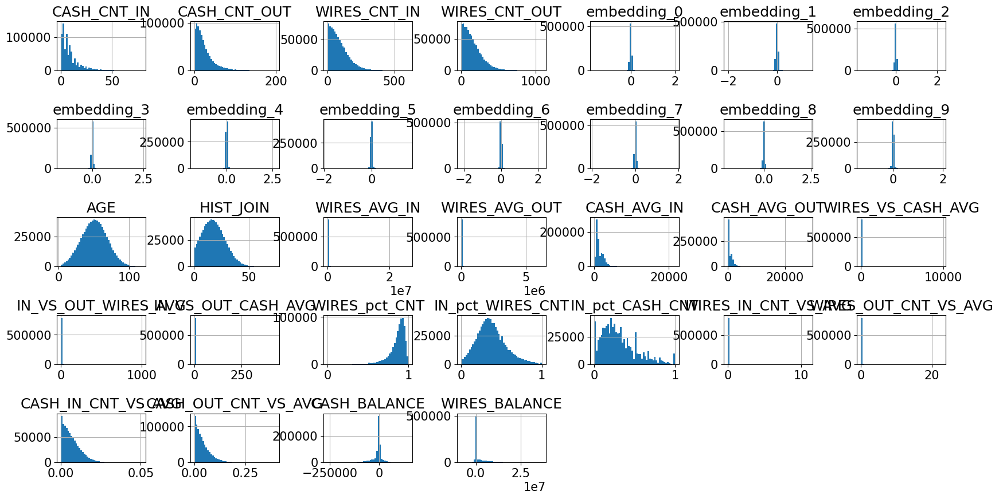

In [ ]:
X_train.hist(bins = 50, layout = (5, int(X_train.select_dtypes(include = np.number).shape[1] / 5) + 1), figsize= (20,10))
plt.subplots_adjust(wspace=0.5, hspace=1)
plt.show()

### Categorical
- These categorical features have > 90% in 1 category
  - RES_CNTRY_CA
  - CNTRY_OF_INCOME_CA
  - PEP_FL
  - COUNTRY_RISK_INCOME
  - COUNTRY_RISK_RESIDENCY

In [ ]:
# category columns
X_train.describe(include='category')

,GENDER,occupation_risk,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,MISSING_NAME,DIFF_CNTRY,DATA_ENTRY_ERROR
count,799350,794764,799876,799876,799876,799876,799876,799876,799876,799876
unique,2,3,2,2,2,3,3,2,2,2
top,Female,Low,1,1,0,Low,Low,0,0,0
freq,438958,511951,788437,790701,721937,797091,791961,799326,780134,749765


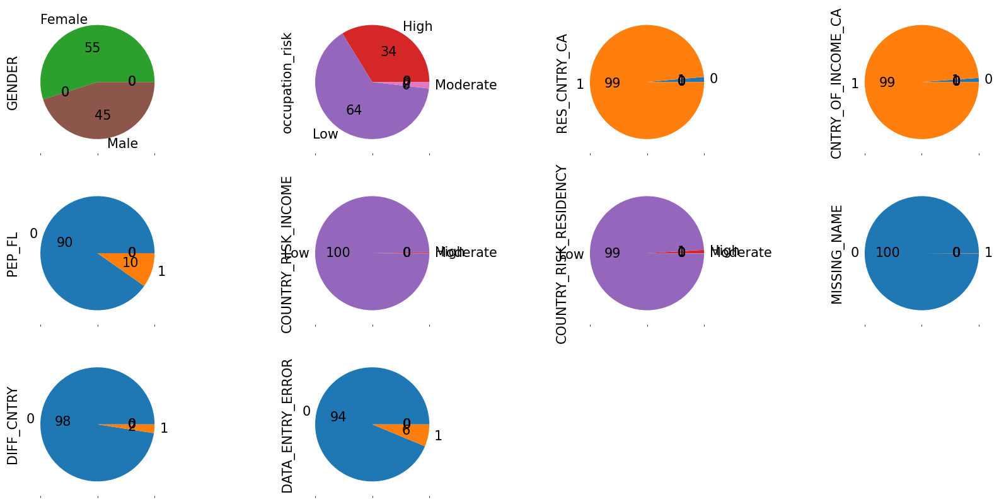

In [ ]:
X_train.select_dtypes(include = 'category').apply(lambda x: x.value_counts(normalize=True)).\
plot(kind = 'pie', subplots = True, autopct='%.0f', layout = (3,4), figsize = (20, 10), legend = False)
plt.subplots_adjust(wspace = 0.8)
plt.show()

### Class imbalance

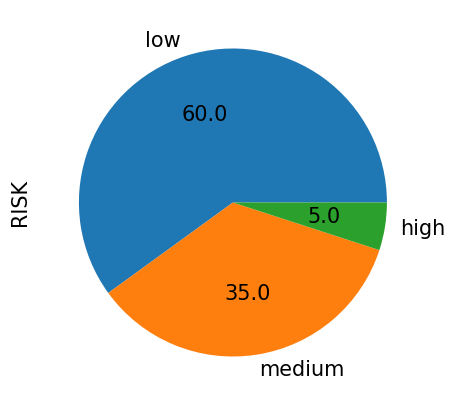

In [ ]:
y_train.value_counts(normalize=True).plot(kind = 'pie', autopct='%.1f', figsize = (5, 5), legend = False)
plt.show()

## Multivariate analysis



### Correlation
- numerical vs numerical
  - correlation matrix
  - sns pairplot
- categorical vs categorical
  - uncertainty coefficient (asymmetrical information)
- numerical vs categorical
  - grouped bar chart

#### Numerical

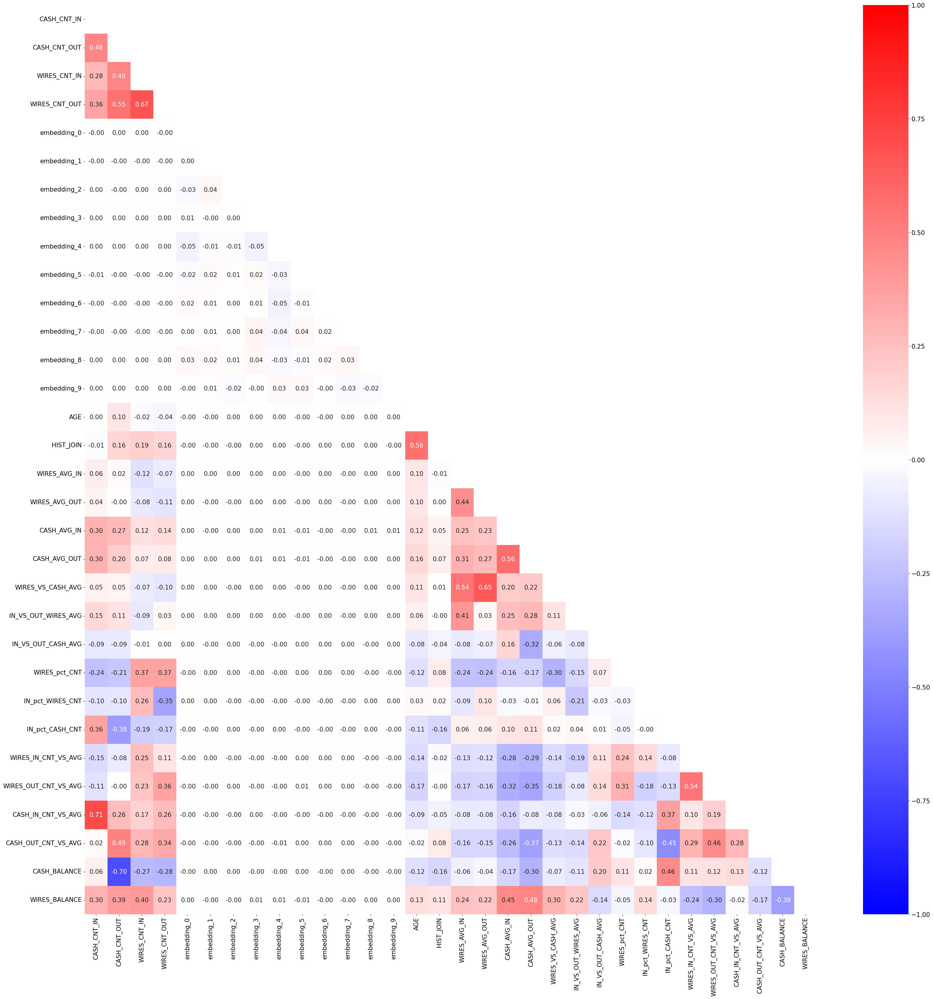

In [ ]:
corr_mat = X_train.corr()
plt.figure(figsize=(40,40))
sns.heatmap(
    corr_mat, 
    annot=True, 
    vmin=-1, vmax=1, 
    mask = np.triu(corr_mat),  # to show only lower triangle
    cmap = 'bwr',
    fmt = '.2f') 
plt.show()

#### Categorical

In [ ]:
# https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9
# https://www.kaggle.com/code/shakedzy/alone-in-the-woods-using-theil-s-u-for-survival/notebook
def conditional_entropy(x,y):
    # entropy of x given y
    y_counter = Counter(y)
    xy_counter = Counter(list(zip(x,y)))
    total_occurrences = sum(y_counter.values())
    entropy = 0
    for xy in xy_counter.keys():
        p_xy = xy_counter[xy] / total_occurrences
        p_y = y_counter[xy[1]] / total_occurrences
        entropy += p_xy * math.log(p_y/p_xy)
    return entropy

def theil_u(x,y):
    s_xy = conditional_entropy(x,y)
    x_counter = Counter(x)
    total_occurrences = sum(x_counter.values())
    p_x = list(map(lambda n: n/total_occurrences, x_counter.values()))
    s_x = ss.entropy(p_x)
    if s_x == 0:
        return 1
    else:
        return (s_x - s_xy) / s_x

In [ ]:
uncertainty_coef = pd.DataFrame([(col1, col2, theil_u(train_clean[col1], train_clean[col2])) for col1, col2 in permutations(pd.concat([X_train.select_dtypes('category'), y_train], axis=1), 2)],
                                columns =['if we know', 'do we know', 'theil_U'])

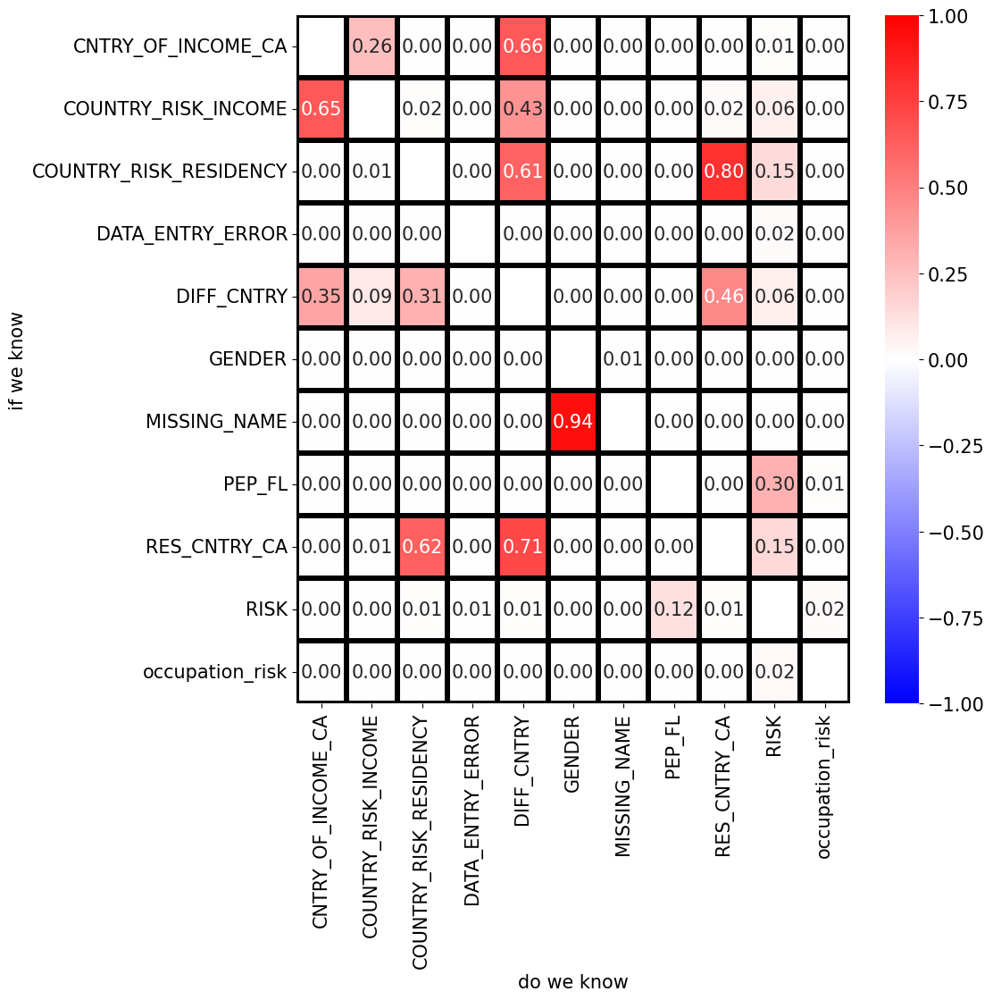

In [ ]:
uncertainty_coef = uncertainty_coef.pivot(index = 'if we know', columns = 'do we know', values = 'theil_U')
plt.figure(figsize=(10,10))
sns.heatmap(
    uncertainty_coef, 
    annot=True, 
    vmin=-1, vmax=1, 
    # mask = np.triu(corr_mat),  # asymmetrical dependence
    cmap = 'bwr',
    linewidths=4, 
    linecolor='black',
    fmt = '.2f') 
plt.show()

In [ ]:
pd.crosstab(X_train.MISSING_NAME, X_train.GENDER)

GENDER,Female,Male
MISSING_NAME,,
0,438943,360383
1,15,9


In [ ]:
pd.crosstab(X_train.COUNTRY_RISK_RESIDENCY, X_train.RES_CNTRY_CA)

RES_CNTRY_CA,0,1
COUNTRY_RISK_RESIDENCY,,
Low,3524,788437
Moderate,545,0
High,7370,0


### Correlation with target variable
- kde density plot with hue = target (stacked = True / False)
- hexagon plot of 2 numerical with hue = target
- numerical
  - cut into bins -> cross tab with y
- categorical 
  - cross tab with y

#### Without transformation

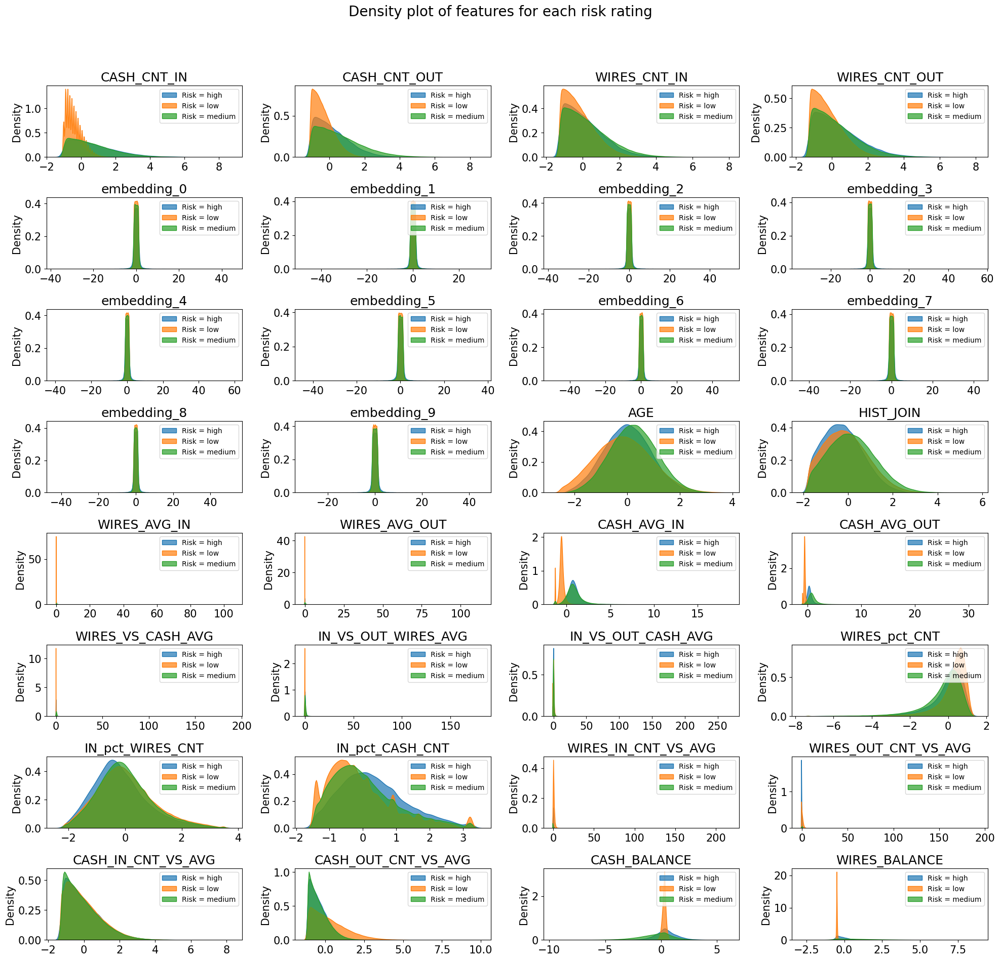

In [ ]:
# Univariate density plot by RISK rating
fig, axes = plt.subplots(8,int((X_train.select_dtypes(np.number).shape[1] - 2) // 8) + 1,figsize=(20,20))

norm_clean = pd.concat([
    X_train.select_dtypes(np.number).apply(lambda x: (x - x.mean()) / x.std()),
    y_train], axis = 1)

for ax, col in zip(axes.flatten(), X_train.select_dtypes(np.number).columns):
  for risk in sorted(y_train.unique()):
    try:
      sns.kdeplot(norm_clean.loc[norm_clean['RISK'] == risk, col], fill=True, label=f"Risk = {risk}", alpha=.7, ax=ax, warn_singular=False, 
                  gridsize=200, legend = True)
    except LinAlgError:
      print(f"only 1 unique value of {norm_clean.loc[norm_clean['cluster'] == risk, col].unique()[0]:0.3f} for {col} in risk {risk}")
  ax.set_title(col)
  ax.legend(loc = 'upper right', prop={'size': 10})
  ax.set_xlabel('')

fig.suptitle('Density plot of features for each risk rating', fontsize=20)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### Normal distribution

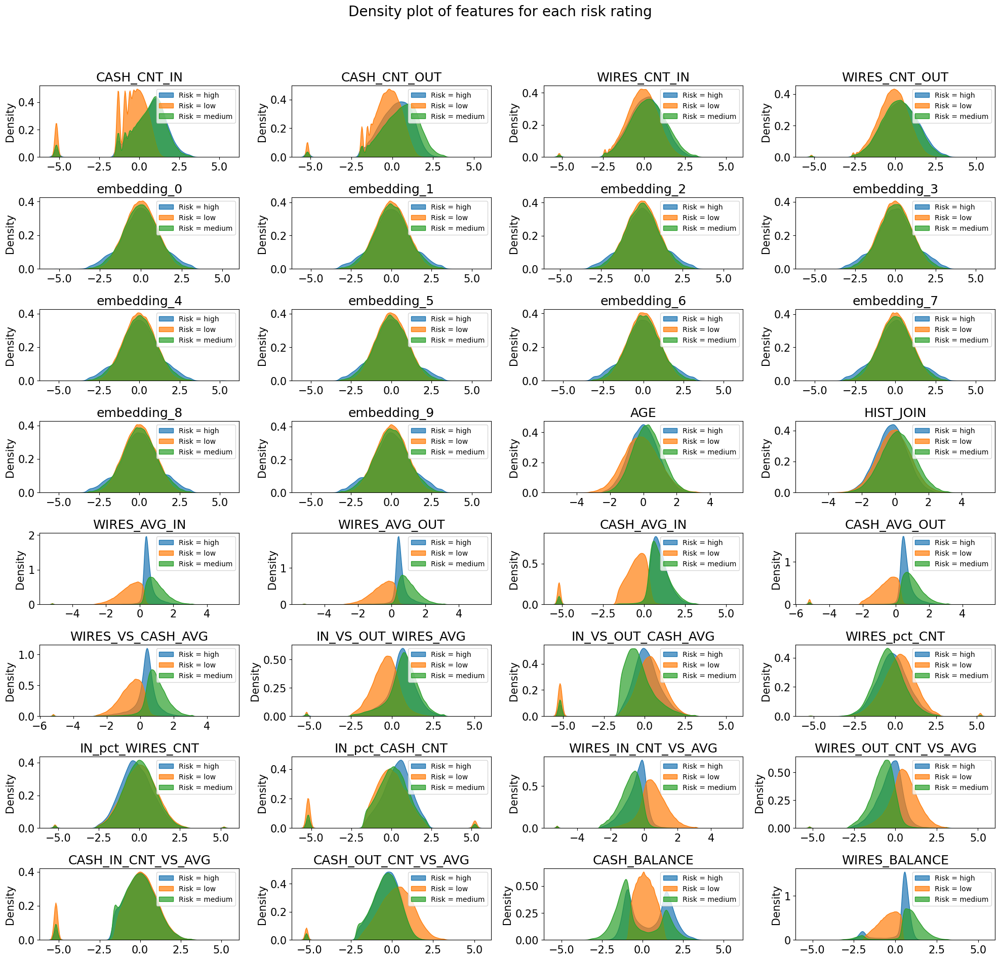

In [ ]:
# Univariate density plot by RISK rating
fig, axes = plt.subplots(8,int((X_train.select_dtypes(np.number).shape[1] - 2) // 8) + 1,figsize=(20,20))

abcd = MyQuantileTransformer(output_distribution='normal', random_state=42).fit(X_train.select_dtypes(np.number))

norm_clean = pd.concat([
    pd.DataFrame(abcd.transform(X_train.select_dtypes(np.number)),
                 columns = abcd.get_feature_names_out()),
    y_train], axis = 1)

for ax, col in zip(axes.flatten(), X_train.select_dtypes(np.number).columns):
  for risk in sorted(y_train.unique()):
    try:
      sns.kdeplot(norm_clean.loc[norm_clean['RISK'] == risk, col], fill=True, label=f"Risk = {risk}", alpha=.7, ax=ax, warn_singular=False, 
                  gridsize=200, legend = True)
    except LinAlgError:
      print(f"only 1 unique value of {norm_clean.loc[norm_clean['cluster'] == risk, col].unique()[0]:0.3f} for {col} in risk {risk}")
  ax.set_title(col)
  ax.legend(loc = 'upper right', prop={'size': 10})
  ax.set_xlabel('')

fig.suptitle('Density plot of features for each risk rating', fontsize=20)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### Uniform distribution

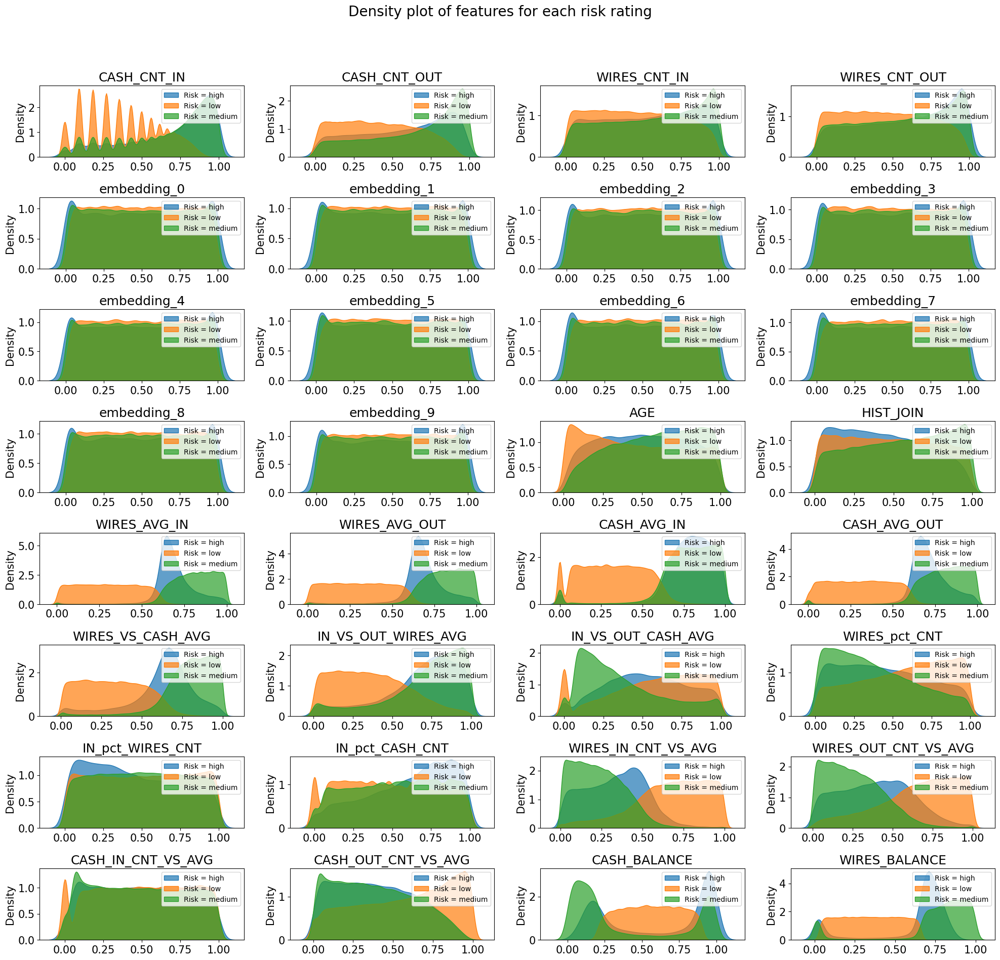

In [ ]:
# Univariate density plot by RISK rating
fig, axes = plt.subplots(8,int((X_train.select_dtypes(np.number).shape[1] - 2) // 8) + 1,figsize=(20,20))

abcd = MyQuantileTransformer(output_distribution='uniform', random_state=42).fit(X_train.select_dtypes(np.number))

norm_clean = pd.concat([
    pd.DataFrame(abcd.transform(X_train.select_dtypes(np.number)),
                 columns = abcd.get_feature_names_out()),
    y_train], axis = 1)

for ax, col in zip(axes.flatten(), X_train.select_dtypes(np.number).columns):
  for risk in sorted(y_train.unique()):
    try:
      sns.kdeplot(norm_clean.loc[norm_clean['RISK'] == risk, col], fill=True, label=f"Risk = {risk}", alpha=.7, ax=ax, warn_singular=False, 
                  gridsize=200, legend = True)
    except LinAlgError:
      print(f"only 1 unique value of {norm_clean.loc[norm_clean['cluster'] == risk, col].unique()[0]:0.3f} for {col} in risk {risk}")
  ax.set_title(col)
  ax.legend(loc = 'upper right', prop={'size': 10})
  ax.set_xlabel('')

fig.suptitle('Density plot of features for each risk rating', fontsize=20)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### pairplot

In [ ]:
# randomly select 10**4 samples for faster plotting with probability of being chosen based on 1 / class % split
class_weighted_sample = pd.concat([
    X_train.select_dtypes(np.number),
    y_train], 
    axis = 1).sample(10**2, weights = 1/(y_train.to_frame().groupby('RISK').RISK.transform('size') / y_train.shape[0]))

sns.pairplot(class_weighted_sample,
             # specify off-diagonal cells to be scatter
             kind='scatter',
             hue = 'RISK',
             # specify diagonal to be histogram, or "kde"
             diag_kind='kde',
             plot_kws={'alpha': 0.2},
             corner=True)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# randomly select samples for faster plotting with probability based on class % split
class_weighted_sample_Q = pd.concat([
  pd.DataFrame(
    QuantileTransformer(output_distribution='normal').fit_transform(class_weighted_sample.drop(columns=['RISK'])),
    columns = class_weighted_sample.drop(columns=['RISK']).columns),
  class_weighted_sample.RISK.reset_index(drop=True)
], axis = 1)

sns.pairplot(class_weighted_sample_Q,
             # specify off-diagonal cells to be scatter
             kind='scatter',
             hue = 'RISK',
             # specify diagonal to be histogram, or "kde"
             diag_kind='kde',
             plot_kws={'alpha': 0.2},
             corner=True)

Output hidden; open in https://colab.research.google.com to view.

#### categorical

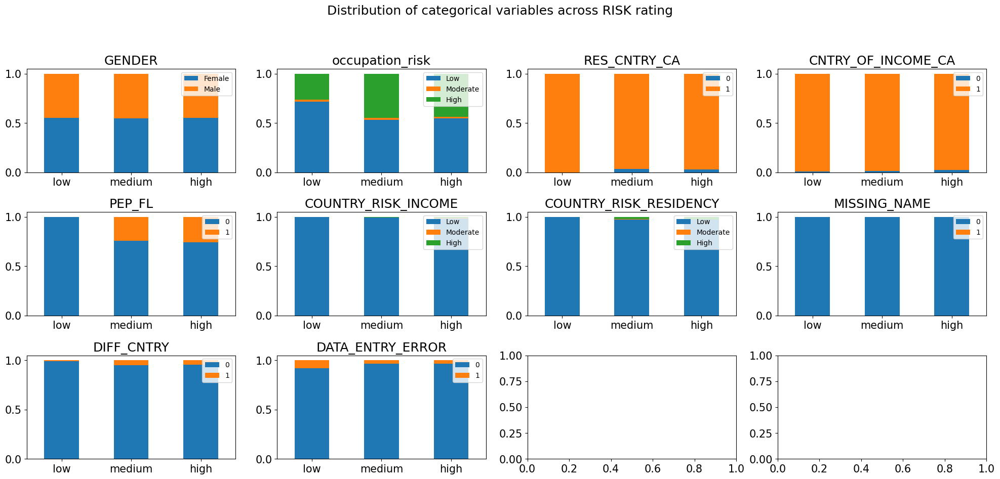

In [ ]:
# plot categorical variables
fig, axes = plt.subplots(3,4, figsize = (20,10))
for col, ax in zip(X_train.select_dtypes(include = ['category']), axes.flatten()):
  pd.crosstab(y_train, X_train[col], normalize = 'index').plot(kind = 'bar', stacked = True, title = col, legend=False, ax = ax)
  ax.set_xlabel('')
  ax.set_xticklabels(['low', 'medium', 'high'], rotation = 0)
  ax.legend(loc = 'upper right', prop={'size': 10})
plt.subplots_adjust(hspace=1, wspace=0.3)
plt.suptitle(f'Distribution of categorical variables across RISK rating')
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Data preparation

## Missing values
- how are they represented, where do they occur, and 
  - occupation_riks and HIST_JOIN seems to appear at random
  - GENDER is missing when NAME is missing too
- how common are they?
  - not very common c.1%
- msno matrix
  - minimum complete columns = 35 columns
  - maximum = 37 columns
- missingness vs observed values
- missingness in GENDER, occupation risk
  - When opening an account, the client refuses or tries to avoid providing information required by the financial institution

In [ ]:
# count of missingness
X_train.isna().sum().sort_values(ascending=False).to_frame().T

,occupation_risk,HIST_JOIN,GENDER,IN_VS_OUT_WIRES_AVG,AGE,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,DATA_ENTRY_ERROR,WIRES_VS_CASH_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,DIFF_CNTRY,MISSING_NAME,embedding_9,embedding_8,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,WIRES_BALANCE
0,5112,3274,526,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### missingness vs RISK

<AxesSubplot:ylabel='RISK'>

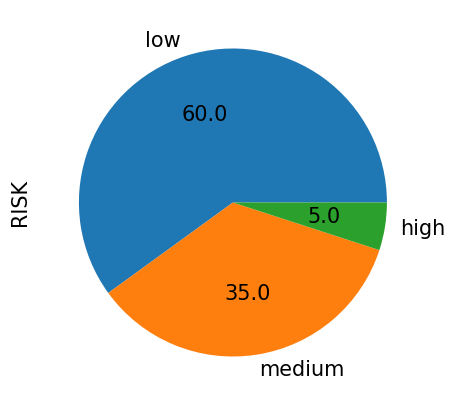

In [ ]:
# normal class %
y_train.value_counts(normalize=True).sort_index().plot(kind = 'pie', autopct='%.1f')

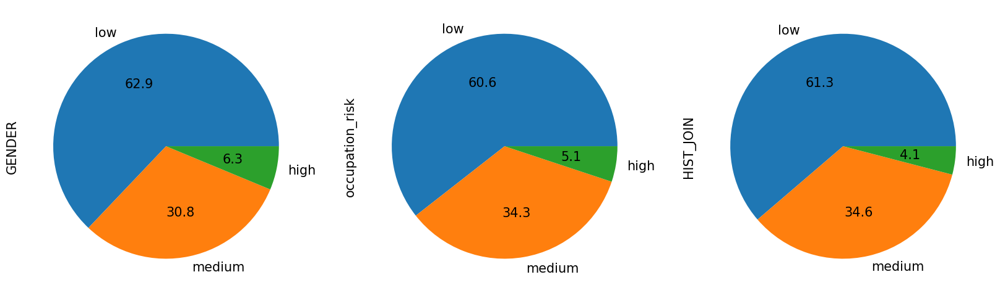

In [ ]:
# similar class % for rows with missing records
fig, axes = plt.subplots(1,sum(X_train.isna().sum() != 0), figsize = (20,10))
for i, na_col in enumerate(X_train.columns[X_train.isna().sum() != 0]):
  y_train[X_train[na_col].isna()].value_counts(normalize=True).sort_index().plot(kind = 'pie', autopct='%.1f', ylabel = na_col, ax = axes.flatten()[i])

plt.show()

### missingness vs Numerical

In [ ]:
# check the boxplots of those rows with NA and without NA in na_col to see if any pattern in X
def na_check(df, na_col):
  fig, axes = plt.subplots(1,2, sharex = True, sharey = False, figsize = (20,10))

  output = df.select_dtypes(np.number).apply(lambda x: (x - x.mean()) / x.std())
  
  output[df[na_col].isna()].plot(kind='box', vert=False, showfliers=False, ax = axes[0])
  output[~df[na_col].isna()].plot(kind='box', vert=False, showfliers=False, ax = axes[1])
  
  plt.suptitle(f'Distribution of records with')
  axes[0].set_title(f'NA in {na_col}')
  axes[0].axvline(2, ls = '--')
  axes[0].axvline(-2, ls = '--')
  axes[0].set_xlim(-2.5, 2.5)
  axes[1].set_title(f'non-NA in {na_col}')
  axes[1].axvline(2, ls = '--')
  axes[1].axvline(-2, ls = '--')
  axes[1].set_xlim(-2.5, 2.5)
  plt.subplots_adjust(hspace = 0.4, wspace=0.6)
  plt.show()

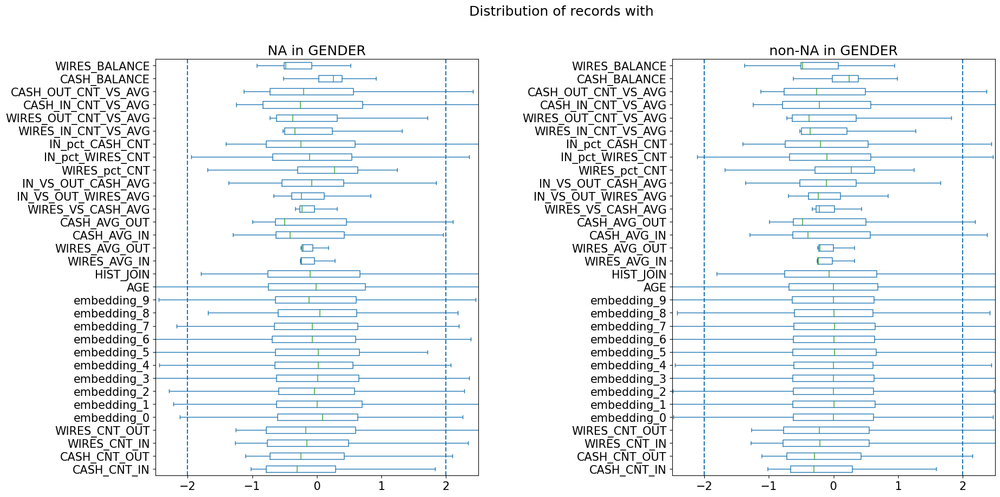

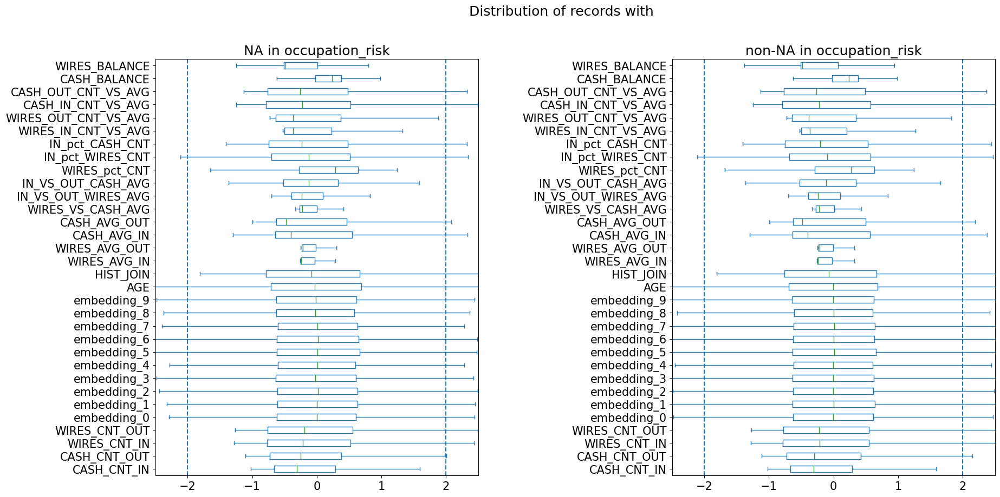

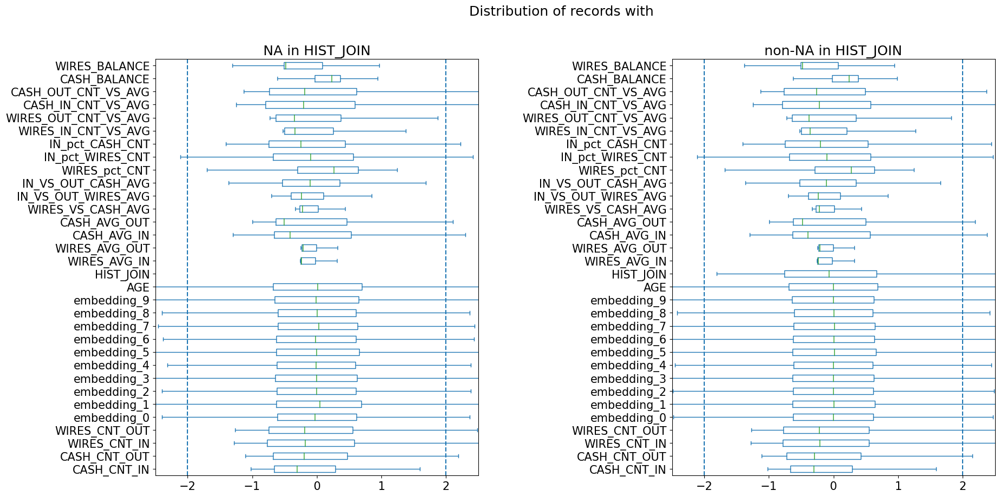

In [ ]:
for na_col in X_train.columns[X_train.isna().sum() != 0]:
  na_check(X_train, na_col)

### missingness vs Categorical

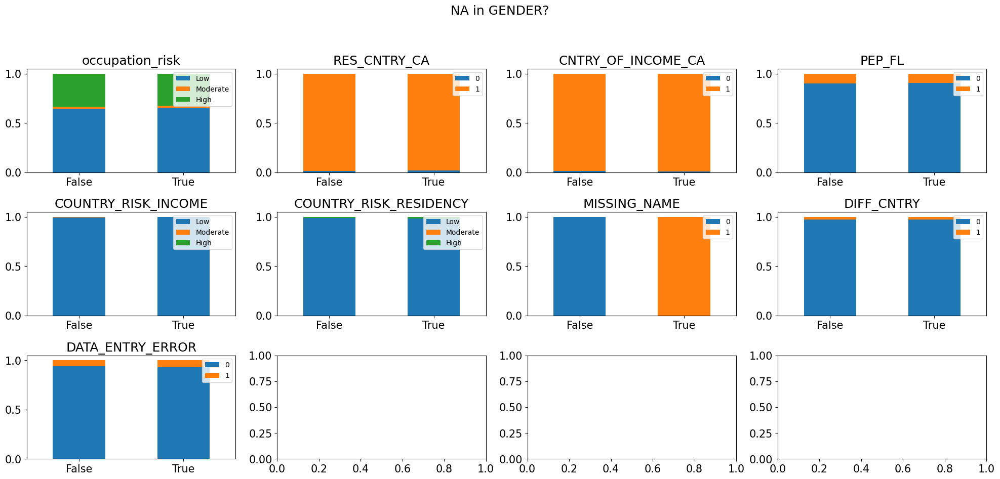

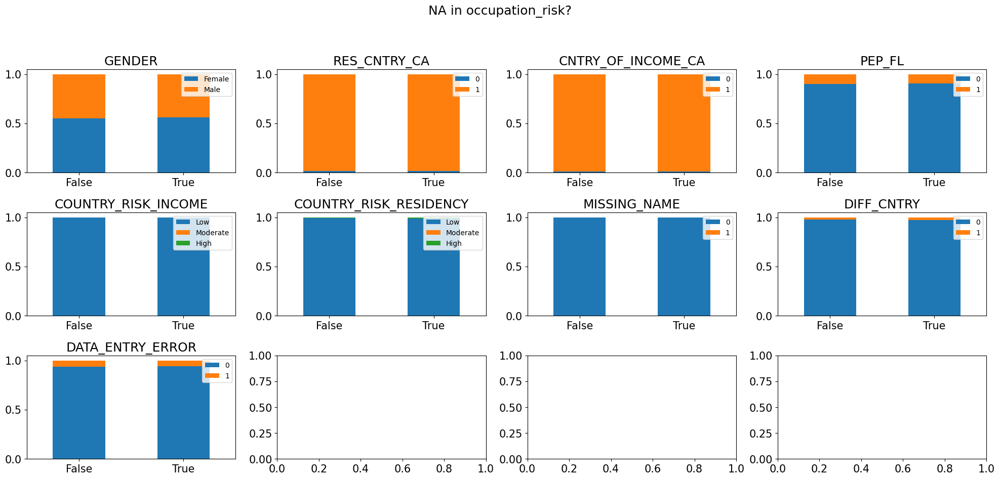

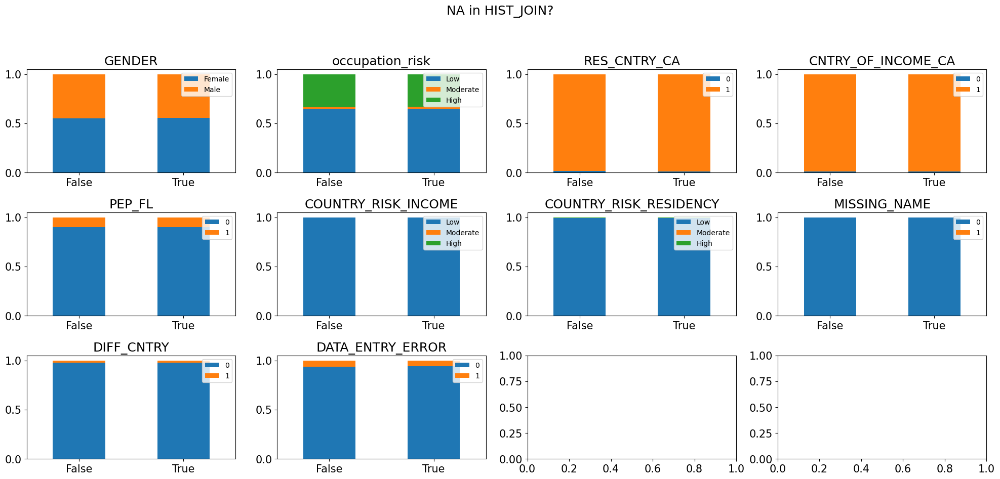

In [ ]:
# relationship in missing GENDER and missing name
for na_col in X_train.columns[X_train.isna().sum() != 0]:
  fig, axes = plt.subplots(3,4, figsize = (20,10))
  for col, ax in zip(X_train.drop(columns=[na_col]).select_dtypes(include = ['category']), axes.flatten()):
    pd.crosstab(X_train[na_col].isna(), X_train[col], normalize = 'index').plot(kind = 'bar', stacked = True, title = col, legend=True, ax = ax)
    ax.set_xlabel('')
    ax.set_xticklabels(['False', 'True'], rotation = 0)
    ax.legend(loc = 'upper right', prop={'size': 10})
  plt.subplots_adjust(hspace=1, wspace=0.3)
  plt.suptitle(f'NA in {na_col}?')
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

In [ ]:
# if GENDER is missing, then MISSING_NAME must be 1
X_train[X_train.GENDER.isna()].MISSING_NAME.value_counts()

1    526
0      0
Name: MISSING_NAME, dtype: int64

### correlation among missingness

<AxesSubplot:>

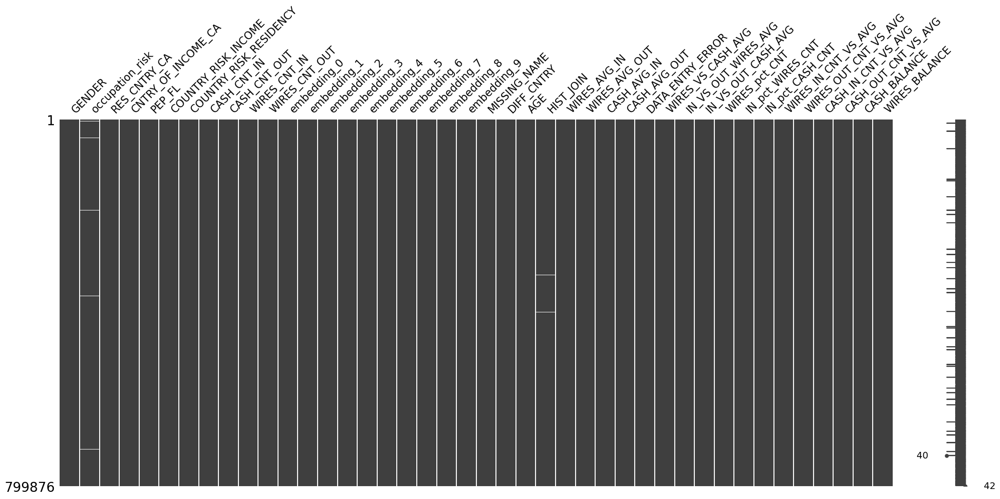

In [ ]:
msno.matrix(X_train)

<AxesSubplot:>

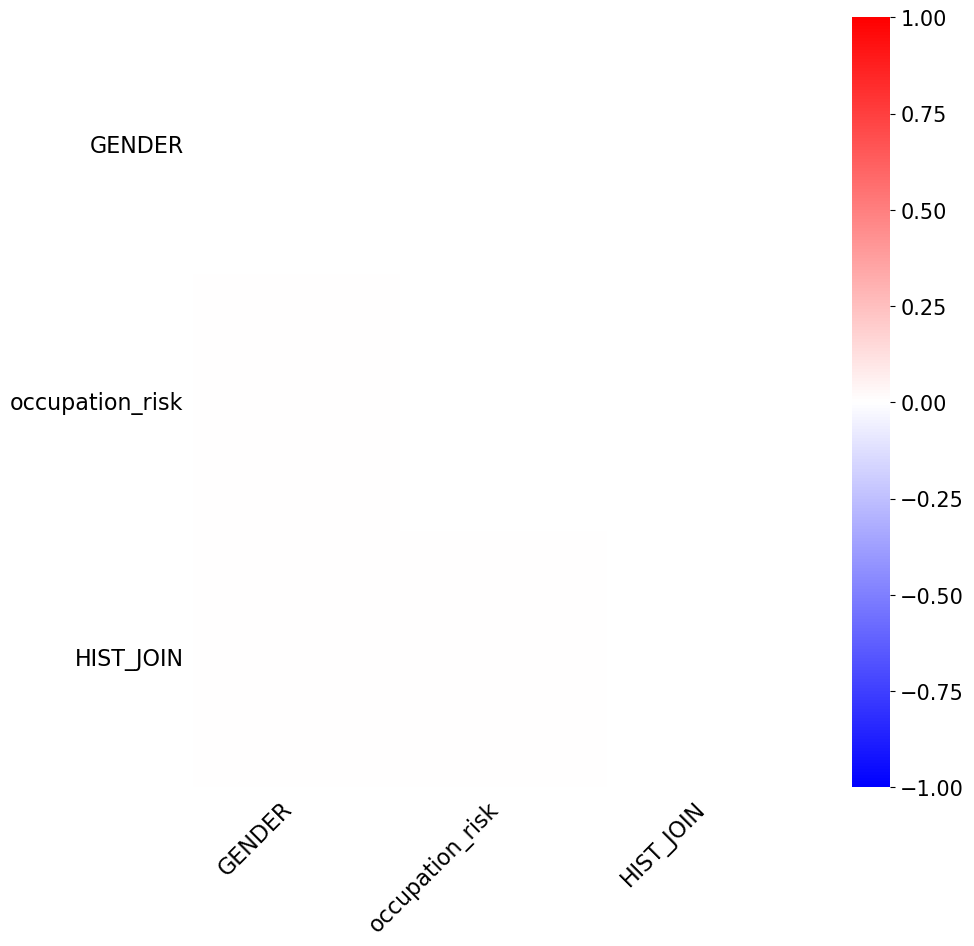

In [ ]:
# Nullity correlation ranges from -1 (if one variable appears the other definitely does not) to 
# 0 (variables appearing or not appearing have no effect on one another) to 
# 1 (if one variable appears the other definitely also does).
msno.heatmap(X_train, figsize = (10,10), cmap='bwr')

### RandomImputer or MySimpleImputer
- impute occupation_risk and HIST_JOIN at random to maintain the spread of distribution
- impute GENDER with random values when MISSING_NAME == 1

In [ ]:
X_train.isna().sum().sum()

8912

In [ ]:
X_clean = RandomImputer().fit_transform(X_train)

In [ ]:
X_clean.isna().sum().sum()

0

## data_preparation pipeline for X
- numerical
  - Non-linear transformation to normal distribution
- categorical
  - unordered
    - OneHotEncoder:
      - no need to collapse infrequent categories -> infrequent class could represent minority class in target variable
  - ordered
    - ThermometerEncoder
    - [(2012) Evaluating the Impact of Categorical Data Encoding and Scaling on Neural Network Classification Performance: The Case of Repeat Consumption of Identical Cultural Goods (Elena Fitkov-Norris, Samireh Vahid, and Chris Hand from Kingston University London)](https://www.researchgate.net/publication/262173733_Evaluating_the_Impact_of_Categorical_Data_Encoding_and_Scaling_on_Neural_Network_Classification_Performance_The_Case_of_Repeat_Consumption_of_Identical_Cultural_Goods)
  - MinMaxScaler to rescale to -2 to +2 (95% confidence interval of normal distribution)
  - alternative: bin counting (prone to data leakage)

In [ ]:
num_pipeline = make_pipeline(
    # Impute missing values
    RandomImputer(),
    # MySimpleImputer(strategy='mean'),
    # transformation
    MyQuantileTransformer(output_distribution = 'normal', random_state=42)
)

cat_pipeline = make_pipeline(
    # Impute missing values instead of treating as additional category (only a small portion is missing)
    RandomImputer(),
    # MySimpleImputer(strategy='most_frequent'),
    # transform with dummy variables
    MyOneHotEncoder(drop = 'if_binary', sparse = False),
    # scale to -2 and +2 to match 95% CI
    MyMinMaxScaler(feature_range=(-2, 2))
)

ordinal_pipeline = make_pipeline(
    # Impute missing values instead of treating as additional category (only a small portion is missing)
    RandomImputer(),
    # MySimpleImputer(strategy='most_frequent'),
    # transform with thermometer scaling
    ThermometerEncoder(),
    # scale to -2 and +2 to match 95% CI
    MyMinMaxScaler(feature_range=(-2, 2))
)

data_preparation = make_pipeline(
    # data transformation
    ColumnTransformer([
        ("num", num_pipeline, make_column_selector(dtype_include=np.number)),
        ("cat", cat_pipeline, ['GENDER', 'RES_CNTRY_CA', 'CNTRY_OF_INCOME_CA', 'PEP_FL', 'MISSING_NAME', 'DIFF_CNTRY', 'DATA_ENTRY_ERROR']),
        ("ord", ordinal_pipeline, ['occupation_risk', 'COUNTRY_RISK_INCOME', 'COUNTRY_RISK_RESIDENCY']),
      ], 
      # drop remaining columns if any
      remainder="drop",
      # drop column prefix
      verbose_feature_names_out = False, 
    )
)

### X_train -> X_prep

In [ ]:
X_train.select_dtypes('category').columns

Index(['GENDER', 'occupation_risk', 'RES_CNTRY_CA', 'CNTRY_OF_INCOME_CA',
       'PEP_FL', 'COUNTRY_RISK_INCOME', 'COUNTRY_RISK_RESIDENCY',
       'MISSING_NAME', 'DIFF_CNTRY', 'DATA_ENTRY_ERROR'],
      dtype='object')

In [ ]:
X_prep = pd.DataFrame(data_preparation.fit_transform(X_train), columns = data_preparation.get_feature_names_out())
X_prep

,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE,GENDER_Male,RES_CNTRY_CA_1,CNTRY_OF_INCOME_CA_1,PEP_FL_1,MISSING_NAME_1,DIFF_CNTRY_1,DATA_ENTRY_ERROR_1,occupation_risk_Moderate,occupation_risk_High,COUNTRY_RISK_INCOME_Moderate,COUNTRY_RISK_INCOME_High,COUNTRY_RISK_RESIDENCY_Moderate,COUNTRY_RISK_RESIDENCY_High
0,-0.0063,0.0289,0.5880,0.6165,0.5658,0.2459,-0.0174,0.0715,-0.3541,0.4140,-0.3676,-1.3160,0.1784,-1.3212,1.6184,-1.2686,-0.1646,0.1368,-0.3153,1.0676,-0.0703,-0.5943,0.3277,0.2348,-0.5735,0.6264,1.5624,-0.7674,-0.6155,-0.7714,-0.0578,1.7170,0.1350,-0.5425,-1.1532,-0.9560,-1.0501,-1.5568,0.1383,-0.1806,0.3652,-0.5442,-1.3060,0.9113,0.1539,0.1568,0.1322,-0.0726,-0.1309,0.4555,0.2977,0.5071,0.4367,1.9296,0.5086,1.1525,-0.9292,0.0834,0.3151,0.7672,0.2260,0.9775,0.1309,0.2018,-0.6888,-0.6110,0.1992,0.6896,0.9435,1.8219,-1.1448,1.2972,0.2860,-1.8105,-0.9328,0.2209,-1.3527,0.5148,-0.1830,0.3103,1.3976,1.5682,1.2581,0.1541,1.3594,1.1317,-0.2588,0.8193,-1.4874,1.5620,1.2202,-1.3124,-0.5896,0.2572,-1.4928,0.2193,0.9164,0.7362,1.2320,-0.0552,0.2954,0.7228,0.3215,1.9712,-0.7885,-0.5725,-0.4050,-0.4604,-0.9396,-0.2367,-0.3418,-0.2815,-0.2657,0.7152,-0.0240,-0.0603,0.7835,0.9227,0.6039,0.4494,-0.1624,-0.2012,-2.0000,2.0000,2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000
1,1.5713,0.0289,-1.2448,-0.3203,-1.0055,1.5637,0.8045,1.6378,0.2127,-1.8098,1.5769,1.5462,-1.4520,1.6117,-1.4267,1.9178,1.8116,-1.8109,1.2181,-1.2473,1.8355,0.5738,-1.0139,1.7123,1.0813,-1.6380,-1.4880,0.7956,-2.2172,1.5710,1.2318,-0.9165,-1.5274,1.2789,1.0054,1.2198,1.1193,-2.0586,-1.1024,-1.0815,1.6710,1.4532,1.2591,-1.0087,-1.3694,-1.4851,-0.6733,-2.0087,-1.1906,-1.3472,-0.5070,1.6466,-1.5575,-1.5546,-0.7651,-0.7106,1.6739,-1.9842,-1.4868,-1.8338,-1.6465,-1.6322,-1.0083,-1.7376,1.7935,1.2487,-0.9630,-1.5391,-1.3990,-1.2565,1.1747,-0.7471,-1.6617,1.7916,1.7110,-1.3195,1.7378,-0.4686,1.2816,1.7756,-0.8592,-1.6361,-1.6671,-0.8127,-0.8904,-0.9238,1.9161,-1.0831,-1.8694,-1.5463,1.6652,2.0469,0.8596,1.4255,-2.0661,-1.4830,-1.4529,-1.3593,-1.2344,1.3364,-1.5468,-1.6501,2.0188,-1.8537,1.1635,-0.2966,2.0239,1.6912,0.9756,1.1103,1.4986,1.4236,-0.5725,-1.3346,-1.4708,1.1808,-1.9210,-1.3897,0.7466,-0.8125,1.8204,0.5556,2.0000,2.0000,2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000
2,-5.1993,0.0289,-0.9979,-1.7219,-1.1289,1.5624,1.3135,-1.0365,0.8641,0.4886,-1.

In [ ]:
X_prep.describe(percentiles = [0.025, 0.5, 0.975])

,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE,GENDER_Male,RES_CNTRY_CA_1,CNTRY_OF_INCOME_CA_1,PEP_FL_1,MISSING_NAME_1,DIFF_CNTRY_1,DATA_ENTRY_ERROR_1,occupation_risk_Moderate,occupation_risk_High,COUNTRY_RISK_INCOME_Moderate,COUNTRY_RISK_INCOME_High,COUNTRY_RISK_RESIDENCY_Moderate,COUNTRY_RISK_RESIDENCY_High
count,"799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000","799,876.0000"
mean,-0.1413,-0.0413,-0.0103,-0.0021,0.0024,0.0022,-0.0025,-0.0058,-0.0053,0.0014,0.0

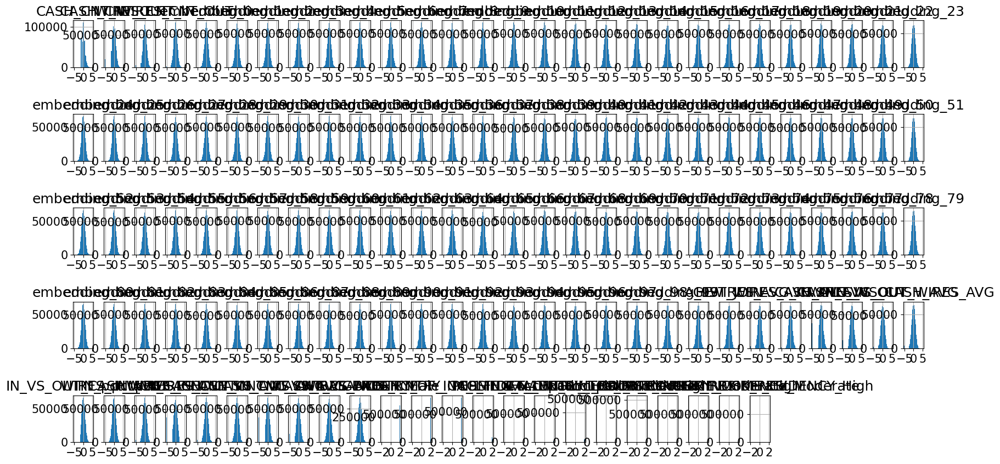

In [ ]:
X_prep.hist(bins = 50, layout = (5, int(X_prep.select_dtypes(include = np.number).shape[1] / 5) + 1), figsize= (20,10))
plt.subplots_adjust(wspace=0.5, hspace=1)
plt.show()

### y_train -> y_prep 0,1,2

In [ ]:
# multiclass
y_prep = y_train.replace({'low': 0, 'medium': 1, 'high': 2}).to_numpy() 

# Ordinal Classification

Main paper: (2015) [Ordinal Regression Methods: Survey and Experimental Study](https://ieeexplore.ieee.org/abstract/document/7161338)
- "It is important to note that naïve approaches and ordinal binary decompositions can be applied using almost any base binary classifier or regressor."
- “assessed ordered categorical variables” = variables where a user provides his/her judgement on the grade of the ordered categorical variable

Options to implement and compare:
- Baseline: Multi-class (nominal classification)
  - easy but lost information about ranking
- K-1 binary classification
  - (2001, Frank and Hall) [A simple approach to ordinal classification](https://www.cs.waikato.ac.nz/~eibe/pubs/ordinal_tech_report.pdf)
    - k-class ordinal problem is converted into k-1 binary class problem
    - [code](https://towardsdatascience.com/simple-trick-to-train-an-ordinal-regression-with-any-classifier-6911183d2a3c)
    - issue: rank inconsistency
      - e.g. output [0.9, 0.9, 0.49, 0.72, 0.1]. Iterating from left to right would result in a prediction label of 2 (since 0.49 < 0.5), even though the right answer might just as well be 4 (since 0.72 > 0.5).

- Extended binary classification
  - (2007, Li and Lin) [Ordinal Regression by Extended Binary Classification](https://papers.nips.cc/paper/2006/file/019f8b946a256d9357eadc5ace2c8678-Paper.pdf)
  - C x C cost matrix with each row = V-shaped with higher costs at the two ends
  - (2007 Cardoso, Costa) [Learning to Classify Ordinal Data: The Data Replication Method](https://www.jmlr.org/papers/volume8/cardoso07a/cardoso07a.pdf)
  
- Evaluation metrics
  - Our approach
    - (2009, Furnkranz, Eyke Hullermeier, Stijn Vanderlooy) [Binary Decomposition Methods for Multipartite Ranking](https://link.springer.com/content/pdf/10.1007/978-3-642-04180-8_41.pdf)
      - Multiclass AUC for multipartite ranking
      - AUROC ovo macro weighted
  - Others
    - (2009, Baccianella, Andrea Esuli and Fabrizio Sebastiani) [Evaluation Measures for Ordinal Regression](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=5364825)
      - average = 'macro' instead of 'micro' for class imbalance
      - MAE , i.e. the average deviation between predicted and actual targets in number of categories
      - squared loss or cross entropy loss
      - should use average precision instead?
    - (2022) [Class distance weighted cross-entropy loss](https://arxiv.org/pdf/2202.05167.pdf)

- Others
  - https://towardsdatascience.com/how-to-perform-ordinal-regression-classification-in-pytorch-361a2a095a99
  - https://towardsai.net/p/l/from-classification-to-ordinal-regression
  - from coarse-grained to fine-grained https://www.nature.com/articles/s41598-020-79007-5#Abs1
  - Thermometer scaling (aka label extension)
  - (2007, Cheng) [A Neural Network Approach to Ordinal Regression](https://arxiv.org/pdf/0704.1028.pdf)
    - loss = squared error in rank
    - issue: rank inconsistency

- CORAL framework for rank consistency
  - (2020, Cao, Mirjalili, Raschka) [Rank consistent ordinal regression for neural networks with application to age estimation](https://arxiv.org/pdf/1901.07884.pdf)
  - label extension + weight sharing at penultimate layer

## MAE and AUC scorer
- macro_avg_MAE(), multipartite_AUC()

## 5-fold custom CV iterator Stratified Shuffle Split()

In [ ]:
cv_split = StratifiedShuffleSplit(n_splits = 5, test_size = 0.2, random_state = 42)

In [ ]:
# check class balance is maintained in CV folds
# CV_train_index, CV_test_index = next(cv_split.split(X_prep, y_train))
# class_label, class_balance = np.unique(y_train, return_counts=True, axis = 0)
# print(f"Original class balance = \n{class_label}, \n{class_balance / class_balance.sum()}")
# class_label, class_balance = np.unique(y_train[CV_test_index,:], return_counts=True, axis = 0)
# print(f"CV-fold class balance = \n{class_label}, \n{class_balance / class_balance.sum()}")

## X,y_train -> X_subset, y_subset for 100k rows to test

In [ ]:
first_n = None
X_subset = X_prep[:first_n]
y_subset = y_prep[:first_n]

In [ ]:
np.unique(y_subset, return_counts=True)

(array([0, 1, 2], dtype=int64), array([479876, 280000,  40000], dtype=int64))

## Binary decomposition implementation
- ExtendedBinary() vs Frank&Hall()

### Significant improvement for linear models

### testing (11min for all 700k rows)
- LightGBM with n_estimators = 50
- Alternative
  - SGDClassifier with loss = 'log_loss'

In [ ]:
def test_performance(estimator, y_target, custom_scorer, sample_weight = None):
  print(f"Score for Classes: {np.unique(y_target)}")
  start = time.time()
  # if sample_weight == 'balanced':
  #   sample_weight = 1/pd.Series(y_target).replace({key: value for key, value in zip(*np.unique(y_target, return_counts = True))}).to_numpy()
  estimator.fit(X_subset, y_target, sample_weight = sample_weight)
  output = {'model': estimator, 'scores': cross_val_score(estimator, X_subset, y_target, scoring = custom_scorer, cv=cv_split)}
  end = time.time()
  print(f"Time taken = {end - start:0.1f} seconds")
  return output

In [ ]:
test_params = {
    'baseline': (
        SGDClassifier(loss='log', penalty='elasticnet'),
        y_subset,
        multipartite_AUC_scorer,
        None),
    'multinomial\nclass_balanced': (
        SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    'ExtendedBinary_OrderedPartitions': (
        ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OrderedPartitions'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'ExtendedBinary_OrderedPartitions\nsample_balanced': (
    #     ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OrderedPartitions'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    'ExtendedBinary_OrderedPartitions\nclass_balanced': (
        ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'), decomposition_method='OrderedPartitions'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'ExtendedBinary_OneVsNext': (
    #     ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OneVsNext'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     None),
    # 'ExtendedBinary_OneVsNext\nsample_balanced': (
    #     ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OneVsNext'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    # 'ExtendedBinary_OneVsNext\nclass_balanced': (
    #     ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'), decomposition_method='OneVsNext'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     None),
    'ExtendedBinary_OneVsFollowers': (
        ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OneVsFollowers'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'ExtendedBinary_OneVsFollowers\nsample_balanced': (
    #     ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OneVsFollowers'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    'ExtendedBinary_OneVsFollowers\nclass_balanced': (
        ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'), decomposition_method='OneVsFollowers'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    'ExtendedBinary_OneVsPrevious': (
        ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OneVsPrevious'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'ExtendedBinary_OneVsPrevious\nsample_balanced': (
    #     ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet'), decomposition_method='OneVsPrevious'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    'ExtendedBinary_OneVsPrevious\nclass_balanced': (
        ExtendedBinary(SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'), decomposition_method='OneVsPrevious'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    'Frank&Hall_OrderedPartitions': (
        FnHClassifier(
            SGDClassifier(loss='log', penalty='elasticnet'),
            SGDClassifier(loss='log', penalty='elasticnet'),
            decomposition_method='OrderedPartitions'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'Frank&Hall_OrderedPartitions_sample_balanced': (
    #     FnHClassifier(
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         decomposition_method='OrderedPartitions'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    'Frank&Hall_OrderedPartitions_class_balanced': (
        FnHClassifier(
            SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
            SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
            decomposition_method='OrderedPartitions'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'Frank&Hall_OneVsNext': (
    #     FnHClassifier(
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         decomposition_method='OneVsNext'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     None),
    # 'Frank&Hall_OneVsNext_sample_balanced': (
    #     FnHClassifier(
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         decomposition_method='OneVsNext'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    # 'Frank&Hall_OneVsNext_class_balanced': (
    #     FnHClassifier(
    #         SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
    #         SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
    #         decomposition_method='OneVsNext'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     None),
    'Frank&Hall_OneVsFollowers': (
        FnHClassifier(
            SGDClassifier(loss='log', penalty='elasticnet'),
            SGDClassifier(loss='log', penalty='elasticnet'),
            decomposition_method='OneVsFollowers'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'Frank&Hall_OneVsFollowers_sample_balanced': (
    #     FnHClassifier(
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         decomposition_method='OneVsFollowers'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    'Frank&Hall_OneVsFollowers_class_balanced': (
        FnHClassifier(
            SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
            SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
            decomposition_method='OneVsFollowers'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    'Frank&Hall_OneVsPrevious': (
        FnHClassifier(
            SGDClassifier(loss='log', penalty='elasticnet'),
            SGDClassifier(loss='log', penalty='elasticnet'),
            decomposition_method='OneVsPrevious'), 
        y_subset,
        multipartite_AUC_scorer,
        None),
    # 'Frank&Hall_OneVsPrevious_sample_balanced': (
    #     FnHClassifier(
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         SGDClassifier(loss='log', penalty='elasticnet'),
    #         decomposition_method='OneVsPrevious'), 
    #     y_subset,
    #     multipartite_AUC_scorer,
    #     'balanced',),
    'Frank&Hall_OneVsPrevious_class_balanced': (
        FnHClassifier(
            SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
            SGDClassifier(loss='log', penalty='elasticnet',class_weight='balanced'),
            decomposition_method='OneVsPrevious'), 
        y_subset,
        multipartite_AUC_scorer,
        None)
}

test_result = {}

for key, value in tqdm(test_params.items()):
  print(key)
  test_result[key] = test_performance(*value)

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

baseline
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 1.95
0.78, 1.53
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.95
0.77, 1.51
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.76']
1.00, 2.00
1.00, 1.95
0.78, 1.53
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.94
0.78, 1.54
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.96
0.78, 1.52
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.95
0.78, 1.52
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.96
0.79, 1.55
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.78']
1.00, 2.00
1.00, 1.96
0.78, 1.52
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.95
0.79, 1.55
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.78']


  7%|█████▉                                                                             | 1/14 [01:25<18:35, 85.81s/it]

1.00, 2.00
1.00, 1.96
0.78, 1.53
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.77']
Time taken = 85.8 seconds
multinomial
class_balanced
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 1.98
0.78, 1.54
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.98
0.79, 1.55
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.78']
1.00, 2.00
1.00, 1.98
0.79, 1.55
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.78']
1.00, 2.00
1.00, 1.98
0.78, 1.54
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.98
0.79, 1.54
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.78']
1.00, 2.00
1.00, 1.98
0.80, 1.58
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.79']
1.00, 2.00
1.00, 1.96
0.78, 1.53
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.96
0.78, 1.53
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.77']
1.00, 2.00
1.00, 1.9

 14%|███████████▊                                                                       | 2/14 [03:14<19:48, 99.03s/it]

1.00, 2.00
1.00, 1.98
0.79, 1.56
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.78']
Time taken = 108.3 seconds
ExtendedBinary_OrderedPartitions
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 2.00
0.52, 0.82
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 2.00
1.00, 2.00
0.50, 0.82
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.50, 0.77
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.42']
1.00, 2.00
1.00, 2.00
0.51, 0.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.50, 0.78
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
1.00, 2.00
1.00, 2.00
0.49, 0.82
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.50, 0.80
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
1.00, 2.00
1.00, 2.00
0.50, 0.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.

 21%|█████████████████▊                                                                 | 3/14 [04:28<16:07, 87.98s/it]

1.00, 2.00
1.00, 2.00
0.53, 0.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
Time taken = 74.8 seconds
ExtendedBinary_OrderedPartitions
class_balanced
Score for Classes: [0 1 2]
1.00, 1.97
1.00, 2.00
0.48, 0.91
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.46']
1.00, 1.92
1.00, 2.00
0.47, 0.93
['Classes 0, 1: 0.97', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.47']
1.00, 1.96
1.00, 2.00
0.46, 0.88
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.94
1.00, 2.00
0.48, 0.93
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.47']
1.00, 1.89
1.00, 2.00
0.45, 0.88
['Classes 0, 1: 0.96', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 1.94
1.00, 2.00
0.48, 0.92
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.46']
1.00, 1.96
1.00, 2.00
0.46, 0.87
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 1.97
1.00, 2.00
0.48, 0.90
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.46']

 29%|███████████████████████▋                                                           | 4/14 [05:53<14:26, 86.64s/it]

1.00, 1.92
1.00, 2.00
0.45, 0.87
['Classes 0, 1: 0.97', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
Time taken = 84.6 seconds
ExtendedBinary_OneVsFollowers
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 2.00
0.49, 0.78
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.42']
1.00, 2.00
1.00, 2.00
0.50, 0.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.52, 0.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 2.00
1.00, 2.00
0.51, 0.84
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 2.00
1.00, 2.00
0.52, 0.80
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.49, 0.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
1.00, 2.00
1.00, 2.00
0.52, 0.79
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.49, 0.82
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 

 36%|█████████████████████████████▋                                                     | 5/14 [06:50<11:23, 75.90s/it]

1.00, 2.00
1.00, 2.00
0.50, 0.80
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
Time taken = 56.8 seconds
ExtendedBinary_OneVsFollowers
class_balanced
Score for Classes: [0 1 2]
1.00, 1.97
1.00, 2.00
0.46, 0.87
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 1.99
1.00, 2.00
0.47, 0.88
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.99
1.00, 2.00
0.47, 0.83
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
1.00, 1.99
1.00, 2.00
0.47, 0.85
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 1.99
1.00, 2.00
0.48, 0.87
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.98
1.00, 2.00
0.49, 0.89
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.46']
1.00, 1.99
1.00, 2.00
0.49, 0.87
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.98
1.00, 2.00
0.48, 0.87
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.

 43%|███████████████████████████████████▌                                               | 6/14 [07:53<09:31, 71.47s/it]

1.00, 1.99
1.00, 2.00
0.47, 0.83
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
Time taken = 62.8 seconds
ExtendedBinary_OneVsPrevious
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 2.00
0.51, 0.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.51, 0.77
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
1.00, 2.00
1.00, 2.00
0.50, 0.77
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.42']
1.00, 2.00
1.00, 2.00
0.51, 0.79
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
1.00, 2.00
1.00, 1.99
0.54, 0.78
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.53, 0.78
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2.00
0.53, 0.77
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.43']
1.00, 2.00
1.00, 2.00
0.51, 0.82
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 2.00
1.00, 2

 50%|█████████████████████████████████████████▌                                         | 7/14 [09:09<08:30, 72.93s/it]

1.00, 2.00
1.00, 2.00
0.53, 0.78
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
Time taken = 75.9 seconds
ExtendedBinary_OneVsPrevious
class_balanced
Score for Classes: [0 1 2]
1.00, 1.95
1.00, 2.00
0.47, 0.89
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.96
1.00, 2.00
0.46, 0.89
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.94
1.00, 2.00
0.47, 0.89
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.93
1.00, 2.00
0.47, 0.90
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.46']
1.00, 1.93
1.00, 2.00
0.46, 0.90
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.93
1.00, 2.00
0.46, 0.89
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
1.00, 1.96
1.00, 2.00
0.46, 0.86
['Classes 0, 1: 0.99', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.44']
1.00, 1.92
1.00, 2.00
0.47, 0.91
['Classes 0, 1: 0.97', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.46']
1.0

 57%|███████████████████████████████████████████████▍                                   | 8/14 [10:37<07:47, 77.85s/it]

1.00, 1.94
1.00, 2.00
0.46, 0.89
['Classes 0, 1: 0.98', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.45']
Time taken = 88.4 seconds
Frank&Hall_OrderedPartitions
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 1.93
0.72, 1.41
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.94
0.71, 1.39
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.70']
1.00, 2.00
1.00, 1.93
0.72, 1.41
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.97', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.94
0.72, 1.41
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.93
0.72, 1.40
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.92
0.72, 1.40
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.97', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.94
0.72, 1.39
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.70']
1.00, 2.00
1.00, 1.93
0.72, 1.40
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1

 64%|█████████████████████████████████████████████████████▎                             | 9/14 [11:39<06:03, 72.75s/it]

1.00, 2.00
1.00, 1.92
0.73, 1.42
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.97', 'Classes 1, 2: 0.72']
Time taken = 61.5 seconds
Frank&Hall_OrderedPartitions_class_balanced
Score for Classes: [0 1 2]
1.00, 1.99
1.00, 1.97
0.68, 1.35
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.68']
1.00, 1.99
1.00, 1.97
0.68, 1.34
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
1.00, 2.00
1.00, 1.98
0.68, 1.33
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
1.00, 1.99
1.00, 1.97
0.69, 1.36
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.68']
1.00, 1.99
1.00, 1.96
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.66']
1.00, 1.99
1.00, 1.97
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
1.00, 1.99
1.00, 1.98
0.66, 1.29
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.65']
1.00, 1.99
1.00, 1.97
0.67, 1.31
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.66']
1.0

 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [13:39<05:49, 87.32s/it]

1.00, 1.99
1.00, 1.98
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.66']
Time taken = 119.9 seconds
Frank&Hall_OneVsFollowers
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 1.99
0.86, 1.71
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 1.99
0.86, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 1.99
0.86, 1.71
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 1.99
0.86, 1.71
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 1.99
0.86, 1.71
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 1.99
0.86, 1.71
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 1.99
0.86, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 1.99
0.86, 1.71
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.85']
1.00, 2.00
1.00, 1.9

 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [14:29<03:47, 75.98s/it]

1.00, 2.00
1.00, 1.99
0.86, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
Time taken = 50.3 seconds
Frank&Hall_OneVsFollowers_class_balanced
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 2.00
0.86, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 2.00
0.87, 1.73
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 2.00
0.87, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 2.00
0.87, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 2.00
0.86, 1.71
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 2.00
0.87, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 2.00
0.87, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 2.00
1.00, 2.00
0.87, 1.72
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.86']
1.00, 

 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [15:39<02:28, 74.34s/it]

1.00, 2.00
1.00, 2.00
0.87, 1.73
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.87']
Time taken = 70.6 seconds
Frank&Hall_OneVsPrevious
Score for Classes: [0 1 2]
1.00, 2.00
1.00, 1.94
0.72, 1.41
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.92
0.73, 1.42
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.97', 'Classes 1, 2: 0.72']
1.00, 2.00
1.00, 1.92
0.73, 1.40
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.97', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.93
0.73, 1.42
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.72']
1.00, 2.00
1.00, 1.93
0.73, 1.41
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.93
0.72, 1.39
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.70']
1.00, 2.00
1.00, 1.94
0.73, 1.40
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.93
0.72, 1.40
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
1.00, 2.00
1.00, 1.94


 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [16:42<01:10, 70.76s/it]

1.00, 2.00
1.00, 1.94
0.73, 1.41
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.98', 'Classes 1, 2: 0.71']
Time taken = 62.5 seconds
Frank&Hall_OneVsPrevious_class_balanced
Score for Classes: [0 1 2]
1.00, 1.99
1.00, 1.97
0.68, 1.34
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
1.00, 1.99
1.00, 1.98
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
1.00, 1.99
1.00, 1.97
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.66']
1.00, 1.99
1.00, 1.98
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.66']
1.00, 1.99
1.00, 1.97
0.68, 1.33
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
1.00, 1.99
1.00, 1.97
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
1.00, 2.00
1.00, 1.97
0.67, 1.32
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.66']
1.00, 1.99
1.00, 1.98
0.66, 1.29
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.65']
1.00, 2

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [18:36<00:00, 79.74s/it]

1.00, 1.99
1.00, 1.97
0.68, 1.34
['Classes 0, 1: 1.00', 'Classes 0, 2: 0.99', 'Classes 1, 2: 0.67']
Time taken = 114.0 seconds


### results

In [ ]:
sorted(test_result, key = lambda x: np.median(test_result.get(x)['scores']))

['ExtendedBinary_OneVsPrevious\nclass_balanced',
 'ExtendedBinary_OneVsPrevious',
 'ExtendedBinary_OneVsFollowers',
 'ExtendedBinary_OrderedPartitions',
 'ExtendedBinary_OrderedPartitions\nclass_balanced',
 'ExtendedBinary_OneVsFollowers\nclass_balanced',
 'Frank&Hall_OneVsPrevious_class_balanced',
 'Frank&Hall_OrderedPartitions_class_balanced',
 'Frank&Hall_OrderedPartitions',
 'Frank&Hall_OneVsPrevious',
 'baseline',
 'multinomial\nclass_balanced',
 'Frank&Hall_OneVsFollowers',
 'Frank&Hall_OneVsFollowers_class_balanced']

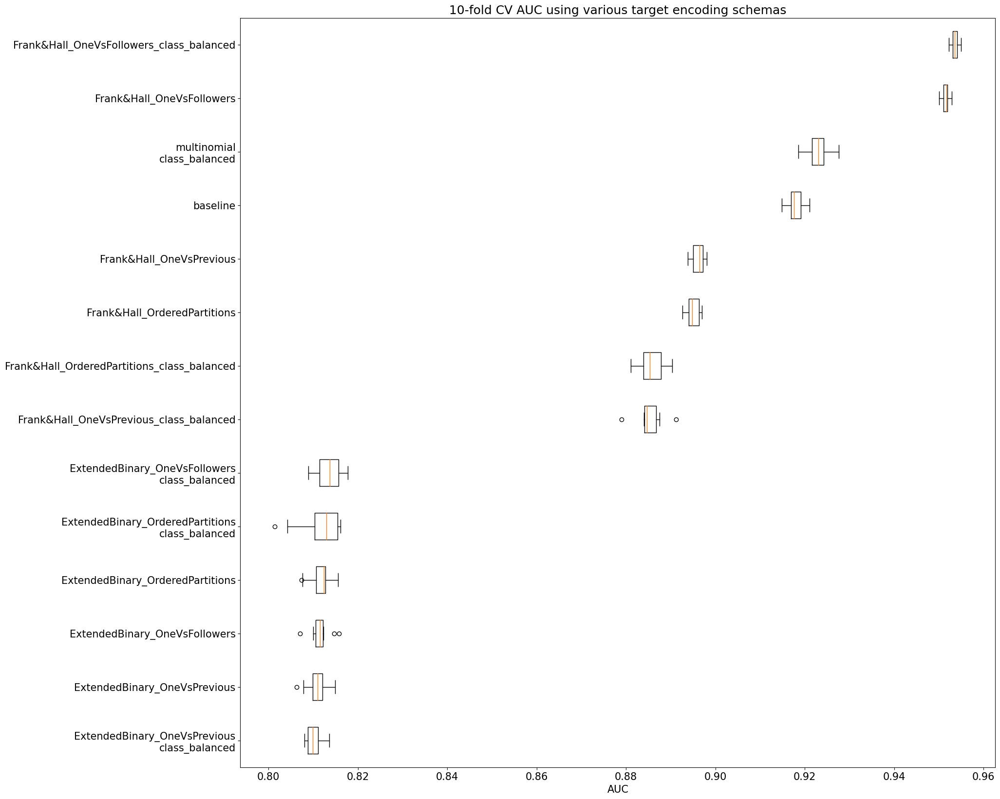

In [ ]:
sorted_labels = sorted(test_result, key = lambda x: np.median(test_result.get(x)['scores']))
cv_scores = [test_result.get(label)['scores'] for label in sorted_labels]
fig, ax = plt.subplots(1,1, figsize = (20,20))
plt.boxplot(cv_scores, vert = False)
plt.yticks(ticks = np.arange(1,len(cv_scores)+1), 
           labels=sorted_labels)
plt.xlabel('AUC')
plt.title('10-fold CV AUC using various target encoding schemas')
plt.show()

## Combine all as data_preparation()

In [ ]:
data_preparation

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('randomimputer',
                                                                   RandomImputer()),
                                                                  ('myquantiletransformer',
                                                                   MyQuantileTransformer(output_distribution='normal',
                                                                                         random_state=42))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000001E8444EB760>),
                                                 ('cat',
                                                  Pipeline(steps=[('randomimputer',
                                                                   Ra...
                                                  ['GENDER', 'RES_CNTRY_CA',
                                                   'CNTRY_OF_INCOME_CA',
                                                   'PEP_FL', 'MISSING_NAME',
                                                   'DIFF_CNTRY',
                                                   'DATA_ENTRY_ERROR']),
                                                 ('ord',
                                                  Pipeline(steps=[('randomimputer',
                                                                   RandomImputer()),
                                                                  ('thermometerencoder',
                                                                   ThermometerEncoder()),
                                                                  ('myminmaxscaler',
                                                                   MyMinMaxScaler(feature_range=(-2,
                                                                                                 2)))]),
                                                  ['occupation_risk',
                                                   'COUNTRY_RISK_INCOME',
                                                   'COUNTRY_RISK_RESIDENCY'])],
                                   verbose_feature_names_out=False))])

## runtime: 13min for all 700k rows

In [ ]:
X_subset_prep = X_prep
X_subset_prep

,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE,GENDER_Male,RES_CNTRY_CA_1,CNTRY_OF_INCOME_CA_1,PEP_FL_1,MISSING_NAME_1,DIFF_CNTRY_1,DATA_ENTRY_ERROR_1,occupation_risk_Moderate,occupation_risk_High,COUNTRY_RISK_INCOME_Moderate,COUNTRY_RISK_INCOME_High,COUNTRY_RISK_RESIDENCY_Moderate,COUNTRY_RISK_RESIDENCY_High
0,-0.0063,0.0289,0.5880,0.6165,0.5658,0.2459,-0.0174,0.0715,-0.3541,0.4140,-0.3676,-1.3160,0.1784,-1.3212,1.6184,-1.2686,-0.1646,0.1368,-0.3153,1.0676,-0.0703,-0.5943,0.3277,0.2348,-0.5735,0.6264,1.5624,-0.7674,-0.6155,-0.7714,-0.0578,1.7170,0.1350,-0.5425,-1.1532,-0.9560,-1.0501,-1.5568,0.1383,-0.1806,0.3652,-0.5442,-1.3060,0.9113,0.1539,0.1568,0.1322,-0.0726,-0.1309,0.4555,0.2977,0.5071,0.4367,1.9296,0.5086,1.1525,-0.9292,0.0834,0.3151,0.7672,0.2260,0.9775,0.1309,0.2018,-0.6888,-0.6110,0.1992,0.6896,0.9435,1.8219,-1.1448,1.2972,0.2860,-1.8105,-0.9328,0.2209,-1.3527,0.5148,-0.1830,0.3103,1.3976,1.5682,1.2581,0.1541,1.3594,1.1317,-0.2588,0.8193,-1.4874,1.5620,1.2202,-1.3124,-0.5896,0.2572,-1.4928,0.2193,0.9164,0.7362,1.2320,-0.0552,0.2954,0.7228,0.3215,1.9712,-0.7885,-0.5725,-0.4050,-0.4604,-0.9396,-0.2367,-0.3418,-0.2815,-0.2657,0.7152,-0.0240,-0.0603,0.7835,0.9227,0.6039,0.4494,-0.1624,-0.2012,-2.0000,2.0000,2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000
1,1.5713,0.0289,-1.2448,-0.3203,-1.0055,1.5637,0.8045,1.6378,0.2127,-1.8098,1.5769,1.5462,-1.4520,1.6117,-1.4267,1.9178,1.8116,-1.8109,1.2181,-1.2473,1.8355,0.5738,-1.0139,1.7123,1.0813,-1.6380,-1.4880,0.7956,-2.2172,1.5710,1.2318,-0.9165,-1.5274,1.2789,1.0054,1.2198,1.1193,-2.0586,-1.1024,-1.0815,1.6710,1.4532,1.2591,-1.0087,-1.3694,-1.4851,-0.6733,-2.0087,-1.1906,-1.3472,-0.5070,1.6466,-1.5575,-1.5546,-0.7651,-0.7106,1.6739,-1.9842,-1.4868,-1.8338,-1.6465,-1.6322,-1.0083,-1.7376,1.7935,1.2487,-0.9630,-1.5391,-1.3990,-1.2565,1.1747,-0.7471,-1.6617,1.7916,1.7110,-1.3195,1.7378,-0.4686,1.2816,1.7756,-0.8592,-1.6361,-1.6671,-0.8127,-0.8904,-0.9238,1.9161,-1.0831,-1.8694,-1.5463,1.6652,2.0469,0.8596,1.4255,-2.0661,-1.4830,-1.4529,-1.3593,-1.2344,1.3364,-1.5468,-1.6501,2.0188,-1.8537,1.1635,-0.2966,2.0239,1.6912,0.9756,1.1103,1.4986,1.4236,-0.5725,-1.3346,-1.4708,1.1808,-1.9210,-1.3897,0.7466,-0.8125,1.8204,0.5556,2.0000,2.0000,2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000
2,-5.1993,0.0289,-0.9979,-1.7219,-1.1289,1.5624,1.3135,-1.0365,0.8641,0.4886,-1.

## dump data_preparation.joblib

In [ ]:
dump(data_preparation, f'data_preparation.joblib')

['data_preparation.joblib']

## load data_preparation()

In [ ]:
data_preparation = load('data_preparation.joblib')
data_preparation

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('randomimputer',
                                                                   RandomImputer()),
                                                                  ('myquantiletransformer',
                                                                   MyQuantileTransformer(output_distribution='normal',
                                                                                         random_state=42))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x000002179CB910A0>),
                                                 ('cat',
                                                  Pipeline(steps=[('randomimputer',
                                                                   Ra...
                                                  ['GENDER', 'RES_CNTRY_CA',
                                                   'CNTRY_OF_INCOME_CA',
                                                   'PEP_FL', 'MISSING_NAME',
                                                   'DIFF_CNTRY',
                                                   'DATA_ENTRY_ERROR']),
                                                 ('ord',
                                                  Pipeline(steps=[('randomimputer',
                                                                   RandomImputer()),
                                                                  ('thermometerencoder',
                                                                   ThermometerEncoder()),
                                                                  ('myminmaxscaler',
                                                                   MyMinMaxScaler(feature_range=(-2,
                                                                                                 2)))]),
                                                  ['occupation_risk',
                                                   'COUNTRY_RISK_INCOME',
                                                   'COUNTRY_RISK_RESIDENCY'])],
                                   verbose_feature_names_out=False))])

# Shortlist promising models (1hr9min)

In [ ]:
# create a list of models using standard hyperparameters to compare performance
dict_clf = {
    # 1) need predict_proba() for all classifiers such that we can use some ensemble methods later
    # 2) class imbalance in data
      # current method: rebalance class weight
      # alternative: sampling methods, e.g. oversampling, undersampling, SMOTE, ADA
      # medium article: 

    # "knn": KNeighborsClassifier(n_jobs=-1),
    "sgd": SGDClassifier(loss='log', penalty='elasticnet', class_weight = 'balanced'), # SGD solver for logistic regression
    "nb": GaussianNB(),
    # "logistic": LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.15, max_iter=10**4, class_weight = 'balanced'),
    # "svc": SVC(kernel='linear', probability=True, class_weight = 'balanced'), # SVC instead of LinearSVC for predict_proba()
    # "svc_poly": SVC(kernel='poly', probability=True, class_weight = 'balanced'), # probability=True for predict_proba()
    # "svc_rbf": SVC(kernel='rbf', probability=True, class_weight = 'balanced'), # probability=True for predict_proba()
    "tree": DecisionTreeClassifier(class_weight = 'balanced'),
    "forest": RandomForestClassifier(n_jobs = -1, class_weight = 'balanced'),
    "extree": ExtraTreesClassifier(n_jobs = -1, class_weight = 'balanced'),
    # "gb": GradientBoostingClassifier(),
    "histgb": HistGradientBoostingClassifier(),
    "bagging": BaggingClassifier(n_jobs = -1),
    # "ada": AdaBoostClassifier(),
    "xgb": XGBClassifier(n_jobs = -1, tree_method = 'hist'),
    "xgbrf": XGBRFClassifier(n_jobs = -1, tree_method = 'hist'),
    "lgbm": LGBMClassifier(class_weight='balanced'),
    # "catboost": CatBoostClassifier(auto_class_weights='Balanced', verbose = False)
}

In [ ]:
list_clf = []
AUC_CVs = []
AUC_train = []
list_precision = []
list_recall = []
list_thresholds = []
store_clf = []

# fit each classification algorithm and calculate 10-fold CV AUC
for key, item in tqdm(dict_clf.items()):
  print(key)
  # add estimator after data_preparation pipeline
  clf = FnHClassifier(
      item, copy.deepcopy(item),
      decomposition_method='OneVsFollowers').fit(X_subset_prep, y_prep)
  AUC_train.append(multipartite_AUC(y_prep, clf.predict_proba(X_subset_prep)))
  store_clf.append(clf)
  
  # cross validation score
  AUC_CV = cross_val_score(clf, X_subset_prep, y_prep, cv = cv_split, scoring = multipartite_AUC_scorer, n_jobs = -1)

  list_clf.append(key)
  AUC_CVs.append(AUC_CV)

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

sgd
1.00, 2.00
1.00, 2.00
0.87, 1.73
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.87']


 10%|████████▏                                                                         | 1/10 [02:33<23:05, 153.91s/it]

nb
0.92, 1.82
0.90, 1.71
0.65, 1.16
['Classes 0, 1: 0.91', 'Classes 0, 2: 0.87', 'Classes 1, 2: 0.60']


 20%|████████████████▌                                                                  | 2/10 [03:19<12:03, 90.38s/it]

tree
1.00, 2.00
1.00, 2.00
1.00, 2.00
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 1.00']


 30%|████████████████████████                                                        | 3/10 [31:17<1:35:06, 815.25s/it]

forest
1.00, 2.00
1.00, 2.00
1.00, 2.00
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 1.00']


 40%|███████████████████████████████▌                                               | 4/10 [55:09<1:45:52, 1058.81s/it]

extree
1.00, 2.00
1.00, 2.00
1.00, 2.00
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 1.00']


 50%|███████████████████████████████████████                                       | 5/10 [1:06:20<1:16:33, 918.67s/it]

histgb
1.00, 2.00
1.00, 2.00
0.94, 1.89
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']


 60%|████████████████████████████████████████████████                                | 6/10 [1:08:47<43:45, 656.33s/it]

bagging
1.00, 2.00
1.00, 2.00
1.00, 2.00
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 1.00']


 70%|███████████████████████████████████████████████████████▎                       | 7/10 [1:42:55<55:34, 1111.36s/it]

xgb
1.00, 2.00
1.00, 2.00
0.96, 1.92
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.96']


 80%|████████████████████████████████████████████████████████████████                | 8/10 [1:45:04<26:37, 798.84s/it]

xgbrf
1.00, 2.00
1.00, 2.00
0.91, 1.81
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.91']


 90%|████████████████████████████████████████████████████████████████████████        | 9/10 [1:47:14<09:49, 589.67s/it]

lgbm
1.00, 2.00
1.00, 2.00
0.94, 1.89
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']


100%|███████████████████████████████████████████████████████████████████████████████| 10/10 [1:48:58<00:00, 653.85s/it]


In [ ]:
# sort the models by AUC but not other performance metrics dependent on decision threshold, e.g. precision and recall
mean_AUC = [np.mean(AUC) for AUC in AUC_CVs]
sd_AUC = [np.std(AUC) for AUC in AUC_CVs]
print("Models sorted by cross validation AUC score")
for mean, sd, clf_name in sorted(zip(mean_AUC, sd_AUC, list_clf), reverse = True):
  print(f"CV AUC: AVG {mean:0.4f} / SD {sd:0.4f} / {clf_name}")

Models sorted by cross validation AUC score
CV AUC: AVG 0.9786 / SD 0.0004 / xgb
CV AUC: AVG 0.9785 / SD 0.0004 / lgbm
CV AUC: AVG 0.9780 / SD 0.0004 / histgb
CV AUC: AVG 0.9728 / SD 0.0003 / forest
CV AUC: AVG 0.9673 / SD 0.0006 / extree
CV AUC: AVG 0.9672 / SD 0.0003 / xgbrf
CV AUC: AVG 0.9546 / SD 0.0007 / bagging
CV AUC: AVG 0.9542 / SD 0.0004 / sgd
CV AUC: AVG 0.8172 / SD 0.0013 / tree
CV AUC: AVG 0.7953 / SD 0.0007 / nb


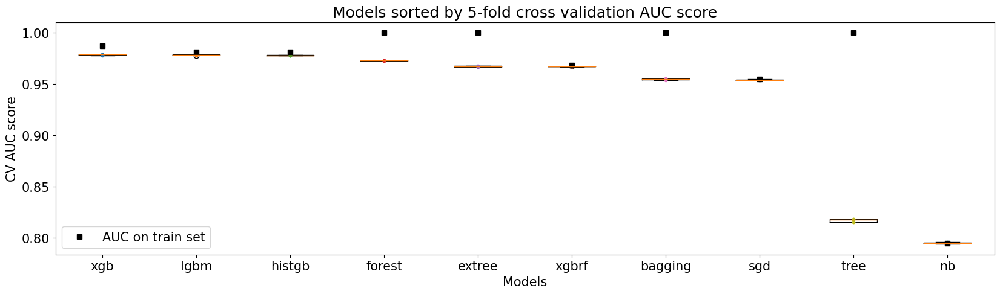

In [ ]:
# sort the models and plot the box plots of CV AUC scores
mean_AUC = [np.mean(AUC) for AUC in AUC_CVs]
sorted_AUC_CV = [i for _, i in [(mean_AUC[i], AUC_CVs[i]) for i in np.argsort(mean_AUC)[::-1]]]
sorted_clf = [i for _, i in [(mean_AUC[i], list_clf[i]) for i in np.argsort(mean_AUC)[::-1]]]
sorted_AUC_train = [i for _, i in [(mean_AUC[i], AUC_train[i]) for i in np.argsort(mean_AUC)[::-1]]]
plt.boxplot(sorted_AUC_CV, labels=sorted_clf)
# add dots for CV AUC scores
for i, AUC in enumerate(sorted_AUC_CV):
  plt.plot([i+1]*len(AUC), AUC, ".")
plt.plot([*range(1,len(sorted_AUC_CV)+1,1)], sorted_AUC_train, "ks", label='AUC on train set')
plt.title(f"Models sorted by {cv_split.get_n_splits()}-fold cross validation AUC score")
plt.xlabel("Models")
plt.ylabel("CV AUC score")
plt.legend()
plt.show()

# Fine-tune hyperparameters of shortlisted models with RandomizedSearchCV

## scikit-optimize

In [ ]:
# create a list of hyperparameters to tune for each shortlisted classifier based on performance and fitting time
def adjust_class_weight(x):
  return {0: y_prep.size / (len(set(y_prep)) * (y_prep.size - x)), 1: y_prep.size / (len(set(y_prep)) * x)}

def adjust_scale_pos_weight(x):
  return (y_prep.size - x) / x

# create a list of hyperparameters to tune for each shortlisted classifier based on performance and fitting time
shortlisted_clfs = {
    # "xgb": XGBClassifier(tree_method = 'hist', n_jobs = -1),
    "lgbm": LGBMClassifier(class_weight='balanced'),
}

param_grids = {
    # # https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html#parameters-tuning
    # # https://lightgbm.readthedocs.io/en/v3.3.5/pythonapi/lightgbm.LGBMClassifier.html#lightgbm.LGBMClassifier
    # # https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html#deal-with-over-fitting
    "lgbm": {
        # "lgbm__class_weight": [adjust_class_weight(w) for w in [10,20,30,40,50]],
        "lgbm__estimator1__learning_rate": (1e-3, 1e-1, 'log-uniform'),
        "lgbm__estimator0__learning_rate": (1e-3, 1e-1, 'log-uniform'),
        "lgbm__estimator1__num_iterations": (100, 200),
        "lgbm__estimator0__num_iterations": (100, 200),
        "lgbm__estimator1__max_bin": (255, 1000),
        "lgbm__estimator0__max_bin": (255, 1000),
        "lgbm__estimator1__num_leaves": (31, 125),
        "lgbm__estimator0__num_leaves": (31, 125),
        "lgbm__estimator1__min_data_in_leaf": (1, 20),
        "lgbm__estimator0__min_data_in_leaf": (1, 20),
    },

    "xgb": {
        # "xgb__estimator0__scale_pos_weight": [adjust_scale_pos_weight(w) for w in np.arange(10,55,5)],
        # "xgb__estimator1__scale_pos_weight": [adjust_scale_pos_weight(w) for w in np.arange(10,55,5)],
        "xgb__estimator1__max_depth": (6, 30),
        "xgb__estimator0__max_depth": (6, 30),
        "xgb__estimator1__min_child_weight": (1e-4, 1e0, 'log-uniform'),
        "xgb__estimator0__min_child_weight": (1e-4, 1e0, 'log-uniform'),
        "xgb__estimator1__lambda": (1e-4, 1e0, 'log-uniform'),
        "xgb__estimator0__lambda": (1e-4, 1e0, 'log-uniform'),
        "xgb__estimator1__max_bin": (256, 1000),
        "xgb__estimator0__max_bin": (256, 1000),
    }
    
}

def refit_strategy(cv_results):
  my_cv_result = pd.DataFrame(cv_results)
  my_cv_result['mean_2sd'] = my_cv_result['mean_test_score'] - 2 * my_cv_result['std_test_score']
  return my_cv_result.sort_values('mean_2sd', ascending=False).head(1).index[0]

In [ ]:
from skopt import BayesSearchCV
# Run RandomizedSearchCV to tune shortlisted models
random_clfs = []
current_time = datetime.now().strftime("%Y%m%d_%H%M%S")

for clf_name, clf in tqdm(shortlisted_clfs.items()):

  full_pipeline = Pipeline(
      [(clf_name, FnHClassifier(
          clf, copy.deepcopy(clf),
          decomposition_method='OneVsFollowers')
      )])  

  print(clf_name)
  print(clf)
  
  param_grid = copy.deepcopy(param_grids[clf_name])
  print(param_grid)
  random_search = BayesSearchCV(
      full_pipeline, 
      search_spaces = param_grid, 
      cv = cv_split, 
      n_iter= 50, 
      scoring = multipartite_AUC_scorer,
      random_state = 42,
      n_jobs = -1,
      error_score = 'raise',
      refit=refit_strategy)
  random_search.fit(X_subset_prep, y_prep)
  random_clfs.append(random_search)

  # print best scores
  # print(f"\nbest_score: {random_search.best_score_}")
  # print(f"best_params: {random_search.best_params_}")
  
  # dump the best model
  print(f'{clf_name} dumped at {current_time}')
  dump(random_search, f'{clf_name}_IMI_{current_time}.joblib') 

  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

lgbm
LGBMClassifier(class_weight='balanced')
{'lgbm__estimator1__learning_rate': (0.001, 0.1, 'log-uniform'), 'lgbm__estimator0__learning_rate': (0.001, 0.1, 'log-uniform'), 'lgbm__estimator1__num_iterations': (100, 200), 'lgbm__estimator0__num_iterations': (100, 200), 'lgbm__estimator1__max_bin': (255, 1000), 'lgbm__estimator0__max_bin': (255, 1000), 'lgbm__estimator1__num_leaves': (31, 125), 'lgbm__estimator0__num_leaves': (31, 125), 'lgbm__estimator1__min_data_in_leaf': (1, 20), 'lgbm__estimator0__min_data_in_leaf': (1, 20)}


Found `num_iterations` in params. Will use it instead of argument


[LightGBM] [Warning] min_data_in_leaf is set=18, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=18


Found `num_iterations` in params. Will use it instead of argument


lgbm dumped at 20230323_101728


100%|███████████████████████████████████████████████████████████████████████████████| 1/1 [3:03:40<00:00, 11020.93s/it]


# Check model performance after tuning

In [ ]:
tuned_models = {}
time_list = []
time_diff = []
# specify regex pattern to load latest models
match_pattern = '_IMI_(\w+).joblib'

for current_time in [re.search(match_pattern, x).group(1) for x in os.listdir() if re.search(match_pattern, x) is not None]:
  time_diff.append(datetime.now() - datetime.strptime(current_time, "%Y%m%d_%H%M%S"))
  time_list.append(current_time)

latest = time_list[np.argmin(time_diff)]
for file in [x for x in os.listdir() if (re.search(match_pattern, x) is not None) and latest in x]:
  model = load(file)
  tuned_models[model.best_estimator_.steps[-1][0]] = model
  print(model.best_estimator_.steps[-1][0], "IMI loaded", latest)

lgbm IMI loaded 20230323_101728


## AUROC

In [ ]:
# pull the CV AUC results from RandomizedSearchCV
tuned_AUC = []
for clf_name, model in tuned_models.items():
  cv_AUC_colindex = [i for i, x in enumerate(model.cv_results_.keys()) if re.search('split\w+_test_score', x) is not None]
  tuned_AUC.append(pd.DataFrame(model.cv_results_).iloc[model.best_index_,cv_AUC_colindex].values)

In [ ]:
# sort the models and plot the spread of CV AUC scores
mean_tuned_AUC = [np.mean(auc) for auc in tuned_AUC]
mean_train_AUC = [multipartite_AUC(y_prep, model.best_estimator_.predict_proba(X_subset_prep)) for _, model in tuned_models.items()]
sorted_tuned_AUC = [i for _, i in sorted(zip(mean_tuned_AUC, tuned_AUC), reverse = True)]
sorted_tuned_clf = [i for _, i in sorted(zip(mean_tuned_AUC, tuned_models.keys()), reverse = True)]
sorted_train_AUC = [i for _, i in sorted(zip(mean_tuned_AUC, mean_train_AUC), reverse = True)]

1.00, 2.00
1.00, 2.00
0.97, 1.94
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.97']


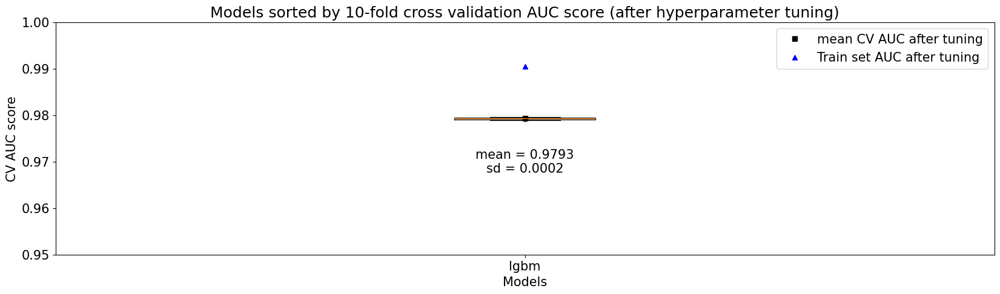

In [ ]:
plt.boxplot(sorted_tuned_AUC, labels=sorted_tuned_clf)
# add dots for CV AUC scores
for i, AUC in enumerate(sorted_tuned_AUC):
  plt.plot([i+1]*len(AUC), AUC, ".")
  plt.annotate(f"mean = {np.mean(AUC):0.4f}\nsd = {np.std(AUC):0.4f}",(i+1, 0.97), ha = 'center', va = 'center')

plt.plot([*range(1,len(sorted_tuned_AUC)+1,1)], [np.mean(x) for x in sorted_tuned_AUC], 
         "ks", label = 'mean CV AUC after tuning')
plt.plot([*range(1,len(sorted_tuned_AUC)+1,1)], sorted_train_AUC, 
         "b^", label = 'Train set AUC after tuning')
plt.legend()
plt.title(f"Models sorted by 10-fold cross validation AUC score (after hyperparameter tuning)")
plt.xlabel("Models")
plt.ylim(0.95,1)
plt.ylabel("CV AUC score")
plt.show()

# Read test set

In [ ]:
test_set = pd.read_pickle("Task_3A_test.pkl")

## load dataset_preparation()

In [ ]:
dataset_preparation = load('dataset_preparation.joblib')
dataset_preparation

Pipeline(steps=[('manualtransformer', ManualTransformer()),
                ('outlierremoval', OutlierRemoval())])

In [ ]:
test_clean = dataset_preparation.transform(test_set)
test_clean

,GENDER,occupation_risk,RES_CNTRY_CA,CNTRY_OF_INCOME_CA,PEP_FL,COUNTRY_RISK_INCOME,COUNTRY_RISK_RESIDENCY,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,RISK,MISSING_NAME,DIFF_CNTRY,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,DATA_ENTRY_ERROR,TOTAL_SUM,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE
0,Female,Low,1,1,0,Low,Low,4.0000,12.0000,78.0000,38.0000,-0.2188,0.3533,0.5535,-0.0460,0.0560,0.0122,-0.2564,0.0888,0.0565,0.4458,0.0287,0.2550,0.2082,-0.1006,0.4054,0.0954,0.0191,0.1197,0.1056,0.0259,0.2487,-0.1419,-0.0079,-0.1583,0.1041,0.1195,0.5091,-0.3233,-0.3018,0.1363,0.3342,0.4547,-0.0127,-0.3403,-0.1880,-0.0050,0.4391,0.4365,-0.1296,-0.4105,-0.1957,-0.2883,-0.3471,0.2120,-0.4060,-0.4935,-0.5227,-0.2072,0.2848,-0.4768,-0.0530,-0.4282,0.0518,-0.1867,-0.3968,-0.3620,-0.2539,-0.3976,-0.3154,0.0031,0.0352,0.1737,-0.2315,-0.7493,0.1096,-0.1532,0.2572,-0.0373,0.3300,0.2589,0.2785,-0.5663,-0.0828,-0.0205,0.2865,-0.0711,-0.1867,0.0277,-0.0926,-0.4076,-0.1577,-0.0455,-0.3366,-0.2874,0.2259,0.0210,-0.1194,0.2354,0.3066,-0.1278,0.1313,-0.0924,-0.2144,-0.7495,-0.6053,0.0417,-0.4594,0.1277,0.0603,0.0330,low,0,0,73.5880,29.0951,"1,639.9744",519.5263,"1,098.5725",309.7242,0,"155,770.9800",2.5110,3.1567,3.5469,0.8788,0.6724,0.2500,0.0476,0.0731,0.0036,0.0387,677.6000,"108,176.0000"
1,Male,High,1,1,1,Low,Low,8.0000,33.0000,66.0000,124.0000,-0.0497,-0.0088,0.0736,0.0075,0.0652,-0.0014,0.0158,0.0473,-0.1014,0.0266,-0.0269,0.0214,0.0237,-0.0528,0.1692,-0.1040,0.1008,0.0436,-0.1041,0.0143,0.0229,-0.0956,-0.1347,0.0096,0.0057,0.1209,0.2418,-0.1106,-0.0868,0.0573,0.1770,0.1227,0.1008,0.0170,-0.0709,-0.0171,-0.0117,0.0626,0.0192,-0.0903,-0.1905,-0.1566,-0.0577,-0.0380,-0.0074,-0.1828,-0.1254,0.0009,0.0139,-0.1068,-0.0705,-0.0444,0.0343,0.0200,-0.0693,-0.0200,-0.0789,-0.0296,-0.0802,-0.0511,0.0802,0.1358,-0.1830,-0.1766,-0.0400,-0.1067,0.1757,-0.0197,-0.0039,0.0420,0.1277,-0.1608,0.0350,-0.0585,0.1817,0.0083,-0.0429,-0.0416,-0.0409,-0.0926,-0.0628,-0.0840,-0.0089,-0.0378,0.0160,-0.0518,-0.0032,0.0271,0.0712,-0.0173,0.0387,-0.0430,-0.1173,-0.1513,-0.1908,0.0452,-0.0692,-0.0424,0.0258,-0.0615,medium,0,0,53.1526,18.8282,"74,066.7424","8,875.6694","1,493.8750","1,750.9394",0,"6,058,720.0000",18.5332,8.3449,0.8532,0.8225,0.3474,0.1951,0.0009,0.0140,0.0054,0.0188,"-45,830.0000","3,787,822.0000"
2,Female,High,1,1,0,Low,Low,17.0000,80.0000,217.0000,214.0000,-0.0037,-0.0017,0.0017,-0.0017,-0.0029,0.0017,-0.0048,-0.0038,-0.0031,0.0040,0.0004,0.0026,-0.0024,0.0046,0.0022,0.0035,-0.0045,-0.0014,0.0032,-0.003

## X,y, sample_weights split

In [ ]:
# make a copy and split X and y
X_test = test_clean.drop(columns = ["RISK", "TOTAL_SUM"]).reset_index(drop = True).copy(deep = True)
y_test = test_clean["RISK"].reset_index(drop = True)
sample_weights_test = test_clean["TOTAL_SUM"].reset_index(drop = True)

In [ ]:
# multiclass
y_test_prep = y_test.replace({'low': 0, 'medium': 1, 'high': 2}).to_numpy() 

## load data_preparation()

In [ ]:
data_preparation = load('data_preparation.joblib')
data_preparation

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('randomimputer',
                                                                   RandomImputer()),
                                                                  ('myquantiletransformer',
                                                                   MyQuantileTransformer(output_distribution='normal',
                                                                                         random_state=42))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000021774A57160>),
                                                 ('cat',
                                                  Pipeline(steps=[('randomimputer',
                                                                   Ra...
                                                  ['GENDER', 'RES_CNTRY_CA',
                                                   'CNTRY_OF_INCOME_CA',
                                                   'PEP_FL', 'MISSING_NAME',
                                                   'DIFF_CNTRY',
                                                   'DATA_ENTRY_ERROR']),
                                                 ('ord',
                                                  Pipeline(steps=[('randomimputer',
                                                                   RandomImputer()),
                                                                  ('thermometerencoder',
                                                                   ThermometerEncoder()),
                                                                  ('myminmaxscaler',
                                                                   MyMinMaxScaler(feature_range=(-2,
                                                                                                 2)))]),
                                                  ['occupation_risk',
                                                   'COUNTRY_RISK_INCOME',
                                                   'COUNTRY_RISK_RESIDENCY'])],
                                   verbose_feature_names_out=False))])

In [ ]:
X_test_prep = pd.DataFrame(data_preparation.transform(X_test), columns=data_preparation.get_feature_names_out())
X_test_prep

,CASH_CNT_IN,CASH_CNT_OUT,WIRES_CNT_IN,WIRES_CNT_OUT,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63,embedding_64,embedding_65,embedding_66,embedding_67,embedding_68,embedding_69,embedding_70,embedding_71,embedding_72,embedding_73,embedding_74,embedding_75,embedding_76,embedding_77,embedding_78,embedding_79,embedding_80,embedding_81,embedding_82,embedding_83,embedding_84,embedding_85,embedding_86,embedding_87,embedding_88,embedding_89,embedding_90,embedding_91,embedding_92,embedding_93,embedding_94,embedding_95,embedding_96,embedding_97,embedding_98,embedding_99,AGE,HIST_JOIN,WIRES_AVG_IN,WIRES_AVG_OUT,CASH_AVG_IN,CASH_AVG_OUT,WIRES_VS_CASH_AVG,IN_VS_OUT_WIRES_AVG,IN_VS_OUT_CASH_AVG,WIRES_pct_CNT,IN_pct_WIRES_CNT,IN_pct_CASH_CNT,WIRES_IN_CNT_VS_AVG,WIRES_OUT_CNT_VS_AVG,CASH_IN_CNT_VS_AVG,CASH_OUT_CNT_VS_AVG,CASH_BALANCE,WIRES_BALANCE,GENDER_Male,RES_CNTRY_CA_1,CNTRY_OF_INCOME_CA_1,PEP_FL_1,MISSING_NAME_1,DIFF_CNTRY_1,DATA_ENTRY_ERROR_1,occupation_risk_Moderate,occupation_risk_High,COUNTRY_RISK_INCOME_Moderate,COUNTRY_RISK_INCOME_High,COUNTRY_RISK_RESIDENCY_Moderate,COUNTRY_RISK_RESIDENCY_High
0,-0.3790,-0.3562,0.1056,-0.9734,-2.1375,2.9799,2.7264,-1.8858,0.8015,1.0222,-2.7666,1.5358,2.7599,2.8252,2.0160,2.5140,2.2248,-1.5959,1.8897,2.9334,0.0570,1.7986,2.9633,1.5576,2.3022,-1.4621,-0.0124,-2.4921,2.0291,1.1301,1.7118,-1.9342,-2.0025,1.9336,1.6527,2.3441,-2.6245,-3.0568,-1.8810,-0.5558,3.0240,2.6895,-2.4775,-2.5044,-0.9812,-1.7188,-2.3537,2.9472,-2.9217,-2.0246,-2.3668,-2.6290,2.6935,-2.4201,-0.8860,-2.5524,1.3062,-2.5688,-2.4245,-2.7908,-2.0876,-2.6430,-2.1513,1.2025,0.3319,1.1409,-1.2272,-2.4297,2.6061,-1.2772,1.2929,-0.8797,2.8738,2.3644,1.6822,-2.2546,-2.4887,-0.1804,1.5001,-2.1167,-2.1683,2.1167,-1.7435,-2.3618,-1.8124,-0.4499,-2.8073,-2.5387,2.3126,2.1643,-1.9946,2.4936,2.2682,-2.1673,1.9786,-1.6115,-1.6205,-2.5866,-2.1473,0.9773,-2.7170,2.6187,1.8478,2.1946,1.2384,1.0360,-0.9992,-1.7474,0.1401,-0.7204,-0.9766,0.2906,1.2505,-0.0993,1.5015,-0.0603,0.8505,0.3145,-0.3756,0.2244,0.4457,0.1024,-2.0000,2.0000,2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000,-2.0000
1,0.2887,0.7233,-0.0753,-0.0138,-0.9729,-0.5904,1.0101,0.7684,0.9241,-0.4316,1.1523,1.0172,-1.0961,0.7771,-0.8840,1.1669,0.6226,-1.0674,0.9761,-1.0764,1.0633,1.0244,-1.0886,1.3272,0.4872,-1.0745,-1.0264,0.7169,0.6125,1.1406,0.9150,-0.8678,-0.8278,1.3399,0.9865,1.1354,0.9144,0.6547,-1.0372,-1.0792,-1.3990,1.1333,0.7557,-1.2591,-0.9567,-1.0824,-0.8532,-0.8077,-0.8389,-1.0027,-0.9899,-0.1613,1.1753,-1.0844,-1.1251,-0.7579,1.0061,1.1059,-0.9545,-1.2166,-1.0985,-0.6762,-0.8898,-0.9674,1.0462,0.8975,-0.9765,-0.9526,-0.8774,-0.9208,0.8959,-0.3737,-0.5779,1.0740,0.8963,-0.9999,0.7261,-0.9420,1.0077,0.6116,-1.2222,-1.0055,-1.1636,-1.0307,-1.0466,-0.9911,-1.0418,-1.2697,0.5474,-1.0604,-0.0606,1.2869,1.0391,-1.1971,1.1784,-1.0159,-1.0189,-0.9891,-0.9582,1.0394,-1.2431,-0.9826,1.4837,-1.2551,0.1245,0.1085,0.7935,0.4911,0.3643,1.1585,0.7097,1.4348,-1.1790,-0.6629,-0.0711,-0.3709,-0.8548,-0.5113,-0.0339,-0.4099,-1.3481,0.8495,2.0000,2.0000,2.0000,2.0000,-2.0000,-2.0000,-2.0000,2.0000,2.0000,-2.0000,-2.0000,-2.0000,-2.0000
2,1.1047,1.9595,1.6641,0.6487,0.1009,0.1175,-0.3981,-0.5110,-1.2028,0.0

## load model

In [ ]:
tuned_models = {}
time_list = []
time_diff = []
# specify regex pattern to load latest models
match_pattern = '_IMI_(\w+).joblib'

for current_time in [re.search(match_pattern, x).group(1) for x in os.listdir() if re.search(match_pattern, x) is not None]:
  time_diff.append(datetime.now() - datetime.strptime(current_time, "%Y%m%d_%H%M%S"))
  time_list.append(current_time)

latest = time_list[np.argmin(time_diff)]
for file in [x for x in os.listdir() if (re.search(match_pattern, x) is not None) and latest in x]:
  model = load(file)
  tuned_models[model.best_estimator_.steps[-1][0]] = model
  print(model.best_estimator_.steps[-1][0], "IMI loaded", latest)

lgbm IMI loaded 20230323_101728


## Pick best model

In [ ]:
best_model = tuned_models['lgbm'].best_estimator_
best_model

Pipeline(steps=[('lgbm',
                 FnHClassifier(decomposition_method='OneVsFollowers',
                               estimator0=LGBMClassifier(class_weight='balanced',
                                                         learning_rate=0.03963187800771383,
                                                         max_bin=572,
                                                         min_data_in_leaf=18,
                                                         num_iterations=200,
                                                         num_leaves=125),
                               estimator1=LGBMClassifier(class_weight='balanced',
                                                         learning_rate=0.06505896598637156,
                                                         max_bin=1000,
                                                         min_data_in_leaf=20,
                                                         num_iterations=200,
                                                         num_leaves=125)))])

# Evaluation on test set

# Model performance on test set

## Predicted Probabilities distribution

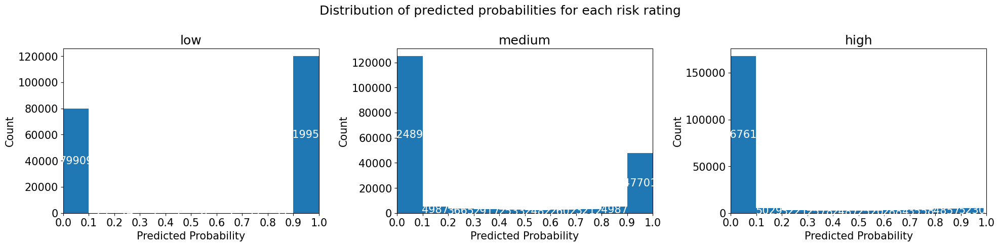

In [ ]:
# prediction
y_score = best_model.predict_proba(X_test_prep)
fig, axes = plt.subplots(1,3)
for i, ax in enumerate(axes.flatten()):
  y_prob = y_score[:,i]
  ax.hist(y_prob, bins = 10)
  for rect in ax.patches:
      height = rect.get_height()
      ax.annotate(f"{height:0.0f}",
                  xy=(rect.get_x() + rect.get_width() / 2, height/2),
                  xytext=(0, 0),  # 3 points vertical offset
                  textcoords="offset points",
                  color = 'white',
                  ha='center', va='center')
  ax.set_xlim(0,1)
  ax.set_xticks(np.arange(0,1.1,0.1))
  ax.set_xlabel("Predicted Probability")
  ax.set_ylabel("Count")
  ax.set_title(f"{y_test.cat.categories[i]}")

plt.suptitle("Distribution of predicted probabilities for each risk rating")
plt.tight_layout()
plt.show()

## Macro OvO ROC and AUROC
- (2009, Baccianella, Andrea Esuli and Fabrizio Sebastiani) [Evaluation Measures for Ordinal Regression](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=5364825)
- (2001, Hand and Till) [A Simple Generalisation of the Area Under the ROC Curve for Multiple Class Classification Problems](https://link.springer.com/article/10.1023/A:1010920819831)

1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']


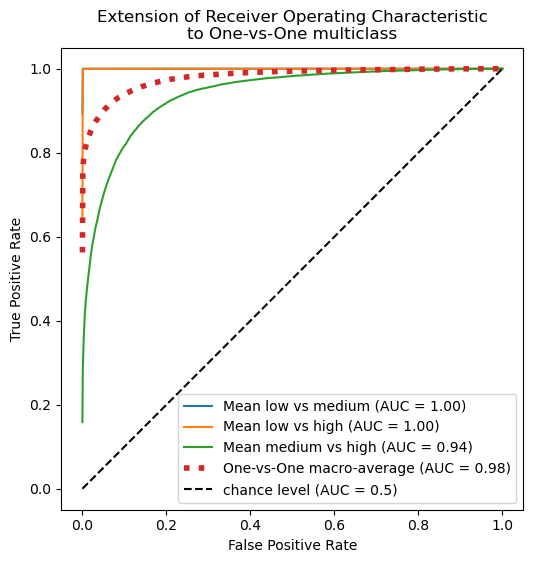

In [ ]:
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#plot-all-ovo-roc-curves-together
from sklearn.metrics import auc, RocCurveDisplay
matplotlib.rcParams.update({'font.size': 10})
fpr_grid = np.linspace(0.0, 1.0, 1000)
pair_scores = []
mean_tpr = dict()

macro_roc_auc_ovo = multipartite_AUC(y_test_prep, best_model.predict_proba(X_test_prep))
ovo_tpr = np.zeros_like(fpr_grid)
pair_list = list(combinations(np.unique(y_test_prep), 2))

fig, ax = plt.subplots(figsize=(6, 6))
for ix, (label_a, label_b) in enumerate(pair_list):
  a_mask = y_test_prep == label_a
  b_mask = y_test_prep == label_b
  ab_mask = np.logical_or(a_mask, b_mask)

  a_true = a_mask[ab_mask]
  b_true = b_mask[ab_mask]

  fpr_a, tpr_a, _ = roc_curve(a_true, y_score[ab_mask, label_a])
  fpr_b, tpr_b, _ = roc_curve(b_true, y_score[ab_mask, label_b])

  mean_tpr[ix] = np.zeros_like(fpr_grid)
  mean_tpr[ix] += np.interp(fpr_grid, fpr_a, tpr_a)
  mean_tpr[ix] += np.interp(fpr_grid, fpr_b, tpr_b)
  mean_tpr[ix] /= 2
  mean_score = auc(fpr_grid, mean_tpr[ix])
  pair_scores.append(mean_score)
  
  ovo_tpr += mean_tpr[ix]
  plt.plot(
      fpr_grid,
      mean_tpr[ix],
      label=f"Mean {y_test.cat.categories[label_a]} vs {y_test.cat.categories[label_b]} (AUC = {pair_scores[ix]:.2f})",
  )

ovo_tpr /= sum(1 for pair in enumerate(pair_list))

plt.plot(
    fpr_grid,
    ovo_tpr,
    label=f"One-vs-One macro-average (AUC = {macro_roc_auc_ovo:.2f})",
    linestyle=":",
    linewidth=4,
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Extension of Receiver Operating Characteristic\nto One-vs-One multiclass")
plt.legend()
plt.show()
matplotlib.rcParams.update({'font.size': 15})

## Lift and gain chart
- in terms of 3 binary comparisons

         gain   lift
decile              
1      0.2714 2.7140
2      0.5428 2.7139
3      0.8142 2.7140
4      1.0000 2.5000
5      1.0000 2.0000
6      1.0000 1.6667
7      1.0000 1.4286
8      1.0000 1.2500
9      1.0000 1.1111
10     1.0000 1.0000


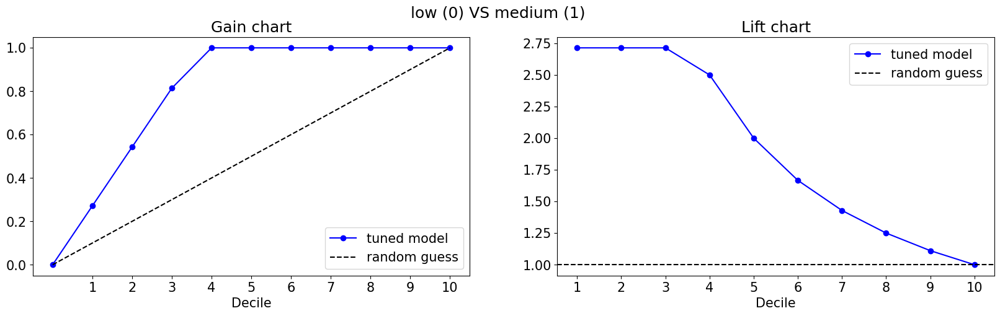

         gain   lift
decile              
1      0.9994 9.9940
2      1.0000 5.0000
3      1.0000 3.3333
4      1.0000 2.5000
5      1.0000 2.0000
6      1.0000 1.6667
7      1.0000 1.4286
8      1.0000 1.2500
9      1.0000 1.1111
10     1.0000 1.0000


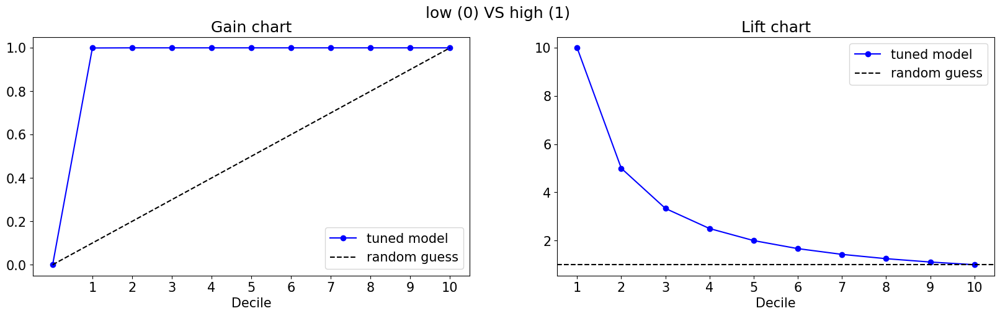

         gain   lift
decile              
1      0.5362 5.3620
2      0.8192 4.0960
3      0.9456 3.1520
4      0.9843 2.4607
5      0.9954 1.9908
6      0.9981 1.6635
7      0.9991 1.4273
8      0.9994 1.2492
9      1.0000 1.1111
10     1.0000 1.0000


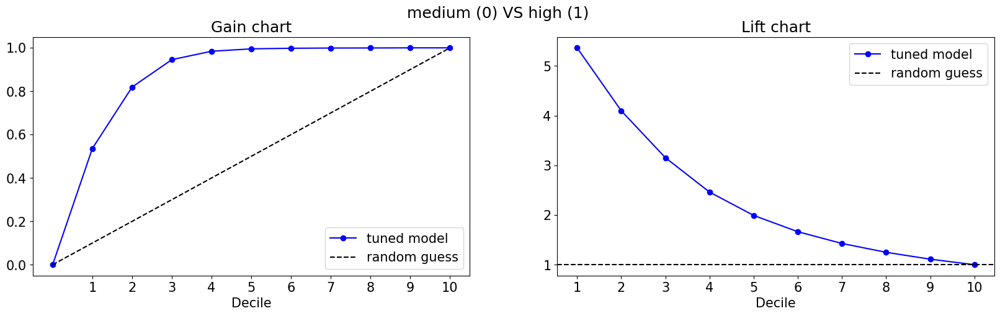

In [ ]:
# fig, axes = plt.subplots(3,1)
for (label_a, label_b) in combinations(np.sort(np.unique(y_test_prep)), 2):
  a_mask = y_test_prep == label_a
  b_mask = y_test_prep == label_b
  ab_mask = np.logical_or(a_mask, b_mask)
  temp_df = pd.DataFrame({
      'y': y_test_prep[ab_mask],
      'prob': y_score[ab_mask, label_b]
  })
  temp_df.sort_values('prob', ascending=False, inplace=True)
  temp_df['decile'] = pd.qcut(temp_df['prob'],10,labels=[i for i in np.arange(10,0,-1)])
  lift_n_gain = temp_df.groupby('decile').agg({'y': lambda x: np.sum(x == label_b)}).sort_index(ascending=False)
  lift_n_gain.columns = ['sum_of_positive_cases_identified']
  lift_n_gain['gain'] = lift_n_gain[['sum_of_positive_cases_identified']].apply(lambda x: x.cumsum() / x.sum())
  lift_n_gain['lift'] = lift_n_gain['gain'] / (lift_n_gain.index.values.astype(int) / 10)
  print(lift_n_gain[['gain', 'lift']])
  fig2, axes2 = plt.subplots(1,2)
  axes2[0].plot(np.arange(0,11,1), [0] + list(lift_n_gain['gain'].values), 'bo-', label = 'tuned model')
  axes2[0].plot(np.arange(0,11,1), np.arange(0,11,1) / 10, 'k--', label = 'random guess')
  axes2[1].plot(np.arange(1,11,1), lift_n_gain['lift'].values, 'bo-', label = 'tuned model')
  axes2[1].axhline(1, color = 'k', linestyle='--', label = 'random guess')
  axes2[0].set_title('Gain chart')
  axes2[1].set_title('Lift chart')
  plt.suptitle(f'{y_test.cat.categories[label_a]} (0) VS {y_test.cat.categories[label_b]} (1)')
  for ax in axes2:
    ax.set_xticks(np.arange(1,11,1))
    ax.set_xlabel("Decile")
    ax.legend()
  # axes2[1].set_yticks(np.arange(1,11,1))
  plt.show()

# Interpretability

## Feature importances and Permutation importance (!increase to n_repeats=30) (3min)

Streaming output truncated to the last 5000 lines.
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 1.00', 'Classes 0, 2: 1.00', 'Classes 1, 2: 0.94']
1.00, 2.00
1.00, 2.00
0.94, 1.88
['Classes 0, 1: 

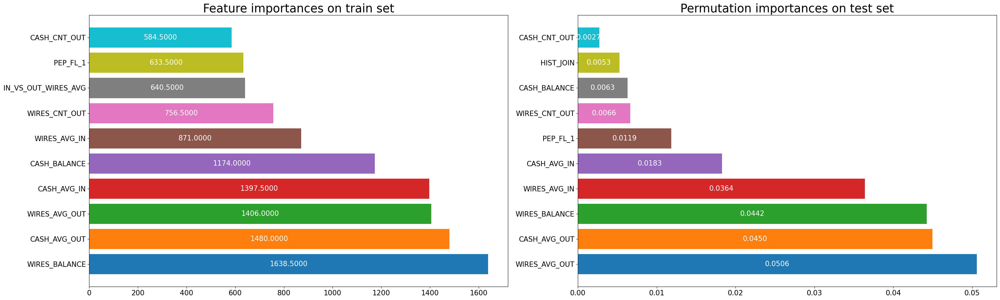

In [ ]:
# non-zero (signficant) features after regularization in fitting estimator
features_out = data_preparation.get_feature_names_out()
top_features = {}

fig, axes = plt.subplots(1,2, figsize = (30,10))

for xyz, ax in zip(range(2), axes.flatten()):

  if xyz == 0:
    try:
      coef = best_model.steps[-1][1].feature_importances_
    except:
      coef = best_model.steps[-1][1].coef_[0]
  elif xyz == 1:
    coef = permutation_importance(best_model.steps[-1][1], X_test_prep, y_test_prep, n_repeats=30, random_state=42, scoring = multipartite_AUC_scorer).importances_mean
  print(f"Number of features after fitting estimator with regularization: \n{np.count_nonzero(coef)}")
  features_non_zero = [features_out[loc] for loc in np.nonzero(coef)[0]]
  coef_non_zero = [np.around(coef[loc], decimals=4) for loc in np.nonzero(coef)[0]]
  print(f"features = {[feature_ for _, feature_ in sorted(zip(np.abs(coef_non_zero), features_non_zero), reverse=True)]}")
  print(f"coefficient = {[coef_ for _, coef_ in sorted(zip(np.abs(coef_non_zero), coef_non_zero), reverse=True)]}")

  abs_coef = np.abs(coef)
  top_n = 10
  top_features[xyz] = sorted(zip(abs_coef, coef, features_out), reverse=True)[:top_n]
  for i, (_, coef, name) in enumerate(top_features[xyz]):
    ax.barh(name, coef)
  for rect in ax.patches:
      width = rect.get_width()
      if xyz == 0:
        annot_txt = f"{width:0.4f}"
      else:
        annot_txt = f"{width:0,.4f}"
      ax.annotate(annot_txt,
                  xy=(width/2, rect.get_y() + rect.get_height() / 2),
                  xytext=(0, 0),  # 3 points vertical offset
                  textcoords="offset points",
                  fontsize = 15,
                  color = 'white',
                  ha='center', va='center')
  ax.tick_params(axis='both', which='major', labelsize=15)
  if xyz == 0:
    ax.set_title(f"Feature importances on train set", size = 25)
  else:
    ax.set_title(f"Permutation importances on test set", size = 25)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### EDA of top features

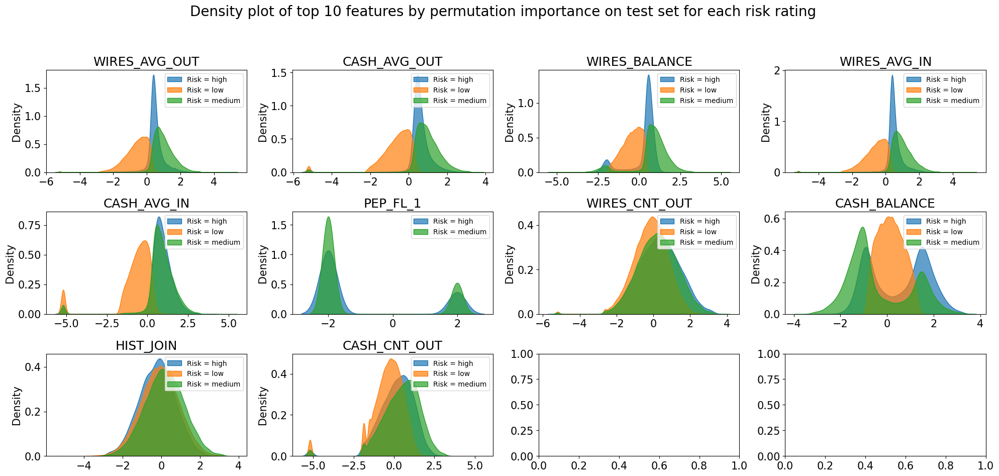

In [ ]:
# Univariate density plot by RISK rating
fig, axes = plt.subplots(3,int(top_n // 3) + 1,figsize=(20,10))

norm_clean = pd.concat([
    X_test_prep,
    y_test], axis = 1)

for ax, col in zip(axes.flatten(), [x[2] for x in top_features[1]]):
  for risk in sorted(y_test.unique()):
    try:
      sns.kdeplot(norm_clean.loc[norm_clean['RISK'] == risk, col], fill=True, label=f"Risk = {risk}", alpha=.7, ax=ax, warn_singular=False, 
                  gridsize=200, legend = True)
    except LinAlgError:
      print(f"only 1 unique value of {norm_clean.loc[norm_clean['cluster'] == risk, col].unique()[0]:0.3f} for {col} in risk {risk}")
  ax.set_title(col)
  ax.legend(loc = 'upper right', prop={'size': 10})
  ax.set_xlabel('')

fig.suptitle('Density plot of top 10 features by permutation importance on test set for each risk rating', fontsize=20)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Shapley values (2min)

In [ ]:
# stratify_sample = pd.concat([
#     X_test_prep.select_dtypes(np.number),
#     y_test], 
#     axis = 1).sample(10_000, weights = 1/(y_test.to_frame().groupby('RISK').RISK.transform('size') / y_test.shape[0]), replace = True)

In [ ]:
X_sample = X_test_prep.sample(10_000, replace=True)

In [ ]:
explainer = shap.Explainer(lambda x: best_model.predict_proba(x), X_test_prep.median().values.reshape(1,-1))
shap_values = explainer(X_sample) # sample 10k (runtime = 1 minute)

Permutation explainer: 10001it [03:12, 50.22it/s]                                                                      


In [ ]:
shap_values.shape

(10000, 135, 3)

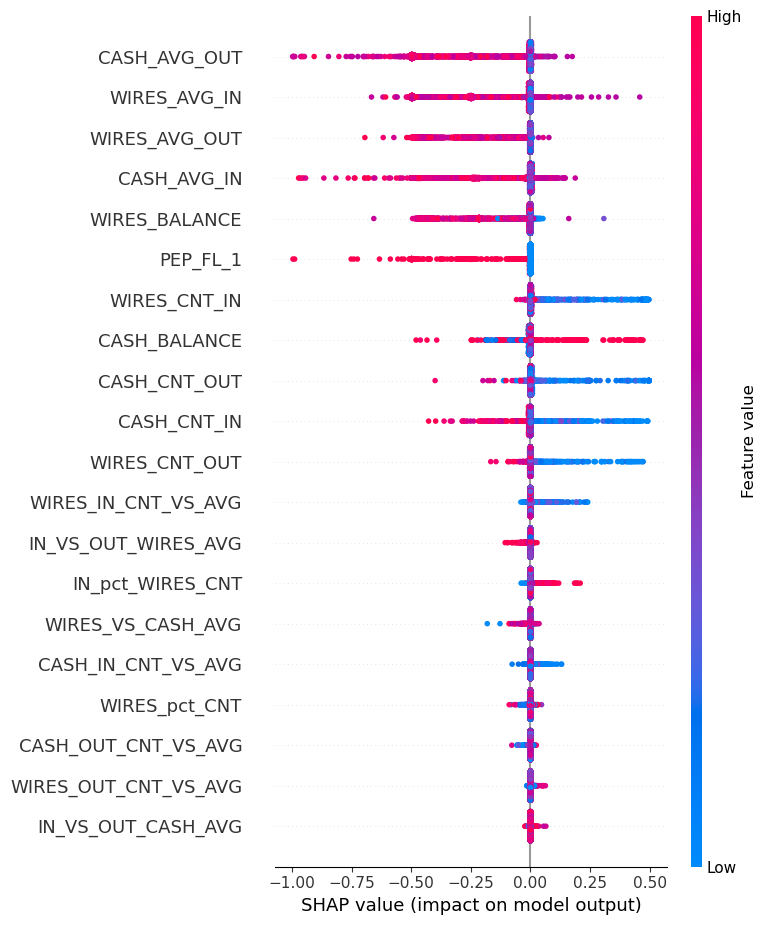

In [ ]:
# low risk
shap.summary_plot(shap_values[:,:,0], plot_type = "dot", title="SHAP Data")

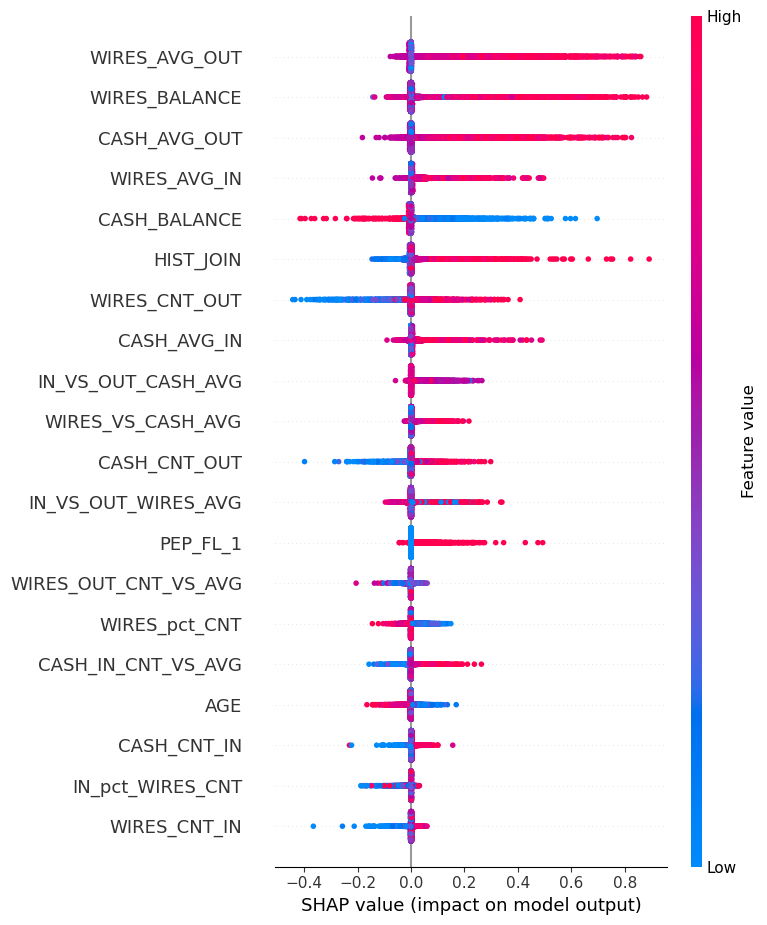

In [ ]:
# medium risk
shap.summary_plot(shap_values[:,:,1], plot_type = "dot", title="SHAP Data")

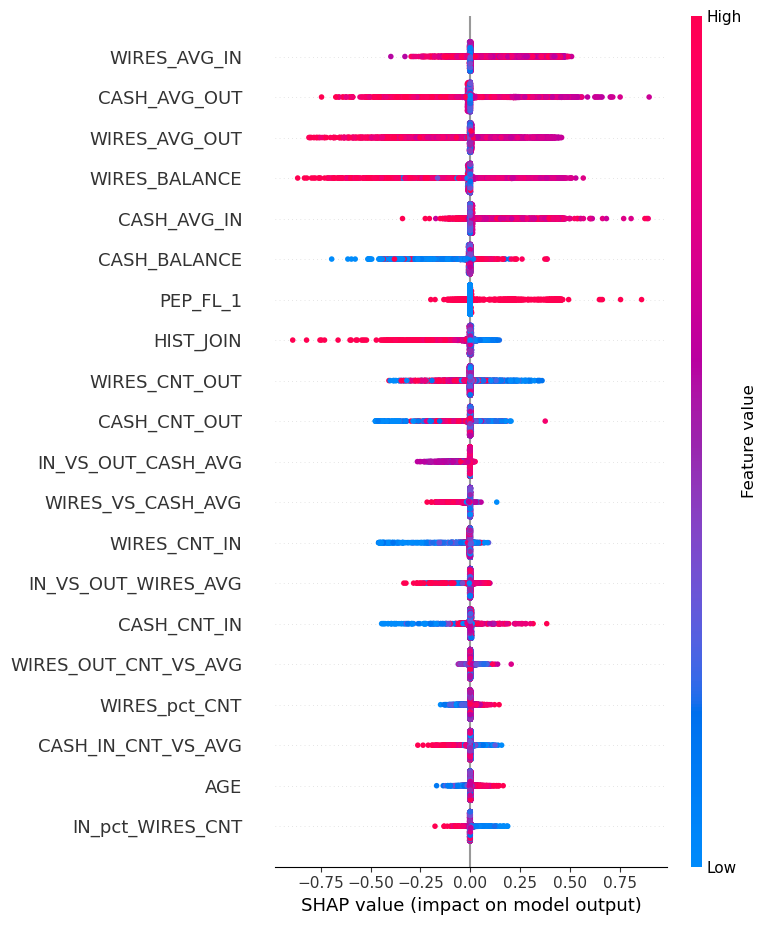

In [ ]:
# high risk
shap.summary_plot(shap_values[:,:,2], plot_type = "dot", title="SHAP Data")

## Partial dependence plots (4min)

In [ ]:
# best_model[0].classes_ = np.array([0,1,2])

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

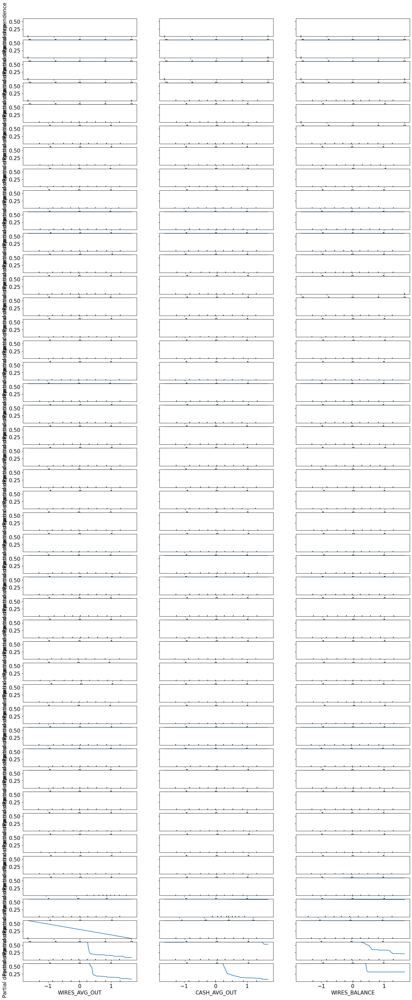

In [ ]:
# low risk
fig, ax = plt.subplots(1,1, figsize = (20,50))
PartialDependenceDisplay.from_estimator(
    best_model, 
    X_sample, 
    features = X_test_prep.columns[best_model[0].feature_importances_.argsort()].values, 
    feature_names = X_test_prep.columns, 
    target=0, 
    kind='average',
    response_method='predict_proba', 
    n_jobs=-1,
    ax=ax)

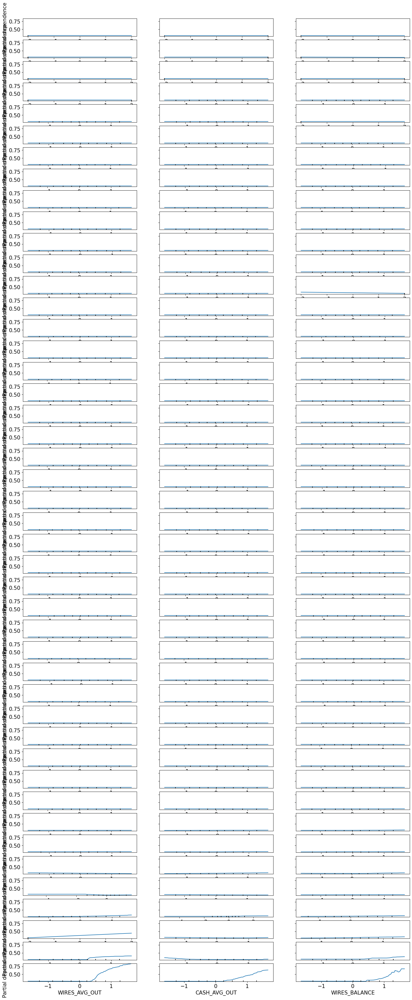

In [ ]:
# medium risk
fig, ax = plt.subplots(1,1, figsize = (20,50))
PartialDependenceDisplay.from_estimator(
    best_model, 
    X_sample, 
    features = X_test_prep.columns[best_model[0].feature_importances_.argsort()].values, 
    feature_names = X_test_prep.columns, 
    target=1, 
    kind='average',
    response_method='predict_proba', 
    n_jobs=-1,
    ax=ax)

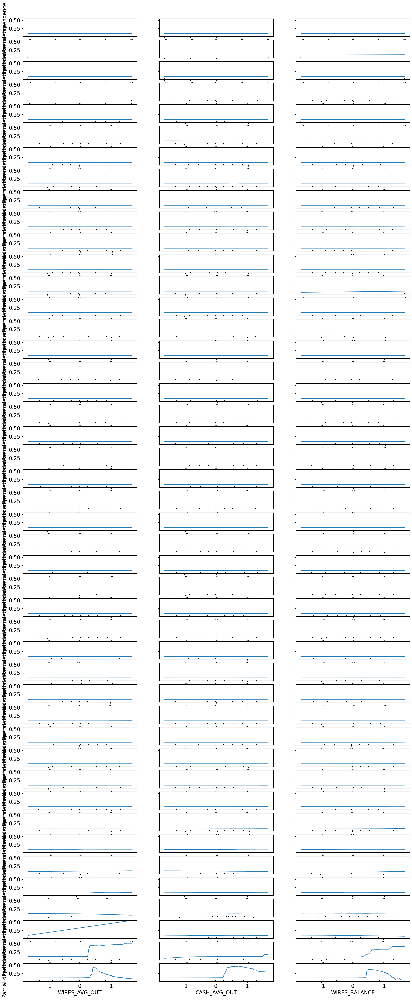

In [ ]:
# high risk
fig, ax = plt.subplots(1,1, figsize = (20,50))
PartialDependenceDisplay.from_estimator(
    best_model, 
    X_sample, 
    features = X_test_prep.columns[best_model[0].feature_importances_.argsort()].values, 
    feature_names = X_test_prep.columns, 
    target=2, 
    kind='average',
    response_method='predict_proba', 
    n_jobs=-1,
    ax=ax)

# Probability cutoff

## Precision Recall Curve

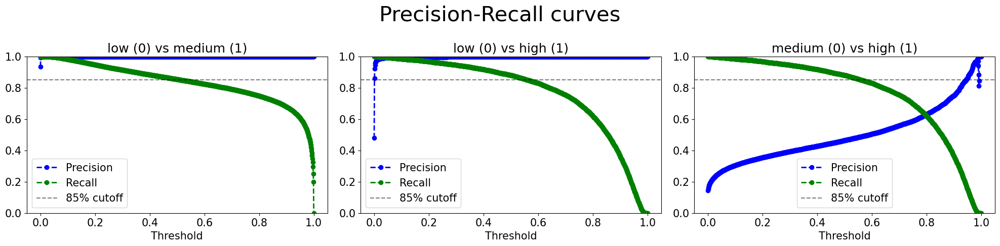

In [ ]:
fig, axes = plt.subplots(1,3)
pair_list = list(combinations(np.unique(y_test_prep), 2))
threshold_grid = np.linspace(0.0, 1.0, 1000)

for ax, (label_a, label_b) in zip(axes.flatten(), pair_list):
  a_mask = y_test_prep == label_a
  b_mask = y_test_prep == label_b
  ab_mask = np.logical_or(a_mask, b_mask)

  a_true = a_mask[ab_mask]
  b_true = b_mask[ab_mask]

  precision_b, recall_b, thresholds = precision_recall_curve(b_true, y_score[ab_mask, label_b])
  recall_interpolated = np.zeros_like(threshold_grid)
  recall_interpolated += np.interp(threshold_grid, thresholds, recall_b[:-1])
  precision_interpolated = np.zeros_like(threshold_grid)
  precision_interpolated += np.interp(threshold_grid, thresholds, precision_b[:-1])

  ax.plot(threshold_grid, precision_interpolated, 'b--o', label = "Precision", linewidth = 2)
  ax.plot(threshold_grid, recall_interpolated, "g--o", label = "Recall", linewidth = 2)
  ax.axhline(0.85, ls='--', c='k', alpha=0.5, label = '85% cutoff')
  ax.set_xlabel("Threshold")
  ax.set_ylim(0,1)
  ax.set_title(f"{y_test.cat.categories[label_a]} (0) vs {y_test.cat.categories[label_b]} (1)")
  ax.legend()

plt.suptitle("Precision-Recall curves", size = 30)
plt.tight_layout()
plt.show()

## Cost sensitive cutoff
- average cutoff of low vs high and medium vs high 
  - cost of misclassifying high risk as low risk != cost of misclassifying high risk as medium risk
- you won't know the priori when deployed

### misclassification loss = 0 to 100%

In [ ]:
# as a % of revenue per customer
misclassification_matrix = np.array([
    [0.0, 0.1, 0.5],
    [0.2, 0.0, 0.3],
    [1.0, 0.6, 0.0]])

In [ ]:
def plot_misclassification_losses(y_pred, cutoff = None):
  # y_pred, cutoff
  fig, axes = plt.subplots(1,3)
  ConfusionMatrixDisplay(
      misclassification_matrix,
      display_labels=y_test.cat.categories).plot(cmap = 'Blues', ax = axes[0], values_format='.0%')
  axes[0].set_title('Asymmetric loss matrix\n(misclassification loss as %)', fontsize = 14)

  confusion_mat = confusion_matrix(y_test_prep, y_pred)

  ConfusionMatrixDisplay(
      confusion_mat,
      display_labels=y_test.cat.categories).plot(cmap = 'Blues', ax = axes[1], values_format=',.0f')
  axes[1].set_title(f"Confusion matrix\n({np.sum(confusion_mat):,.0f} customers)", fontsize = 14)

  rev_per_customer = 100
  total_loss = confusion_mat * misclassification_matrix * rev_per_customer
  ConfusionMatrixDisplay(
      total_loss,
      display_labels=y_test.cat.categories).plot(cmap = 'Blues', ax = axes[2], values_format=',.0f')
  axes[2].set_title(f'Total misclassification losses\n(${rev_per_customer} from each customer)', fontsize = 14)

  plt.tight_layout(rect=[0, 0.03, 1, 0.85])
  if cutoff is None:
    plt.suptitle(f"""Total misclassification losses = {np.sum(total_loss) / rev_per_customer / np.sum(confusion_mat):,.2%} with cutoff = argmax(probabilities)
    (or \${np.sum(total_loss):,.0f} in total for {np.sum(confusion_mat):,.0f} customers)""")
  else:
    plt.suptitle(f"""Total misclassification losses = {np.sum(total_loss) / rev_per_customer / np.sum(confusion_mat):,.2%} with cutoff = [{cutoff[0]:0.2f} for medium, {cutoff[1]:0.2f} for high]
    (or \${np.sum(total_loss):,.0f} in total for {np.sum(confusion_mat):,.0f} customers)""")
  plt.show()

### default threshold

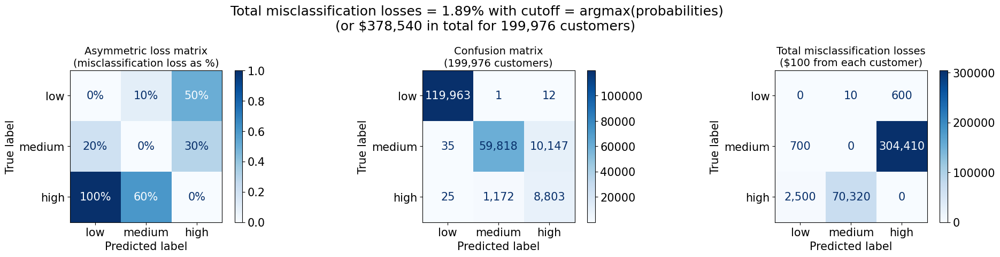

In [ ]:
plot_misclassification_losses(best_model.predict(X_test_prep), None)

In [ ]:
print(classification_report(y_test_prep, best_model.predict(X_test_prep)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    119976
           1       0.98      0.85      0.91     70000
           2       0.46      0.88      0.61     10000

    accuracy                           0.94    199976
   macro avg       0.81      0.91      0.84    199976
weighted avg       0.97      0.94      0.95    199976



### optimized threshold (3min)

In [ ]:
threshold_grid2 = np.linspace(0.0, 1.0, 100)
total_loss_optimized = np.zeros((threshold_grid2.size, threshold_grid2.size))

for i, threshold_i in enumerate(tqdm(threshold_grid2)):
  a_mask = (y_score[:,1] >= threshold_i)
  for j, threshold_j in enumerate(threshold_grid2):
    b_mask = (y_score[:,2] >= threshold_j)
    y_pred_custom = a_mask.astype(int) + b_mask.astype(int)
    total_loss_optimized[i,j] = np.sum(confusion_matrix(y_test_prep, y_pred_custom) * misclassification_matrix)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [04:56<00:00,  2.97s/it]


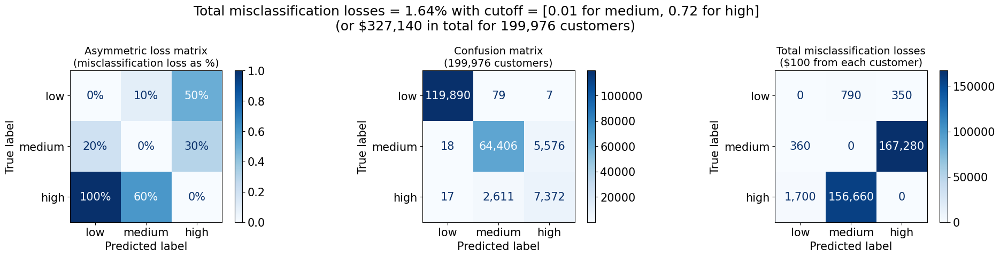

In [ ]:
cutoff_best = [threshold_grid2[k] for k in np.unravel_index(total_loss_optimized.argmin(), total_loss_optimized.shape)]
y_pred_best = (y_score[:,1] >= cutoff_best[0]).astype(int) + (y_score[:,2] >= cutoff_best[1]).astype(int)

plot_misclassification_losses(y_pred_best, cutoff_best)

In [ ]:
print(classification_report(y_test_prep, y_pred_best))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    119976
           1       0.96      0.92      0.94     70000
           2       0.57      0.74      0.64     10000

    accuracy                           0.96    199976
   macro avg       0.84      0.89      0.86    199976
weighted avg       0.96      0.96      0.96    199976



## MAE ranking loss

In [ ]:
# default cutoff
macro_avg_MAE(y_test_prep, best_model.predict(X_test_prep))

['0.00', '0.15', '0.12']


0.08928850595515929

In [ ]:
# cost sensitive
macro_avg_MAE(y_test_prep, y_pred_best)

['0.00', '0.08', '0.26']


0.1150631469150973

# Resources AML
- https://fintrac-canafe.canada.ca/guidance-directives/guidance-directives-eng